**In case of problems or questions, please first check the list of [Frequently Asked Questions (FAQ)](https://stardist.net/docs/faq.html).**

Please shutdown all other training/prediction notebooks before running this notebook (as those might occupy the GPU memory otherwise).

In [1]:
from __future__ import print_function, unicode_literals, absolute_import, division
import numpy as np
import matplotlib
matplotlib.rcParams["image.interpolation"] = None
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

from tqdm import tqdm

from stardist import gputools_available
from stardist.matching import matching_dataset
from stardist.models import Config2D, StarDist2D

from utils import plot_img_label, to_sparse, get_data, plot_stats, run_analysis, remove_small_labels

np.random.seed(42)

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-imj5hw_a because the default path (/.config/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.
<ipython-input-1-c75d44b2bd12>:4: MatplotlibDeprecationWarning: Support for setting an rcParam that expects a str value to a non-str value is deprecated since 3.5 and support will be removed two minor releases later.
  matplotlib.rcParams["image.interpolation"] = None


# Data

<div class="alert alert-block alert-info">
Training data (for input `X` with associated label masks `Y`) can be provided via lists of numpy arrays, where each image can have a different size. Alternatively, a single numpy array can also be used if all images have the same size.  
Input images can either be two-dimensional (single-channel) or three-dimensional (multi-channel) arrays, where the channel axis comes last. Label images need to be integer-valued.
</div>

Training data consists of pairs of input image and label instances.

In [2]:
(X_trn, Y_trn), (X_val, Y_val) = get_data()

Files found, nothing to download.


100%|██████████| 50/50 [00:00<00:00, 119.32it/s]

number of images for training:   447
number of images for validation:  50


## Plot all labels

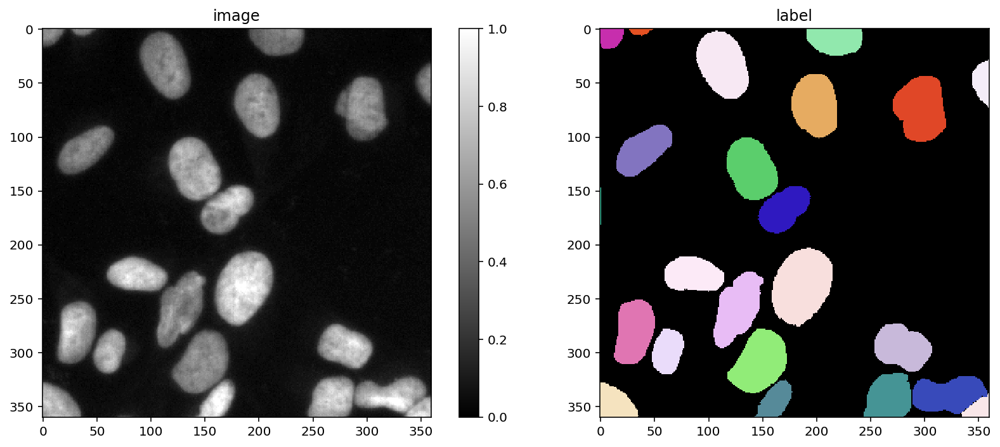

In [3]:
plot_img_label(X_trn[4], Y_trn[4])

## make sparse annotation

Find the darkest and brightest nuclei

1it [00:00,  8.99it/s]


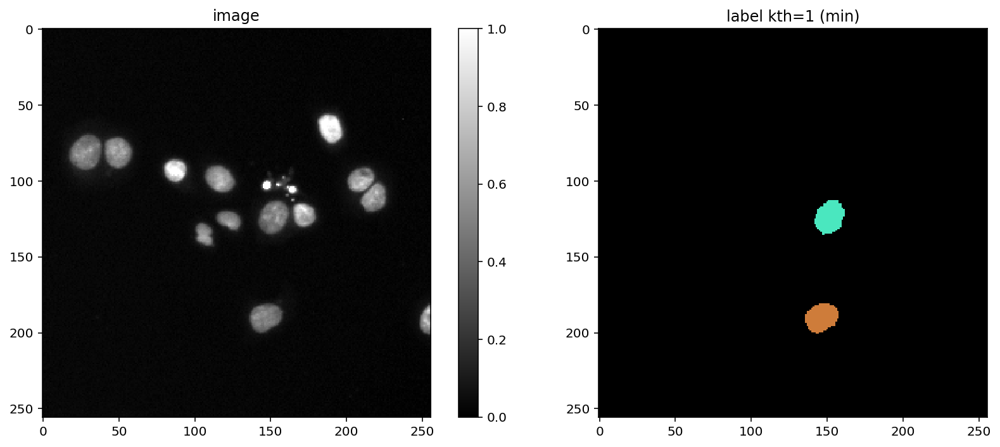

1it [00:00, 137.17it/s]


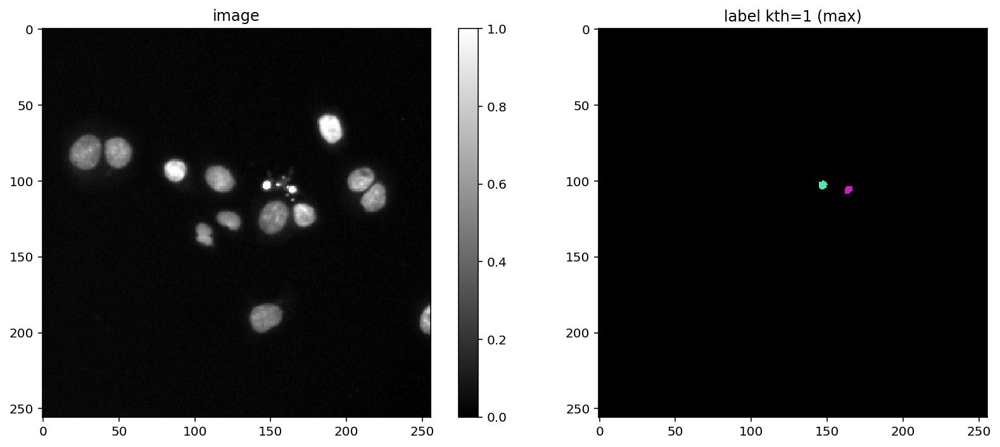

1it [00:00, 145.49it/s]


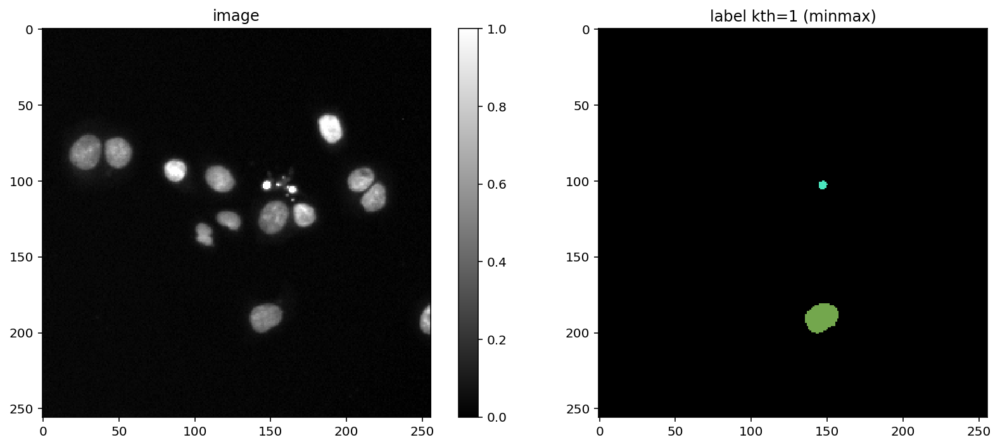

In [4]:
ind = 2
plot_img_label(X_trn[ind], to_sparse([X_trn[ind]], [Y_trn[ind]], 1, include_bg=False, mode='min')[0],
               lbl_title='label kth=1 (min)')
plot_img_label(X_trn[ind], to_sparse([X_trn[ind]], [Y_trn[ind]], 1, include_bg=False, mode='max')[0],
               lbl_title='label kth=1 (max)')
plot_img_label(X_trn[ind], to_sparse([X_trn[ind]], [Y_trn[ind]], 1, include_bg=False, mode='minmax')[0],
               lbl_title='label kth=1 (minmax)')

# Configuration

A `StarDist2D` model is specified via a `Config2D` object.

In [5]:
print(Config2D.__doc__)

Configuration for a :class:`StarDist2D` model.

    Parameters
    ----------
    axes : str or None
        Axes of the input images.
    n_rays : int
        Number of radial directions for the star-convex polygon.
        Recommended to use a power of 2 (default: 32).
    n_channel_in : int
        Number of channels of given input image (default: 1).
    grid : (int,int)
        Subsampling factors (must be powers of 2) for each of the axes.
        Model will predict on a subsampled grid for increased efficiency and larger field of view.
    n_classes : None or int
        Number of object classes to use for multi-class predection (use None to disable)
    backbone : str
        Name of the neural network architecture to be used as backbone.
    kwargs : dict
        Overwrite (or add) configuration attributes (see below).


    Attributes
    ----------
    unet_n_depth : int
        Number of U-Net resolution levels (down/up-sampling layers).
    unet_kernel_size : (int,int)
   

In [6]:
# 32 is a good default choice (see 1_data.ipynb)
n_rays = 32

# Use OpenCL-based computations for data generator during training (requires 'gputools')
use_gpu = False and gputools_available()

# Predict on subsampled grid for increased efficiency and larger field of view
grid = (2,2)

# number of training images per epoch is determined by train_batch_size * train_steps_per_epoch
train_batch_size = 8

conf = Config2D (
    n_rays       = n_rays,
    grid         = grid,
    use_gpu      = use_gpu,
    n_channel_in = 1,
    train_epochs = 100,
    train_patch_size = (224, 224),
    train_batch_size = train_batch_size,
    train_steps_per_epoch = len(X_trn) // train_batch_size + 1,
)
print(conf)
vars(conf)

Config2D(axes='YXC', backbone='unet', grid=(2, 2), n_channel_in=1, n_channel_out=33, n_classes=None, n_dim=2, n_rays=32, net_conv_after_unet=128, net_input_shape=(None, None, 1), net_mask_shape=(None, None, 1), train_background_reg=0.0001, train_batch_size=8, train_checkpoint='weights_best.h5', train_checkpoint_epoch='weights_now.h5', train_checkpoint_last='weights_last.h5', train_class_weights=(1, 1), train_completion_crop=32, train_dist_loss='mae', train_epochs=100, train_foreground_only=0.9, train_learning_rate=0.0003, train_loss_weights=(1, 0.2), train_n_val_patches=None, train_patch_size=(224, 224), train_reduce_lr={'factor': 0.5, 'patience': 40, 'min_delta': 0}, train_sample_cache=True, train_shape_completion=False, train_steps_per_epoch=56, train_tensorboard=True, unet_activation='relu', unet_batch_norm=False, unet_dropout=0.0, unet_kernel_size=(3, 3), unet_last_activation='relu', unet_n_conv_per_depth=2, unet_n_depth=3, unet_n_filter_base=32, unet_pool=(2, 2), unet_prefix='', u

{'n_dim': 2,
 'axes': 'YXC',
 'n_channel_in': 1,
 'n_channel_out': 33,
 'train_checkpoint': 'weights_best.h5',
 'train_checkpoint_last': 'weights_last.h5',
 'train_checkpoint_epoch': 'weights_now.h5',
 'n_rays': 32,
 'grid': (2, 2),
 'backbone': 'unet',
 'n_classes': None,
 'unet_n_depth': 3,
 'unet_kernel_size': (3, 3),
 'unet_n_filter_base': 32,
 'unet_n_conv_per_depth': 2,
 'unet_pool': (2, 2),
 'unet_activation': 'relu',
 'unet_last_activation': 'relu',
 'unet_batch_norm': False,
 'unet_dropout': 0.0,
 'unet_prefix': '',
 'net_conv_after_unet': 128,
 'net_input_shape': (None, None, 1),
 'net_mask_shape': (None, None, 1),
 'train_shape_completion': False,
 'train_completion_crop': 32,
 'train_patch_size': (224, 224),
 'train_background_reg': 0.0001,
 'train_foreground_only': 0.9,
 'train_sample_cache': True,
 'train_dist_loss': 'mae',
 'train_loss_weights': (1, 0.2),
 'train_class_weights': (1, 1),
 'train_epochs': 100,
 'train_steps_per_epoch': 56,
 'train_learning_rate': 0.0003,
 

In [7]:
if use_gpu:
    from csbdeep.utils.tf import limit_gpu_memory
    # adjust as necessary: limit GPU memory to be used by TensorFlow to leave some to OpenCL-based computations
    limit_gpu_memory(0.8)
    # alternatively, try this:
    # limit_gpu_memory(None, allow_growth=True)

**Note:** The trained `StarDist2D` model will *not* predict completed shapes for partially visible objects at the image boundary if `train_shape_completion=False` (which is the default option).

# Data Augmentation

You can define a function/callable that applies augmentation to each batch of the data generator.  
We here use an `augmenter` that applies random rotations, flips, and intensity changes, which are typically sensible for (2D) microscopy images (but you can disable augmentation by setting `augmenter = None`).

In [8]:
def random_fliprot(img, mask): 
    assert img.ndim >= mask.ndim
    axes = tuple(range(mask.ndim))
    perm = tuple(np.random.permutation(axes))
    img = img.transpose(perm + tuple(range(mask.ndim, img.ndim))) 
    mask = mask.transpose(perm) 
    for ax in axes: 
        if np.random.rand() > 0.5:
            img = np.flip(img, axis=ax)
            mask = np.flip(mask, axis=ax)
    return img, mask 

def random_intensity_change(img):
    img = img*np.random.uniform(0.6,2) + np.random.uniform(-0.2,0.2)
    return img


def augmenter(x, y):
    """Augmentation of a single input/label image pair.
    x is an input image
    y is the corresponding ground-truth label image
    """
    x, y = random_fliprot(x, y)
    x = random_intensity_change(x)
    # add some gaussian noise
    sig = 0.02*np.random.uniform(0,1)
    x = x + sig*np.random.normal(0,1,x.shape)
    return x, y

# Training

We recommend to monitor the progress during training with [TensorBoard](https://www.tensorflow.org/programmers_guide/summaries_and_tensorboard). You can start it in the shell from the current working directory like this:

    $ tensorboard --logdir=.

Then connect to [http://localhost:6006/](http://localhost:6006/) with your browser.

In [9]:
def train_model(X_trn, Y_trn, X_val, Y_val, description, **kwargs):
    conf = kwargs.get('conf', Config2D())
    basedir = kwargs.get('basedir', 'models')
    augmenter = kwargs.get('augmenter')
    
    model = StarDist2D(conf, name=description, basedir=basedir)
    model.train(X_trn, Y_trn, validation_data=(X_val,Y_val), augmenter=augmenter)

In [10]:
from skimage.measure import regionprops

In [11]:
def remove_small_labels(lbl, area_threshold):
    props = regionprops(lbl)
    for prop in props:
        if prop.area < area_threshold:
            lbl[prop.slice] = 0

In [12]:
def eval_model(X_val, description, **kwargs):
    conf = kwargs.get('conf', Config2D())
    basedir = kwargs.get('basedir', 'models')
    prob_thresh = kwargs.get('prob_thresh', 0.5)
    nms_thresh = kwargs.get('nms_thresh', 0.5)
    min_area = kwargs.get('min_area', 0)
    
    model = StarDist2D(conf, name=description, basedir=basedir)
    model.load_weights(conf.train_checkpoint_last)
    labels = [model.predict_instances(x,
                                      n_tiles=model._guess_n_tiles(x),
                                      show_tile_progress=False,
                                      prob_thresh=prob_thresh)[0]
              for x in tqdm(X_val)]
    if 0 < min_area:
        for lbl in labels:
            remove_small_labels(lbl, min_area)
    return labels

In [13]:
is_train = input('Train models? (existing models can be overwritten) (y/n): ').lower().strip() == 'y'

Train models? (existing models can be overwritten) (y/n): y


447it [00:05, 85.79it/s] 


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 9s 141ms/step - loss: 2.4137 - prob_loss: 0.7357 - dist_loss: 8.3901 - prob_kld: 0.7198 - dist_relevant_mae: 8.3898 - dist_relevant_mse: 137.9939 - dist_dist_iou_metric: 0.0696 - val_loss: 2.3677 - val_prob_loss: 0.6617 - val_dist_loss: 8.5301 - val_prob_kld: 0.5804 - val_dist_relevant_mae: 8.5296 - val_dist_relevant_mse: 151.9688 - val_dist_dist_iou_metric: 0.2489 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 107ms/step - loss: 2.0275 - prob_loss: 0.6990 - dist_loss: 6.6422 - prob_kld: 0.6918 - dist_relevant_mae: 6.6416 - dist_relevant_mse: 103.2351 - dist_dist_iou_metric: 0.2306 - val_loss: 2.2043 - val_prob_loss: 0.5554 - val_dist_loss: 8.2446 - val_prob_kld: 0.4741 - val_dist_relevant_mae: 8.2440 - val_dist_relevant_mse: 147.5714 - val_dist_dist_iou_metric: 0.2552 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 6s 109ms/step - 

Epoch 20/100
56/56 [==============================] - 5s 91ms/step - loss: 1.3310 - prob_loss: 0.6546 - dist_loss: 3.3818 - prob_kld: 0.7082 - dist_relevant_mae: 3.3812 - dist_relevant_mse: 33.5730 - dist_dist_iou_metric: 0.4903 - val_loss: 1.6867 - val_prob_loss: 0.6254 - val_dist_loss: 5.3066 - val_prob_kld: 0.5441 - val_dist_relevant_mae: 5.3062 - val_dist_relevant_mse: 77.6461 - val_dist_dist_iou_metric: 0.4429 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 5s 93ms/step - loss: 1.2354 - prob_loss: 0.6525 - dist_loss: 2.9142 - prob_kld: 0.7073 - dist_relevant_mae: 2.9137 - dist_relevant_mse: 23.3847 - dist_dist_iou_metric: 0.5126 - val_loss: 1.5509 - val_prob_loss: 0.6990 - val_dist_loss: 4.2597 - val_prob_kld: 0.6177 - val_dist_relevant_mae: 4.2592 - val_dist_relevant_mse: 48.5844 - val_dist_dist_iou_metric: 0.5368 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 5s 94ms/step - loss: 1.2783 - prob_loss: 0.6391 - dist_loss: 3.1960 - prob

Epoch 39/100
56/56 [==============================] - 5s 95ms/step - loss: 1.1555 - prob_loss: 0.6225 - dist_loss: 2.6651 - prob_kld: 1.1101 - dist_relevant_mae: 2.6645 - dist_relevant_mse: 21.2570 - dist_dist_iou_metric: 0.5659 - val_loss: 1.8335 - val_prob_loss: 1.1050 - val_dist_loss: 3.6425 - val_prob_kld: 1.0237 - val_dist_relevant_mae: 3.6421 - val_dist_relevant_mse: 36.4274 - val_dist_dist_iou_metric: 0.5931 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 5s 96ms/step - loss: 1.2122 - prob_loss: 0.6698 - dist_loss: 2.7116 - prob_kld: 0.9855 - dist_relevant_mae: 2.7110 - dist_relevant_mse: 22.8341 - dist_dist_iou_metric: 0.5694 - val_loss: 2.2186 - val_prob_loss: 1.5014 - val_dist_loss: 3.5863 - val_prob_kld: 1.4201 - val_dist_relevant_mae: 3.5859 - val_dist_relevant_mse: 34.7174 - val_dist_dist_iou_metric: 0.6077 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 5s 94ms/step - loss: 1.0628 - prob_loss: 0.6168 - dist_loss: 2.2301 - prob

Epoch 58/100
56/56 [==============================] - 5s 93ms/step - loss: 1.0540 - prob_loss: 0.6106 - dist_loss: 2.2172 - prob_kld: 1.1889 - dist_relevant_mae: 2.2168 - dist_relevant_mse: 15.5921 - dist_dist_iou_metric: 0.6091 - val_loss: 1.8468 - val_prob_loss: 1.1892 - val_dist_loss: 3.2879 - val_prob_kld: 1.1079 - val_dist_relevant_mae: 3.2876 - val_dist_relevant_mse: 30.8783 - val_dist_dist_iou_metric: 0.6280 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 5s 92ms/step - loss: 1.1119 - prob_loss: 0.6216 - dist_loss: 2.4516 - prob_kld: 1.0708 - dist_relevant_mae: 2.4511 - dist_relevant_mse: 20.5542 - dist_dist_iou_metric: 0.5983 - val_loss: 1.8786 - val_prob_loss: 1.1221 - val_dist_loss: 3.7828 - val_prob_kld: 1.0408 - val_dist_relevant_mae: 3.7822 - val_dist_relevant_mse: 37.4751 - val_dist_dist_iou_metric: 0.6058 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 5s 94ms/step - loss: 1.1254 - prob_loss: 0.6163 - dist_loss: 2.5457 - prob

56/56 [==============================] - 5s 93ms/step - loss: 1.0174 - prob_loss: 0.6010 - dist_loss: 2.0819 - prob_kld: 1.2490 - dist_relevant_mae: 2.0814 - dist_relevant_mse: 14.9607 - dist_dist_iou_metric: 0.6499 - val_loss: 2.1552 - val_prob_loss: 1.5519 - val_dist_loss: 3.0164 - val_prob_kld: 1.4706 - val_dist_relevant_mae: 3.0161 - val_dist_relevant_mse: 28.7372 - val_dist_dist_iou_metric: 0.6439 - lr: 1.5000e-04
Epoch 77/100
56/56 [==============================] - 5s 92ms/step - loss: 1.0413 - prob_loss: 0.6088 - dist_loss: 2.1625 - prob_kld: 1.3673 - dist_relevant_mae: 2.1620 - dist_relevant_mse: 14.1597 - dist_dist_iou_metric: 0.6199 - val_loss: 2.2272 - val_prob_loss: 1.4995 - val_dist_loss: 3.6389 - val_prob_kld: 1.4181 - val_dist_relevant_mae: 3.6386 - val_dist_relevant_mse: 41.9533 - val_dist_dist_iou_metric: 0.5961 - lr: 1.5000e-04
Epoch 78/100
56/56 [==============================] - 5s 91ms/step - loss: 1.0639 - prob_loss: 0.6097 - dist_loss: 2.2708 - prob_kld: 1.1853 

Epoch 95/100
56/56 [==============================] - 5s 94ms/step - loss: 1.0380 - prob_loss: 0.6088 - dist_loss: 2.1459 - prob_kld: 1.4433 - dist_relevant_mae: 2.1455 - dist_relevant_mse: 16.4957 - dist_dist_iou_metric: 0.6383 - val_loss: 2.0147 - val_prob_loss: 1.4291 - val_dist_loss: 2.9281 - val_prob_kld: 1.3478 - val_dist_relevant_mae: 2.9278 - val_dist_relevant_mse: 27.7076 - val_dist_dist_iou_metric: 0.6444 - lr: 1.5000e-04
Epoch 96/100
56/56 [==============================] - 5s 96ms/step - loss: 0.9735 - prob_loss: 0.6021 - dist_loss: 1.8567 - prob_kld: 1.3693 - dist_relevant_mae: 1.8563 - dist_relevant_mse: 11.2707 - dist_dist_iou_metric: 0.6641 - val_loss: 1.8608 - val_prob_loss: 1.2747 - val_dist_loss: 2.9307 - val_prob_kld: 1.1934 - val_dist_relevant_mae: 2.9304 - val_dist_relevant_mse: 26.3596 - val_dist_dist_iou_metric: 0.6635 - lr: 1.5000e-04
Epoch 97/100
56/56 [==============================] - 5s 91ms/step - loss: 0.9812 - prob_loss: 0.6015 - dist_loss: 1.8985 - prob

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/min_001


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [02:21<00:00,  2.84s/it]


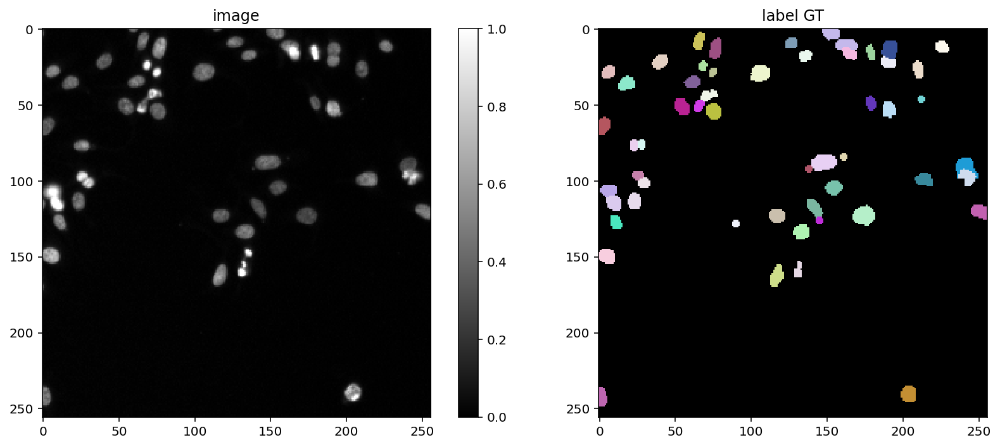

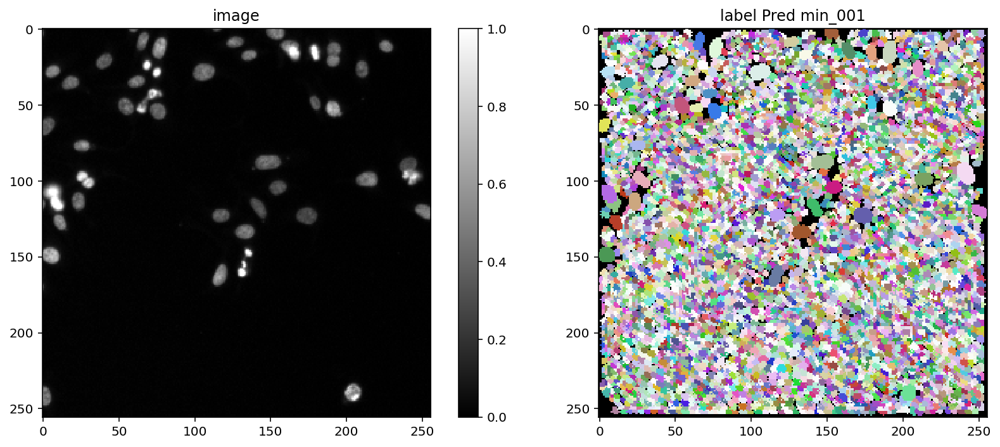

447it [00:04, 104.85it/s]


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 9s 143ms/step - loss: 2.8539 - prob_loss: 0.7264 - dist_loss: 10.6374 - prob_kld: 0.6203 - dist_relevant_mae: 10.6370 - dist_relevant_mse: 223.1403 - dist_dist_iou_metric: 0.1310 - val_loss: 2.0809 - val_prob_loss: 0.5704 - val_dist_loss: 7.5524 - val_prob_kld: 0.4849 - val_dist_relevant_mae: 7.5519 - val_dist_relevant_mse: 124.5242 - val_dist_dist_iou_metric: 0.2932 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 102ms/step - loss: 2.1689 - prob_loss: 0.6927 - dist_loss: 7.3812 - prob_kld: 0.5978 - dist_relevant_mae: 7.3805 - dist_relevant_mse: 116.6207 - dist_dist_iou_metric: 0.2951 - val_loss: 2.0710 - val_prob_loss: 0.6833 - val_dist_loss: 6.9389 - val_prob_kld: 0.5978 - val_dist_relevant_mae: 6.9384 - val_dist_relevant_mse: 110.8560 - val_dist_dist_iou_metric: 0.3084 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 5s 98ms/step -

Epoch 20/100
56/56 [==============================] - 5s 95ms/step - loss: 1.2158 - prob_loss: 0.6104 - dist_loss: 3.0271 - prob_kld: 0.6881 - dist_relevant_mae: 3.0266 - dist_relevant_mse: 25.0773 - dist_dist_iou_metric: 0.6131 - val_loss: 1.3454 - val_prob_loss: 0.6704 - val_dist_loss: 3.3748 - val_prob_kld: 0.5849 - val_dist_relevant_mae: 3.3744 - val_dist_relevant_mse: 29.2453 - val_dist_dist_iou_metric: 0.6191 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 5s 96ms/step - loss: 1.2449 - prob_loss: 0.6043 - dist_loss: 3.2029 - prob_kld: 0.7341 - dist_relevant_mae: 3.2024 - dist_relevant_mse: 28.2386 - dist_dist_iou_metric: 0.6156 - val_loss: 1.4581 - val_prob_loss: 0.7710 - val_dist_loss: 3.4354 - val_prob_kld: 0.6855 - val_dist_relevant_mae: 3.4351 - val_dist_relevant_mse: 30.3586 - val_dist_dist_iou_metric: 0.6063 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 5s 98ms/step - loss: 1.1915 - prob_loss: 0.6054 - dist_loss: 2.9303 - prob

Epoch 39/100
56/56 [==============================] - 5s 99ms/step - loss: 1.0938 - prob_loss: 0.6021 - dist_loss: 2.4584 - prob_kld: 0.9435 - dist_relevant_mae: 2.4579 - dist_relevant_mse: 16.8742 - dist_dist_iou_metric: 0.6853 - val_loss: 1.5541 - val_prob_loss: 1.0174 - val_dist_loss: 2.6831 - val_prob_kld: 0.9319 - val_dist_relevant_mae: 2.6827 - val_dist_relevant_mse: 21.6531 - val_dist_dist_iou_metric: 0.6859 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 6s 100ms/step - loss: 1.0675 - prob_loss: 0.5993 - dist_loss: 2.3410 - prob_kld: 1.0433 - dist_relevant_mae: 2.3405 - dist_relevant_mse: 15.4005 - dist_dist_iou_metric: 0.6935 - val_loss: 1.4452 - val_prob_loss: 0.8820 - val_dist_loss: 2.8163 - val_prob_kld: 0.7964 - val_dist_relevant_mae: 2.8159 - val_dist_relevant_mse: 23.1433 - val_dist_dist_iou_metric: 0.6602 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 5s 98ms/step - loss: 1.0570 - prob_loss: 0.5985 - dist_loss: 2.2923 - pro

Epoch 58/100
56/56 [==============================] - 5s 98ms/step - loss: 1.0753 - prob_loss: 0.5960 - dist_loss: 2.3964 - prob_kld: 1.0775 - dist_relevant_mae: 2.3960 - dist_relevant_mse: 16.1619 - dist_dist_iou_metric: 0.6918 - val_loss: 1.7430 - val_prob_loss: 1.2242 - val_dist_loss: 2.5937 - val_prob_kld: 1.1387 - val_dist_relevant_mae: 2.5933 - val_dist_relevant_mse: 19.5203 - val_dist_dist_iou_metric: 0.6841 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 5s 99ms/step - loss: 0.9944 - prob_loss: 0.5936 - dist_loss: 2.0038 - prob_kld: 1.1756 - dist_relevant_mae: 2.0034 - dist_relevant_mse: 11.6529 - dist_dist_iou_metric: 0.7230 - val_loss: 1.6543 - val_prob_loss: 1.1625 - val_dist_loss: 2.4591 - val_prob_kld: 1.0770 - val_dist_relevant_mae: 2.4587 - val_dist_relevant_mse: 18.2948 - val_dist_dist_iou_metric: 0.7111 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 5s 99ms/step - loss: 1.0299 - prob_loss: 0.5991 - dist_loss: 2.1542 - prob

Epoch 77/100
56/56 [==============================] - 6s 99ms/step - loss: 0.9805 - prob_loss: 0.5945 - dist_loss: 1.9300 - prob_kld: 1.1300 - dist_relevant_mae: 1.9295 - dist_relevant_mse: 11.2022 - dist_dist_iou_metric: 0.7393 - val_loss: 1.2669 - val_prob_loss: 0.8061 - val_dist_loss: 2.3039 - val_prob_kld: 0.7206 - val_dist_relevant_mae: 2.3033 - val_dist_relevant_mse: 17.5456 - val_dist_dist_iou_metric: 0.7274 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 6s 101ms/step - loss: 0.9995 - prob_loss: 0.5935 - dist_loss: 2.0301 - prob_kld: 1.1144 - dist_relevant_mae: 2.0296 - dist_relevant_mse: 11.4747 - dist_dist_iou_metric: 0.7262 - val_loss: 1.7387 - val_prob_loss: 1.2790 - val_dist_loss: 2.2986 - val_prob_kld: 1.1935 - val_dist_relevant_mae: 2.2983 - val_dist_relevant_mse: 16.2628 - val_dist_dist_iou_metric: 0.7190 - lr: 3.0000e-04
Epoch 79/100
56/56 [==============================] - 5s 99ms/step - loss: 0.9874 - prob_loss: 0.5957 - dist_loss: 1.9586 - pro

56/56 [==============================] - 5s 97ms/step - loss: 0.9277 - prob_loss: 0.5909 - dist_loss: 1.6839 - prob_kld: 1.1803 - dist_relevant_mae: 1.6834 - dist_relevant_mse: 8.7249 - dist_dist_iou_metric: 0.7617 - val_loss: 1.5999 - val_prob_loss: 1.1784 - val_dist_loss: 2.1075 - val_prob_kld: 1.0929 - val_dist_relevant_mae: 2.1070 - val_dist_relevant_mse: 14.3166 - val_dist_dist_iou_metric: 0.7306 - lr: 1.5000e-04
Epoch 96/100
56/56 [==============================] - 6s 101ms/step - loss: 0.9371 - prob_loss: 0.5863 - dist_loss: 1.7543 - prob_kld: 1.1500 - dist_relevant_mae: 1.7538 - dist_relevant_mse: 9.3679 - dist_dist_iou_metric: 0.7654 - val_loss: 1.5914 - val_prob_loss: 1.1662 - val_dist_loss: 2.1262 - val_prob_kld: 1.0807 - val_dist_relevant_mae: 2.1258 - val_dist_relevant_mse: 14.8874 - val_dist_dist_iou_metric: 0.7445 - lr: 1.5000e-04
Epoch 97/100
56/56 [==============================] - 6s 100ms/step - loss: 0.9545 - prob_loss: 0.5871 - dist_loss: 1.8371 - prob_kld: 1.1845 

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/min_004


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [02:56<00:00,  3.52s/it]


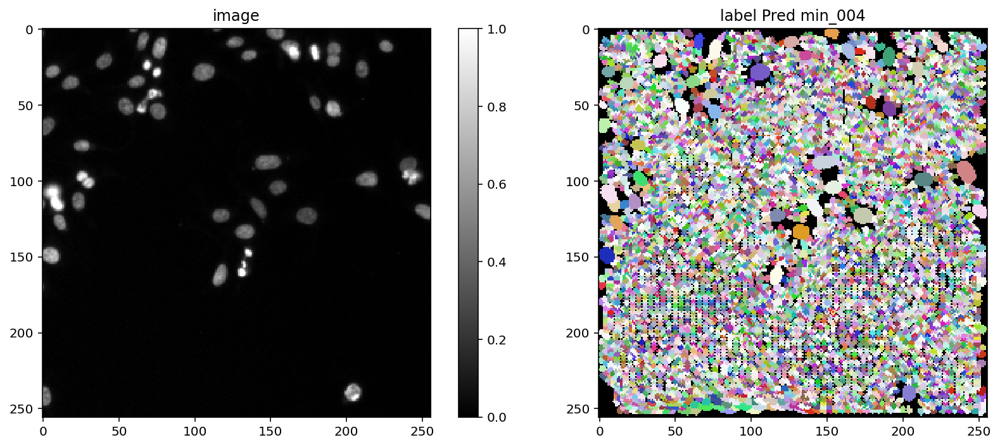

447it [00:04, 103.04it/s]


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 11s 151ms/step - loss: 2.8240 - prob_loss: 0.7127 - dist_loss: 10.5561 - prob_kld: 0.5991 - dist_relevant_mae: 10.5556 - dist_relevant_mse: 215.0847 - dist_dist_iou_metric: 0.1477 - val_loss: 2.4727 - val_prob_loss: 0.6131 - val_dist_loss: 9.2977 - val_prob_kld: 0.5363 - val_dist_relevant_mae: 9.2973 - val_dist_relevant_mse: 178.5559 - val_dist_dist_iou_metric: 0.1505 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 106ms/step - loss: 2.1741 - prob_loss: 0.6911 - dist_loss: 7.4145 - prob_kld: 0.5906 - dist_relevant_mae: 7.4138 - dist_relevant_mse: 116.0853 - dist_dist_iou_metric: 0.2937 - val_loss: 2.2025 - val_prob_loss: 0.5453 - val_dist_loss: 8.2864 - val_prob_kld: 0.4684 - val_dist_relevant_mae: 8.2853 - val_dist_relevant_mse: 109.6571 - val_dist_dist_iou_metric: 0.3931 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 6s 107ms/step

Epoch 20/100
56/56 [==============================] - 6s 109ms/step - loss: 1.1916 - prob_loss: 0.6320 - dist_loss: 2.7978 - prob_kld: 0.5446 - dist_relevant_mae: 2.7973 - dist_relevant_mse: 22.4818 - dist_dist_iou_metric: 0.6491 - val_loss: 1.1317 - val_prob_loss: 0.5409 - val_dist_loss: 2.9540 - val_prob_kld: 0.4641 - val_dist_relevant_mae: 2.9536 - val_dist_relevant_mse: 25.6763 - val_dist_dist_iou_metric: 0.6407 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 6s 110ms/step - loss: 1.1460 - prob_loss: 0.6037 - dist_loss: 2.7112 - prob_kld: 0.5351 - dist_relevant_mae: 2.7107 - dist_relevant_mse: 20.5280 - dist_dist_iou_metric: 0.6530 - val_loss: 1.1578 - val_prob_loss: 0.5915 - val_dist_loss: 2.8315 - val_prob_kld: 0.5146 - val_dist_relevant_mae: 2.8311 - val_dist_relevant_mse: 22.9382 - val_dist_dist_iou_metric: 0.6655 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 6s 110ms/step - loss: 1.1485 - prob_loss: 0.6045 - dist_loss: 2.7200 - p

Epoch 39/100
56/56 [==============================] - 6s 112ms/step - loss: 1.0452 - prob_loss: 0.5978 - dist_loss: 2.2370 - prob_kld: 0.6726 - dist_relevant_mae: 2.2365 - dist_relevant_mse: 15.0206 - dist_dist_iou_metric: 0.7067 - val_loss: 1.1884 - val_prob_loss: 0.7218 - val_dist_loss: 2.3332 - val_prob_kld: 0.6449 - val_dist_relevant_mae: 2.3328 - val_dist_relevant_mse: 16.8369 - val_dist_dist_iou_metric: 0.7220 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 6s 110ms/step - loss: 1.0233 - prob_loss: 0.5969 - dist_loss: 2.1321 - prob_kld: 0.7401 - dist_relevant_mae: 2.1316 - dist_relevant_mse: 13.8097 - dist_dist_iou_metric: 0.7147 - val_loss: 1.2769 - val_prob_loss: 0.8097 - val_dist_loss: 2.3363 - val_prob_kld: 0.7328 - val_dist_relevant_mae: 2.3359 - val_dist_relevant_mse: 16.8468 - val_dist_dist_iou_metric: 0.7226 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 6s 109ms/step - loss: 1.0592 - prob_loss: 0.6091 - dist_loss: 2.2504 - p

Epoch 58/100
56/56 [==============================] - 5s 95ms/step - loss: 0.9865 - prob_loss: 0.5947 - dist_loss: 1.9588 - prob_kld: 0.6136 - dist_relevant_mae: 1.9583 - dist_relevant_mse: 11.8839 - dist_dist_iou_metric: 0.7387 - val_loss: 1.0321 - val_prob_loss: 0.6400 - val_dist_loss: 1.9609 - val_prob_kld: 0.5631 - val_dist_relevant_mae: 1.9605 - val_dist_relevant_mse: 12.3301 - val_dist_dist_iou_metric: 0.7440 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 5s 96ms/step - loss: 0.9812 - prob_loss: 0.5954 - dist_loss: 1.9291 - prob_kld: 0.6758 - dist_relevant_mae: 1.9287 - dist_relevant_mse: 11.4772 - dist_dist_iou_metric: 0.7394 - val_loss: 1.1069 - val_prob_loss: 0.7054 - val_dist_loss: 2.0077 - val_prob_kld: 0.6285 - val_dist_relevant_mae: 2.0073 - val_dist_relevant_mse: 12.4396 - val_dist_dist_iou_metric: 0.7515 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 5s 95ms/step - loss: 0.9721 - prob_loss: 0.5881 - dist_loss: 1.9199 - prob

56/56 [==============================] - 6s 112ms/step - loss: 0.9405 - prob_loss: 0.5884 - dist_loss: 1.7608 - prob_kld: 1.0021 - dist_relevant_mae: 1.7604 - dist_relevant_mse: 9.2704 - dist_dist_iou_metric: 0.7622 - val_loss: 1.4614 - val_prob_loss: 1.0788 - val_dist_loss: 1.9127 - val_prob_kld: 1.0020 - val_dist_relevant_mae: 1.9123 - val_dist_relevant_mse: 11.8144 - val_dist_dist_iou_metric: 0.7578 - lr: 3.0000e-04
Epoch 77/100
56/56 [==============================] - 6s 113ms/step - loss: 0.9384 - prob_loss: 0.5918 - dist_loss: 1.7332 - prob_kld: 0.9582 - dist_relevant_mae: 1.7328 - dist_relevant_mse: 9.1151 - dist_dist_iou_metric: 0.7647 - val_loss: 1.2975 - val_prob_loss: 0.9194 - val_dist_loss: 1.8904 - val_prob_kld: 0.8426 - val_dist_relevant_mae: 1.8900 - val_dist_relevant_mse: 11.9642 - val_dist_dist_iou_metric: 0.7633 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 6s 113ms/step - loss: 0.9397 - prob_loss: 0.5928 - dist_loss: 1.7349 - prob_kld: 0.9499

Epoch 95/100
56/56 [==============================] - 6s 111ms/step - loss: 0.9027 - prob_loss: 0.5861 - dist_loss: 1.5831 - prob_kld: 1.1898 - dist_relevant_mae: 1.5827 - dist_relevant_mse: 7.9105 - dist_dist_iou_metric: 0.7792 - val_loss: 1.6478 - val_prob_loss: 1.3048 - val_dist_loss: 1.7146 - val_prob_kld: 1.2280 - val_dist_relevant_mae: 1.7143 - val_dist_relevant_mse: 9.6251 - val_dist_dist_iou_metric: 0.7790 - lr: 1.5000e-04
Epoch 96/100
56/56 [==============================] - 6s 111ms/step - loss: 0.9167 - prob_loss: 0.5860 - dist_loss: 1.6535 - prob_kld: 1.2220 - dist_relevant_mae: 1.6531 - dist_relevant_mse: 8.4569 - dist_dist_iou_metric: 0.7737 - val_loss: 1.6877 - val_prob_loss: 1.3578 - val_dist_loss: 1.6494 - val_prob_kld: 1.2809 - val_dist_relevant_mae: 1.6490 - val_dist_relevant_mse: 9.3237 - val_dist_dist_iou_metric: 0.7841 - lr: 1.5000e-04
Epoch 97/100
56/56 [==============================] - 6s 111ms/step - loss: 0.8963 - prob_loss: 0.5888 - dist_loss: 1.5373 - prob_

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/min_016


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [02:47<00:00,  3.34s/it]


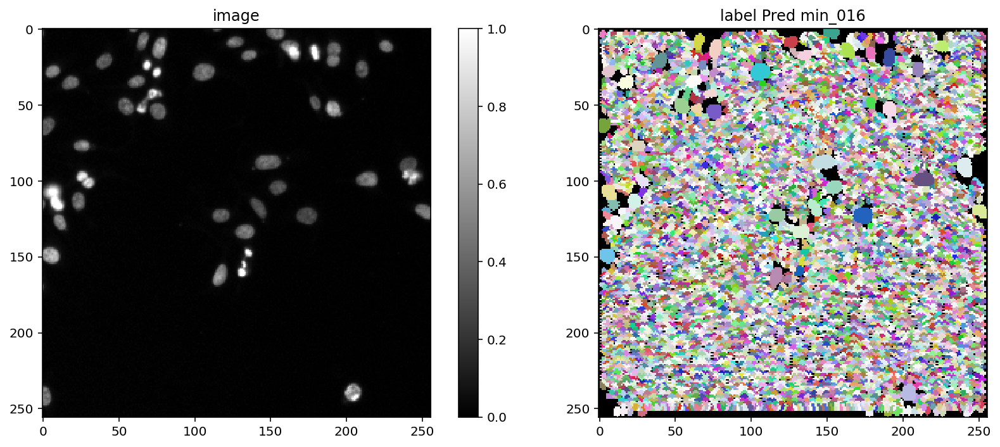

447it [00:06, 65.03it/s] 


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 10s 151ms/step - loss: 2.6877 - prob_loss: 0.7270 - dist_loss: 9.8037 - prob_kld: 0.6041 - dist_relevant_mae: 9.8033 - dist_relevant_mse: 188.1513 - dist_dist_iou_metric: 0.1693 - val_loss: 2.1449 - val_prob_loss: 0.5208 - val_dist_loss: 8.1205 - val_prob_kld: 0.4381 - val_dist_relevant_mae: 8.1201 - val_dist_relevant_mse: 142.7574 - val_dist_dist_iou_metric: 0.2354 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 106ms/step - loss: 2.2468 - prob_loss: 0.7013 - dist_loss: 7.7278 - prob_kld: 0.5780 - dist_relevant_mae: 7.7271 - dist_relevant_mse: 123.2855 - dist_dist_iou_metric: 0.2803 - val_loss: 1.9685 - val_prob_loss: 0.6180 - val_dist_loss: 6.7524 - val_prob_kld: 0.5353 - val_dist_relevant_mae: 6.7518 - val_dist_relevant_mse: 98.9871 - val_dist_dist_iou_metric: 0.3450 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 5s 97ms/step - l

Epoch 20/100
56/56 [==============================] - 5s 94ms/step - loss: 1.1437 - prob_loss: 0.6028 - dist_loss: 2.7041 - prob_kld: 0.5406 - dist_relevant_mae: 2.7036 - dist_relevant_mse: 20.7427 - dist_dist_iou_metric: 0.6523 - val_loss: 1.1612 - val_prob_loss: 0.5923 - val_dist_loss: 2.8443 - val_prob_kld: 0.5096 - val_dist_relevant_mae: 2.8439 - val_dist_relevant_mse: 23.6348 - val_dist_dist_iou_metric: 0.6569 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 5s 96ms/step - loss: 1.1673 - prob_loss: 0.6026 - dist_loss: 2.8233 - prob_kld: 0.5574 - dist_relevant_mae: 2.8228 - dist_relevant_mse: 22.7285 - dist_dist_iou_metric: 0.6480 - val_loss: 1.1650 - val_prob_loss: 0.5879 - val_dist_loss: 2.8854 - val_prob_kld: 0.5053 - val_dist_relevant_mae: 2.8850 - val_dist_relevant_mse: 22.9357 - val_dist_dist_iou_metric: 0.6454 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 5s 94ms/step - loss: 1.1063 - prob_loss: 0.6020 - dist_loss: 2.5213 - prob

Epoch 39/100
56/56 [==============================] - 5s 97ms/step - loss: 1.0473 - prob_loss: 0.5960 - dist_loss: 2.2567 - prob_kld: 0.9625 - dist_relevant_mae: 2.2563 - dist_relevant_mse: 15.1849 - dist_dist_iou_metric: 0.7034 - val_loss: 1.6007 - val_prob_loss: 1.1506 - val_dist_loss: 2.2501 - val_prob_kld: 1.0680 - val_dist_relevant_mae: 2.2497 - val_dist_relevant_mse: 15.3002 - val_dist_dist_iou_metric: 0.7098 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 5s 98ms/step - loss: 1.0208 - prob_loss: 0.5949 - dist_loss: 2.1294 - prob_kld: 1.0195 - dist_relevant_mae: 2.1289 - dist_relevant_mse: 13.8971 - dist_dist_iou_metric: 0.7154 - val_loss: 1.5691 - val_prob_loss: 1.1351 - val_dist_loss: 2.1701 - val_prob_kld: 1.0524 - val_dist_relevant_mae: 2.1697 - val_dist_relevant_mse: 13.7456 - val_dist_dist_iou_metric: 0.7277 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 5s 97ms/step - loss: 1.0451 - prob_loss: 0.5924 - dist_loss: 2.2638 - prob

Epoch 58/100
56/56 [==============================] - ETA: 0s - loss: 0.9858 - prob_loss: 0.6000 - dist_loss: 1.9287 - prob_kld: 0.8841 - dist_relevant_mae: 1.9283 - dist_relevant_mse: 10.9788 - dist_dist_iou_metric: 0.7383
Epoch 00058: ReduceLROnPlateau reducing learning rate to 0.0001500000071246177.
56/56 [==============================] - 5s 98ms/step - loss: 0.9858 - prob_loss: 0.6000 - dist_loss: 1.9287 - prob_kld: 0.8841 - dist_relevant_mae: 1.9283 - dist_relevant_mse: 10.9788 - dist_dist_iou_metric: 0.7383 - val_loss: 1.2772 - val_prob_loss: 0.8884 - val_dist_loss: 1.9437 - val_prob_kld: 0.8057 - val_dist_relevant_mae: 1.9433 - val_dist_relevant_mse: 11.0971 - val_dist_dist_iou_metric: 0.7476 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 5s 95ms/step - loss: 0.9344 - prob_loss: 0.5889 - dist_loss: 1.7275 - prob_kld: 0.8630 - dist_relevant_mae: 1.7271 - dist_relevant_mse: 9.1870 - dist_dist_iou_metric: 0.7630 - val_loss: 1.3146 - val_prob_loss: 0.9454 - 

56/56 [==============================] - 5s 99ms/step - loss: 0.9130 - prob_loss: 0.5876 - dist_loss: 1.6272 - prob_kld: 1.0606 - dist_relevant_mae: 1.6268 - dist_relevant_mse: 7.8288 - dist_dist_iou_metric: 0.7714 - val_loss: 1.5161 - val_prob_loss: 1.1684 - val_dist_loss: 1.7388 - val_prob_kld: 1.0857 - val_dist_relevant_mae: 1.7384 - val_dist_relevant_mse: 9.3773 - val_dist_dist_iou_metric: 0.7725 - lr: 1.5000e-04
Epoch 77/100
56/56 [==============================] - 5s 96ms/step - loss: 0.9296 - prob_loss: 0.5888 - dist_loss: 1.7038 - prob_kld: 1.0196 - dist_relevant_mae: 1.7034 - dist_relevant_mse: 8.8698 - dist_dist_iou_metric: 0.7625 - val_loss: 1.3218 - val_prob_loss: 0.9472 - val_dist_loss: 1.8729 - val_prob_kld: 0.8645 - val_dist_relevant_mae: 1.8726 - val_dist_relevant_mse: 10.0319 - val_dist_dist_iou_metric: 0.7681 - lr: 1.5000e-04
Epoch 78/100
56/56 [==============================] - 5s 97ms/step - loss: 0.9350 - prob_loss: 0.5866 - dist_loss: 1.7422 - prob_kld: 1.0622 - d

Epoch 95/100
56/56 [==============================] - 5s 96ms/step - loss: 0.9069 - prob_loss: 0.5856 - dist_loss: 1.6064 - prob_kld: 1.0746 - dist_relevant_mae: 1.6061 - dist_relevant_mse: 7.7560 - dist_dist_iou_metric: 0.7751 - val_loss: 1.4702 - val_prob_loss: 1.1301 - val_dist_loss: 1.7007 - val_prob_kld: 1.0474 - val_dist_relevant_mae: 1.7004 - val_dist_relevant_mse: 8.8561 - val_dist_dist_iou_metric: 0.7801 - lr: 1.5000e-04
Epoch 96/100
56/56 [==============================] - 5s 97ms/step - loss: 0.9183 - prob_loss: 0.5908 - dist_loss: 1.6374 - prob_kld: 1.1045 - dist_relevant_mae: 1.6370 - dist_relevant_mse: 8.3571 - dist_dist_iou_metric: 0.7722 - val_loss: 1.5304 - val_prob_loss: 1.1695 - val_dist_loss: 1.8042 - val_prob_kld: 1.0869 - val_dist_relevant_mae: 1.8038 - val_dist_relevant_mse: 9.5102 - val_dist_dist_iou_metric: 0.7560 - lr: 1.5000e-04
Epoch 97/100
56/56 [==============================] - 5s 96ms/step - loss: 0.9203 - prob_loss: 0.5894 - dist_loss: 1.6545 - prob_kld

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/min_064


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [02:45<00:00,  3.31s/it]


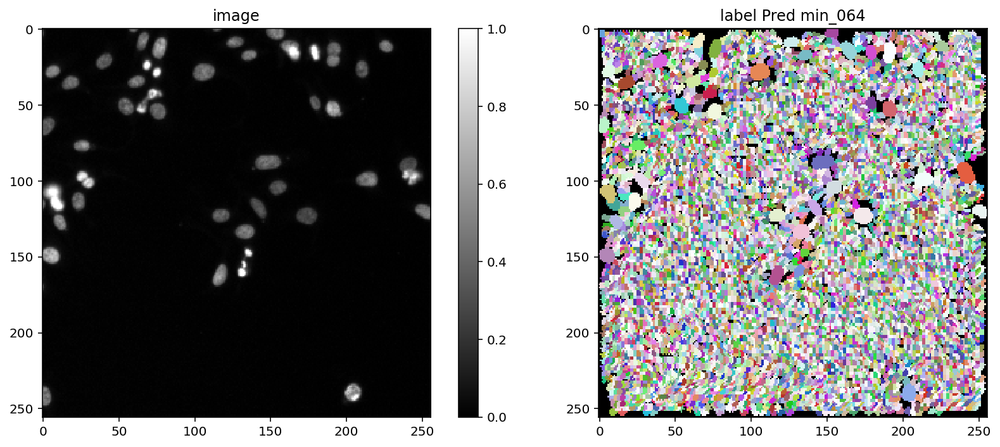

447it [00:04, 99.96it/s] 


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 9s 145ms/step - loss: 2.8387 - prob_loss: 0.7153 - dist_loss: 10.6173 - prob_kld: 0.5996 - dist_relevant_mae: 10.6170 - dist_relevant_mse: 210.0184 - dist_dist_iou_metric: 0.1083 - val_loss: 2.2333 - val_prob_loss: 0.5447 - val_dist_loss: 8.4428 - val_prob_kld: 0.4610 - val_dist_relevant_mae: 8.4423 - val_dist_relevant_mse: 151.1038 - val_dist_dist_iou_metric: 0.2391 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 105ms/step - loss: 2.1641 - prob_loss: 0.6928 - dist_loss: 7.3563 - prob_kld: 0.5879 - dist_relevant_mae: 7.3555 - dist_relevant_mse: 111.1900 - dist_dist_iou_metric: 0.3023 - val_loss: 1.9973 - val_prob_loss: 0.6165 - val_dist_loss: 6.9039 - val_prob_kld: 0.5328 - val_dist_relevant_mae: 6.9034 - val_dist_relevant_mse: 107.1188 - val_dist_dist_iou_metric: 0.3240 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 6s 104ms/step 

Epoch 20/100
56/56 [==============================] - 5s 95ms/step - loss: 1.1434 - prob_loss: 0.6011 - dist_loss: 2.7113 - prob_kld: 0.7046 - dist_relevant_mae: 2.7108 - dist_relevant_mse: 20.7188 - dist_dist_iou_metric: 0.6581 - val_loss: 1.3378 - val_prob_loss: 0.7384 - val_dist_loss: 2.9970 - val_prob_kld: 0.6547 - val_dist_relevant_mae: 2.9965 - val_dist_relevant_mse: 27.2424 - val_dist_dist_iou_metric: 0.6521 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 5s 95ms/step - loss: 1.1297 - prob_loss: 0.6043 - dist_loss: 2.6269 - prob_kld: 0.6853 - dist_relevant_mae: 2.6264 - dist_relevant_mse: 19.9818 - dist_dist_iou_metric: 0.6621 - val_loss: 1.1959 - val_prob_loss: 0.6144 - val_dist_loss: 2.9073 - val_prob_kld: 0.5307 - val_dist_relevant_mae: 2.9069 - val_dist_relevant_mse: 25.3168 - val_dist_dist_iou_metric: 0.6659 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 5s 96ms/step - loss: 1.1247 - prob_loss: 0.6017 - dist_loss: 2.6150 - prob

Epoch 39/100
56/56 [==============================] - 5s 98ms/step - loss: 1.0010 - prob_loss: 0.5943 - dist_loss: 2.0334 - prob_kld: 0.9060 - dist_relevant_mae: 2.0329 - dist_relevant_mse: 12.2037 - dist_dist_iou_metric: 0.7252 - val_loss: 1.4276 - val_prob_loss: 0.9617 - val_dist_loss: 2.3294 - val_prob_kld: 0.8780 - val_dist_relevant_mae: 2.3290 - val_dist_relevant_mse: 17.4318 - val_dist_dist_iou_metric: 0.7056 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 5s 97ms/step - loss: 1.0008 - prob_loss: 0.6038 - dist_loss: 1.9852 - prob_kld: 0.9061 - dist_relevant_mae: 1.9847 - dist_relevant_mse: 11.4521 - dist_dist_iou_metric: 0.7285 - val_loss: 1.5126 - val_prob_loss: 1.0593 - val_dist_loss: 2.2665 - val_prob_kld: 0.9756 - val_dist_relevant_mae: 2.2662 - val_dist_relevant_mse: 16.9133 - val_dist_dist_iou_metric: 0.7150 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 5s 98ms/step - loss: 1.0159 - prob_loss: 0.6001 - dist_loss: 2.0788 - prob

Epoch 58/100
56/56 [==============================] - 6s 99ms/step - loss: 0.9560 - prob_loss: 0.5886 - dist_loss: 1.8373 - prob_kld: 1.0391 - dist_relevant_mae: 1.8369 - dist_relevant_mse: 10.1419 - dist_dist_iou_metric: 0.7557 - val_loss: 1.5155 - val_prob_loss: 1.1010 - val_dist_loss: 2.0723 - val_prob_kld: 1.0173 - val_dist_relevant_mae: 2.0719 - val_dist_relevant_mse: 14.5116 - val_dist_dist_iou_metric: 0.7495 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 6s 100ms/step - loss: 0.9486 - prob_loss: 0.5904 - dist_loss: 1.7908 - prob_kld: 1.0184 - dist_relevant_mae: 1.7904 - dist_relevant_mse: 9.8075 - dist_dist_iou_metric: 0.7530 - val_loss: 1.3996 - val_prob_loss: 0.9918 - val_dist_loss: 2.0389 - val_prob_kld: 0.9081 - val_dist_relevant_mae: 2.0384 - val_dist_relevant_mse: 14.1843 - val_dist_dist_iou_metric: 0.7467 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 6s 102ms/step - loss: 0.9632 - prob_loss: 0.5935 - dist_loss: 1.8488 - pro

Epoch 77/100
56/56 [==============================] - 6s 101ms/step - loss: 0.9408 - prob_loss: 0.5872 - dist_loss: 1.7680 - prob_kld: 1.0827 - dist_relevant_mae: 1.7676 - dist_relevant_mse: 9.3344 - dist_dist_iou_metric: 0.7606 - val_loss: 1.4880 - val_prob_loss: 1.0711 - val_dist_loss: 2.0847 - val_prob_kld: 0.9874 - val_dist_relevant_mae: 2.0843 - val_dist_relevant_mse: 16.0326 - val_dist_dist_iou_metric: 0.7508 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 6s 104ms/step - loss: 0.9283 - prob_loss: 0.5950 - dist_loss: 1.6664 - prob_kld: 1.0546 - dist_relevant_mae: 1.6660 - dist_relevant_mse: 8.3060 - dist_dist_iou_metric: 0.7678 - val_loss: 1.2848 - val_prob_loss: 0.9025 - val_dist_loss: 1.9116 - val_prob_kld: 0.8188 - val_dist_relevant_mae: 1.9112 - val_dist_relevant_mse: 13.2048 - val_dist_dist_iou_metric: 0.7665 - lr: 3.0000e-04
Epoch 79/100
56/56 [==============================] - 6s 101ms/step - loss: 0.9387 - prob_loss: 0.5902 - dist_loss: 1.7428 - pro

Epoch 96/100
56/56 [==============================] - 6s 101ms/step - loss: 0.9181 - prob_loss: 0.5925 - dist_loss: 1.6280 - prob_kld: 1.1285 - dist_relevant_mae: 1.6276 - dist_relevant_mse: 8.1008 - dist_dist_iou_metric: 0.7769 - val_loss: 1.4249 - val_prob_loss: 1.0614 - val_dist_loss: 1.8171 - val_prob_kld: 0.9777 - val_dist_relevant_mae: 1.8167 - val_dist_relevant_mse: 12.1045 - val_dist_dist_iou_metric: 0.7756 - lr: 3.0000e-04
Epoch 97/100
56/56 [==============================] - 6s 100ms/step - loss: 0.9290 - prob_loss: 0.6102 - dist_loss: 1.5940 - prob_kld: 1.0446 - dist_relevant_mae: 1.5936 - dist_relevant_mse: 8.0577 - dist_dist_iou_metric: 0.7738 - val_loss: 1.6220 - val_prob_loss: 1.2579 - val_dist_loss: 1.8204 - val_prob_kld: 1.1742 - val_dist_relevant_mae: 1.8200 - val_dist_relevant_mse: 11.6070 - val_dist_dist_iou_metric: 0.7680 - lr: 3.0000e-04
Epoch 98/100
56/56 [==============================] - 6s 102ms/step - loss: 0.9393 - prob_loss: 0.5993 - dist_loss: 1.6998 - pro

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/min_256


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [02:16<00:00,  2.73s/it]


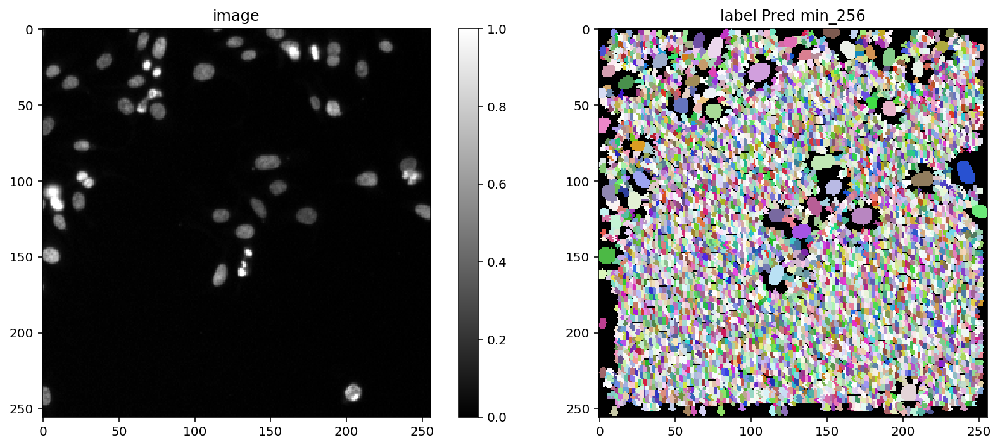

Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 11s 157ms/step - loss: 2.7805 - prob_loss: 0.4085 - dist_loss: 11.8598 - prob_kld: 0.3318 - dist_relevant_mae: 11.8596 - dist_relevant_mse: 253.1992 - dist_dist_iou_metric: 0.0672 - val_loss: 2.3302 - val_prob_loss: 0.3192 - val_dist_loss: 10.0553 - val_prob_kld: 0.2384 - val_dist_relevant_mae: 10.0549 - val_dist_relevant_mse: 204.2335 - val_dist_dist_iou_metric: 0.1442 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 109ms/step - loss: 1.8207 - prob_loss: 0.2883 - dist_loss: 7.6620 - prob_kld: 0.2126 - dist_relevant_mae: 7.6612 - dist_relevant_mse: 119.5691 - dist_dist_iou_metric: 0.2947 - val_loss: 1.8984 - val_prob_loss: 0.2917 - val_dist_loss: 8.0337 - val_prob_kld: 0.2109 - val_dist_relevant_mae: 8.0331 - val_dist_relevant_mse: 142.5609 - val_dist_dist_iou_metric: 0.2327 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 6s 109ms/st

Epoch 20/100
56/56 [==============================] - 6s 102ms/step - loss: 0.6269 - prob_loss: 0.0961 - dist_loss: 2.6540 - prob_kld: 0.0211 - dist_relevant_mae: 2.6534 - dist_relevant_mse: 20.8409 - dist_dist_iou_metric: 0.6720 - val_loss: 0.6245 - val_prob_loss: 0.0987 - val_dist_loss: 2.6288 - val_prob_kld: 0.0179 - val_dist_relevant_mae: 2.6283 - val_dist_relevant_mse: 18.6887 - val_dist_dist_iou_metric: 0.6700 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 6s 100ms/step - loss: 0.6667 - prob_loss: 0.0959 - dist_loss: 2.8539 - prob_kld: 0.0186 - dist_relevant_mae: 2.8533 - dist_relevant_mse: 22.0730 - dist_dist_iou_metric: 0.6529 - val_loss: 0.6547 - val_prob_loss: 0.0980 - val_dist_loss: 2.7835 - val_prob_kld: 0.0171 - val_dist_relevant_mae: 2.7830 - val_dist_relevant_mse: 21.8231 - val_dist_dist_iou_metric: 0.6462 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 6s 104ms/step - loss: 0.6293 - prob_loss: 0.0930 - dist_loss: 2.6815 - p

Epoch 39/100
56/56 [==============================] - 6s 101ms/step - loss: 0.5271 - prob_loss: 0.0915 - dist_loss: 2.1782 - prob_kld: 0.0159 - dist_relevant_mae: 2.1777 - dist_relevant_mse: 14.0033 - dist_dist_iou_metric: 0.7193 - val_loss: 0.5314 - val_prob_loss: 0.0970 - val_dist_loss: 2.1719 - val_prob_kld: 0.0162 - val_dist_relevant_mae: 2.1715 - val_dist_relevant_mse: 13.8360 - val_dist_dist_iou_metric: 0.7107 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 6s 102ms/step - loss: 0.5533 - prob_loss: 0.0949 - dist_loss: 2.2920 - prob_kld: 0.0171 - dist_relevant_mae: 2.2915 - dist_relevant_mse: 15.3341 - dist_dist_iou_metric: 0.7111 - val_loss: 0.5429 - val_prob_loss: 0.0963 - val_dist_loss: 2.2334 - val_prob_kld: 0.0155 - val_dist_relevant_mae: 2.2328 - val_dist_relevant_mse: 14.1583 - val_dist_dist_iou_metric: 0.7200 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 6s 105ms/step - loss: 0.5091 - prob_loss: 0.0889 - dist_loss: 2.1013 - p

Epoch 58/100
56/56 [==============================] - 6s 103ms/step - loss: 0.4577 - prob_loss: 0.0902 - dist_loss: 1.8374 - prob_kld: 0.0151 - dist_relevant_mae: 1.8370 - dist_relevant_mse: 10.0908 - dist_dist_iou_metric: 0.7531 - val_loss: 0.5079 - val_prob_loss: 0.0961 - val_dist_loss: 2.0588 - val_prob_kld: 0.0153 - val_dist_relevant_mae: 2.0584 - val_dist_relevant_mse: 11.5060 - val_dist_dist_iou_metric: 0.7300 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 6s 104ms/step - loss: 0.4440 - prob_loss: 0.0901 - dist_loss: 1.7696 - prob_kld: 0.0155 - dist_relevant_mae: 1.7692 - dist_relevant_mse: 9.3718 - dist_dist_iou_metric: 0.7593 - val_loss: 0.4711 - val_prob_loss: 0.0951 - val_dist_loss: 1.8801 - val_prob_kld: 0.0143 - val_dist_relevant_mae: 1.8796 - val_dist_relevant_mse: 10.7307 - val_dist_dist_iou_metric: 0.7611 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 6s 110ms/step - loss: 0.4671 - prob_loss: 0.0932 - dist_loss: 1.8692 - pr

Epoch 77/100
56/56 [==============================] - 6s 103ms/step - loss: 0.4294 - prob_loss: 0.0886 - dist_loss: 1.7038 - prob_kld: 0.0138 - dist_relevant_mae: 1.7033 - dist_relevant_mse: 8.7777 - dist_dist_iou_metric: 0.7761 - val_loss: 0.4305 - val_prob_loss: 0.0948 - val_dist_loss: 1.6785 - val_prob_kld: 0.0140 - val_dist_relevant_mae: 1.6780 - val_dist_relevant_mse: 8.2980 - val_dist_dist_iou_metric: 0.7804 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 6s 104ms/step - loss: 0.4210 - prob_loss: 0.0918 - dist_loss: 1.6462 - prob_kld: 0.0144 - dist_relevant_mae: 1.6458 - dist_relevant_mse: 8.0865 - dist_dist_iou_metric: 0.7769 - val_loss: 0.4219 - val_prob_loss: 0.0956 - val_dist_loss: 1.6316 - val_prob_kld: 0.0148 - val_dist_relevant_mae: 1.6312 - val_dist_relevant_mse: 7.7617 - val_dist_dist_iou_metric: 0.7813 - lr: 3.0000e-04
Epoch 79/100
56/56 [==============================] - 6s 101ms/step - loss: 0.4220 - prob_loss: 0.0898 - dist_loss: 1.6610 - prob_

Epoch 96/100
56/56 [==============================] - 6s 102ms/step - loss: 0.4129 - prob_loss: 0.0891 - dist_loss: 1.6190 - prob_kld: 0.0143 - dist_relevant_mae: 1.6186 - dist_relevant_mse: 7.6650 - dist_dist_iou_metric: 0.7792 - val_loss: 0.4322 - val_prob_loss: 0.0959 - val_dist_loss: 1.6819 - val_prob_kld: 0.0151 - val_dist_relevant_mae: 1.6815 - val_dist_relevant_mse: 8.0191 - val_dist_dist_iou_metric: 0.7664 - lr: 3.0000e-04
Epoch 97/100
56/56 [==============================] - 6s 104ms/step - loss: 0.4193 - prob_loss: 0.0928 - dist_loss: 1.6323 - prob_kld: 0.0143 - dist_relevant_mae: 1.6319 - dist_relevant_mse: 7.7872 - dist_dist_iou_metric: 0.7829 - val_loss: 0.4183 - val_prob_loss: 0.0940 - val_dist_loss: 1.6213 - val_prob_kld: 0.0132 - val_dist_relevant_mae: 1.6209 - val_dist_relevant_mse: 7.3114 - val_dist_dist_iou_metric: 0.7842 - lr: 3.0000e-04
Epoch 98/100
56/56 [==============================] - 6s 105ms/step - loss: 0.4135 - prob_loss: 0.0858 - dist_loss: 1.6383 - prob_

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/min_full


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [00:09<00:00,  5.43it/s]


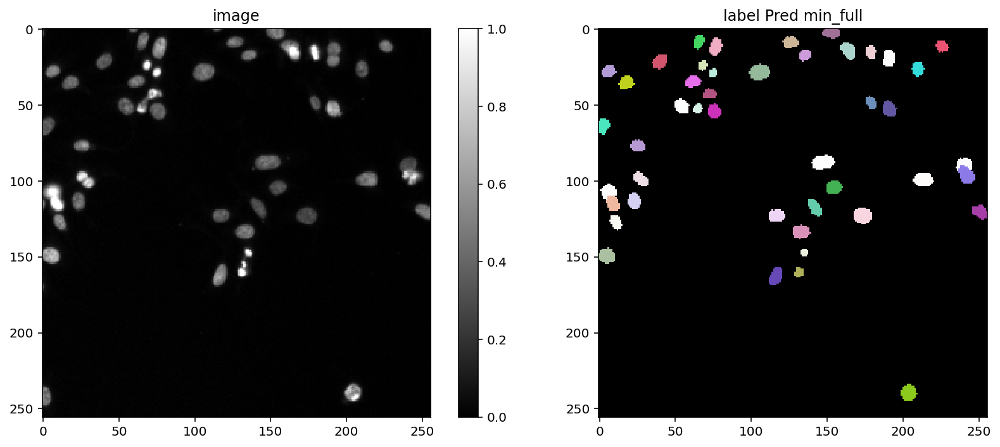

447it [00:04, 98.15it/s] 


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 11s 141ms/step - loss: 3.0462 - prob_loss: 0.7398 - dist_loss: 11.5322 - prob_kld: 0.6156 - dist_relevant_mae: 11.5320 - dist_relevant_mse: 254.6354 - dist_dist_iou_metric: 0.0958 - val_loss: 2.7441 - val_prob_loss: 0.6838 - val_dist_loss: 10.3014 - val_prob_kld: 0.6011 - val_dist_relevant_mae: 10.3011 - val_dist_relevant_mse: 212.0999 - val_dist_dist_iou_metric: 0.1387 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 5s 95ms/step - loss: 2.3679 - prob_loss: 0.7065 - dist_loss: 8.3066 - prob_kld: 0.5822 - dist_relevant_mae: 8.3061 - dist_relevant_mse: 150.4591 - dist_dist_iou_metric: 0.2670 - val_loss: 2.9988 - val_prob_loss: 0.5169 - val_dist_loss: 12.4096 - val_prob_kld: 0.4341 - val_dist_relevant_mae: 12.4095 - val_dist_relevant_mse: 274.0315 - val_dist_dist_iou_metric: 0.0274 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 5s 96ms/st

Epoch 20/100
56/56 [==============================] - 5s 94ms/step - loss: 1.3138 - prob_loss: 0.6119 - dist_loss: 3.5094 - prob_kld: 0.3928 - dist_relevant_mae: 3.5087 - dist_relevant_mse: 33.1871 - dist_dist_iou_metric: 0.6035 - val_loss: 1.5991 - val_prob_loss: 0.4467 - val_dist_loss: 5.7616 - val_prob_kld: 0.3640 - val_dist_relevant_mae: 5.7611 - val_dist_relevant_mse: 81.0790 - val_dist_dist_iou_metric: 0.4138 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 5s 86ms/step - loss: 1.3204 - prob_loss: 0.6113 - dist_loss: 3.5459 - prob_kld: 0.3522 - dist_relevant_mae: 3.5451 - dist_relevant_mse: 35.2678 - dist_dist_iou_metric: 0.5953 - val_loss: 1.1143 - val_prob_loss: 0.2794 - val_dist_loss: 4.1741 - val_prob_kld: 0.1967 - val_dist_relevant_mae: 4.1733 - val_dist_relevant_mse: 37.2795 - val_dist_dist_iou_metric: 0.6089 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 5s 95ms/step - loss: 1.2419 - prob_loss: 0.6031 - dist_loss: 3.1941 - prob

Epoch 39/100
56/56 [==============================] - 5s 94ms/step - loss: 1.1710 - prob_loss: 0.6030 - dist_loss: 2.8400 - prob_kld: 0.3864 - dist_relevant_mae: 2.8390 - dist_relevant_mse: 24.2371 - dist_dist_iou_metric: 0.6654 - val_loss: 1.2247 - val_prob_loss: 0.5272 - val_dist_loss: 3.4873 - val_prob_kld: 0.4445 - val_dist_relevant_mae: 3.4856 - val_dist_relevant_mse: 31.3523 - val_dist_dist_iou_metric: 0.6446 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 5s 92ms/step - loss: 1.1234 - prob_loss: 0.6006 - dist_loss: 2.6141 - prob_kld: 0.4605 - dist_relevant_mae: 2.6129 - dist_relevant_mse: 20.2432 - dist_dist_iou_metric: 0.6842 - val_loss: 0.9740 - val_prob_loss: 0.3477 - val_dist_loss: 3.1316 - val_prob_kld: 0.2650 - val_dist_relevant_mae: 3.1307 - val_dist_relevant_mse: 25.1682 - val_dist_dist_iou_metric: 0.6673 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 5s 91ms/step - loss: 1.1607 - prob_loss: 0.5981 - dist_loss: 2.8128 - prob

Epoch 58/100
56/56 [==============================] - 5s 92ms/step - loss: 1.0749 - prob_loss: 0.5939 - dist_loss: 2.4051 - prob_kld: 0.4786 - dist_relevant_mae: 2.4037 - dist_relevant_mse: 17.9521 - dist_dist_iou_metric: 0.7048 - val_loss: 0.9573 - val_prob_loss: 0.3907 - val_dist_loss: 2.8333 - val_prob_kld: 0.3079 - val_dist_relevant_mae: 2.8319 - val_dist_relevant_mse: 23.7689 - val_dist_dist_iou_metric: 0.6845 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 5s 92ms/step - loss: 1.0877 - prob_loss: 0.5986 - dist_loss: 2.4454 - prob_kld: 0.4230 - dist_relevant_mae: 2.4442 - dist_relevant_mse: 16.9770 - dist_dist_iou_metric: 0.6935 - val_loss: 0.9249 - val_prob_loss: 0.3851 - val_dist_loss: 2.6990 - val_prob_kld: 0.3024 - val_dist_relevant_mae: 2.6981 - val_dist_relevant_mse: 21.3552 - val_dist_dist_iou_metric: 0.7000 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 5s 92ms/step - loss: 1.1085 - prob_loss: 0.6003 - dist_loss: 2.5414 - prob

Epoch 77/100
56/56 [==============================] - 5s 92ms/step - loss: 1.0522 - prob_loss: 0.6005 - dist_loss: 2.2586 - prob_kld: 0.4953 - dist_relevant_mae: 2.2572 - dist_relevant_mse: 16.1717 - dist_dist_iou_metric: 0.7247 - val_loss: 0.8618 - val_prob_loss: 0.3583 - val_dist_loss: 2.5176 - val_prob_kld: 0.2755 - val_dist_relevant_mae: 2.5166 - val_dist_relevant_mse: 19.0470 - val_dist_dist_iou_metric: 0.7078 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 5s 91ms/step - loss: 1.0338 - prob_loss: 0.5949 - dist_loss: 2.1946 - prob_kld: 0.3926 - dist_relevant_mae: 2.1935 - dist_relevant_mse: 14.3187 - dist_dist_iou_metric: 0.7212 - val_loss: 0.8482 - val_prob_loss: 0.3395 - val_dist_loss: 2.5438 - val_prob_kld: 0.2567 - val_dist_relevant_mae: 2.5429 - val_dist_relevant_mse: 20.1404 - val_dist_dist_iou_metric: 0.7053 - lr: 3.0000e-04
Epoch 79/100
56/56 [==============================] - 5s 91ms/step - loss: 1.0432 - prob_loss: 0.5969 - dist_loss: 2.2310 - prob

Epoch 96/100
56/56 [==============================] - 5s 91ms/step - loss: 1.0086 - prob_loss: 0.5904 - dist_loss: 2.0908 - prob_kld: 0.3869 - dist_relevant_mae: 2.0898 - dist_relevant_mse: 13.4412 - dist_dist_iou_metric: 0.7353 - val_loss: 0.8998 - val_prob_loss: 0.3353 - val_dist_loss: 2.8227 - val_prob_kld: 0.2526 - val_dist_relevant_mae: 2.8220 - val_dist_relevant_mse: 22.9960 - val_dist_dist_iou_metric: 0.6690 - lr: 3.0000e-04
Epoch 97/100
56/56 [==============================] - 5s 90ms/step - loss: 1.0267 - prob_loss: 0.5924 - dist_loss: 2.1711 - prob_kld: 0.3992 - dist_relevant_mae: 2.1700 - dist_relevant_mse: 13.8352 - dist_dist_iou_metric: 0.7356 - val_loss: 0.8502 - val_prob_loss: 0.3499 - val_dist_loss: 2.5012 - val_prob_kld: 0.2672 - val_dist_relevant_mae: 2.5001 - val_dist_relevant_mse: 18.3882 - val_dist_dist_iou_metric: 0.7052 - lr: 3.0000e-04
Epoch 98/100
56/56 [==============================] - 5s 93ms/step - loss: 0.9924 - prob_loss: 0.5919 - dist_loss: 2.0026 - prob

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/max_001


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [00:09<00:00,  5.44it/s]


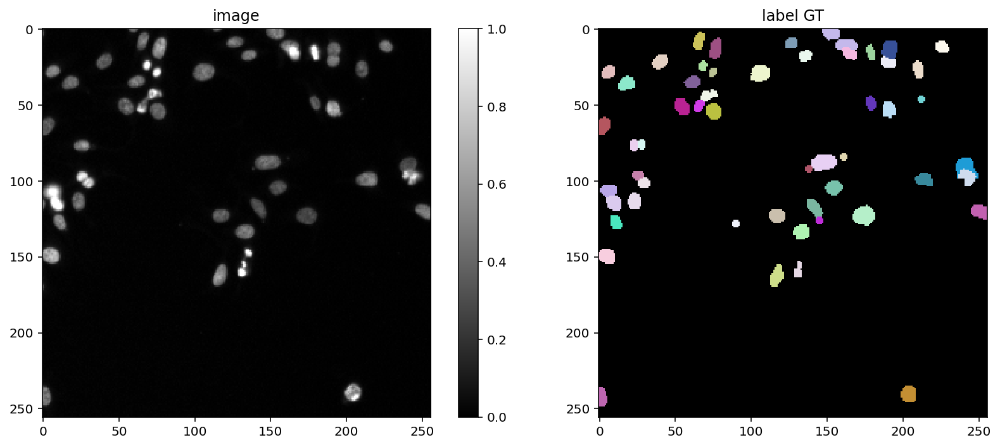

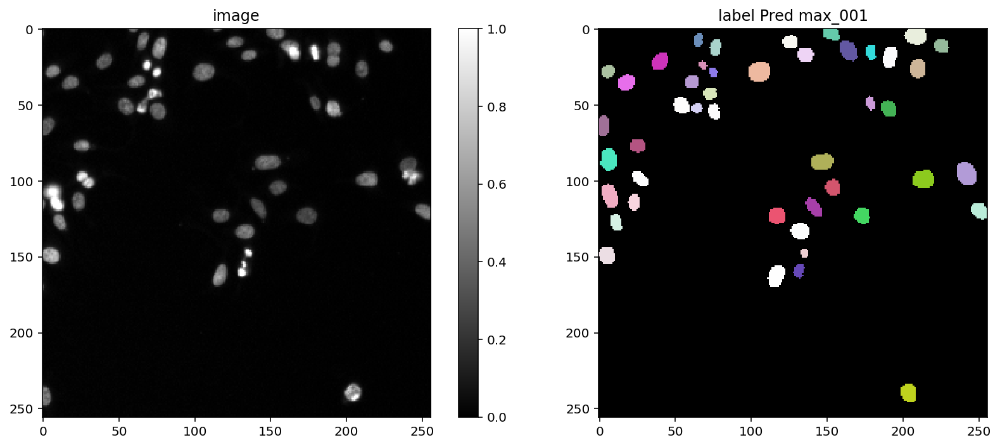

447it [00:04, 102.04it/s]


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 10s 154ms/step - loss: 2.9845 - prob_loss: 0.7218 - dist_loss: 11.3137 - prob_kld: 0.6121 - dist_relevant_mae: 11.3134 - dist_relevant_mse: 250.2159 - dist_dist_iou_metric: 0.1446 - val_loss: 2.3193 - val_prob_loss: 0.6570 - val_dist_loss: 8.3118 - val_prob_kld: 0.5723 - val_dist_relevant_mae: 8.3115 - val_dist_relevant_mse: 147.3853 - val_dist_dist_iou_metric: 0.2323 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 101ms/step - loss: 2.4700 - prob_loss: 0.6807 - dist_loss: 8.9464 - prob_kld: 0.5388 - dist_relevant_mae: 8.9459 - dist_relevant_mse: 167.6515 - dist_dist_iou_metric: 0.2661 - val_loss: 2.3226 - val_prob_loss: 0.6609 - val_dist_loss: 8.3083 - val_prob_kld: 0.5762 - val_dist_relevant_mae: 8.3080 - val_dist_relevant_mse: 149.6765 - val_dist_dist_iou_metric: 0.2068 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 5s 97ms/step 

Epoch 20/100
56/56 [==============================] - 6s 110ms/step - loss: 1.2492 - prob_loss: 0.6083 - dist_loss: 3.2044 - prob_kld: 0.4235 - dist_relevant_mae: 3.2035 - dist_relevant_mse: 27.5785 - dist_dist_iou_metric: 0.6367 - val_loss: 1.0381 - val_prob_loss: 0.3804 - val_dist_loss: 3.2885 - val_prob_kld: 0.2957 - val_dist_relevant_mae: 3.2878 - val_dist_relevant_mse: 26.2715 - val_dist_dist_iou_metric: 0.6428 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 6s 111ms/step - loss: 1.2040 - prob_loss: 0.6074 - dist_loss: 2.9826 - prob_kld: 0.3847 - dist_relevant_mae: 2.9819 - dist_relevant_mse: 24.5594 - dist_dist_iou_metric: 0.6511 - val_loss: 1.0773 - val_prob_loss: 0.4395 - val_dist_loss: 3.1892 - val_prob_kld: 0.3548 - val_dist_relevant_mae: 3.1886 - val_dist_relevant_mse: 26.4990 - val_dist_dist_iou_metric: 0.6412 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 6s 114ms/step - loss: 1.1879 - prob_loss: 0.6036 - dist_loss: 2.9213 - p

Epoch 39/100
56/56 [==============================] - 5s 98ms/step - loss: 1.1068 - prob_loss: 0.6005 - dist_loss: 2.5315 - prob_kld: 0.4729 - dist_relevant_mae: 2.5305 - dist_relevant_mse: 18.6770 - dist_dist_iou_metric: 0.6965 - val_loss: 0.9981 - val_prob_loss: 0.4817 - val_dist_loss: 2.5817 - val_prob_kld: 0.3970 - val_dist_relevant_mae: 2.5807 - val_dist_relevant_mse: 18.3812 - val_dist_dist_iou_metric: 0.7066 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 6s 101ms/step - loss: 1.0542 - prob_loss: 0.5911 - dist_loss: 2.3157 - prob_kld: 0.4525 - dist_relevant_mae: 2.3147 - dist_relevant_mse: 16.1463 - dist_dist_iou_metric: 0.7253 - val_loss: 0.8925 - val_prob_loss: 0.3923 - val_dist_loss: 2.5008 - val_prob_kld: 0.3076 - val_dist_relevant_mae: 2.5000 - val_dist_relevant_mse: 17.3749 - val_dist_dist_iou_metric: 0.7080 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 6s 102ms/step - loss: 1.0448 - prob_loss: 0.5916 - dist_loss: 2.2658 - pr

Epoch 58/100
56/56 [==============================] - 5s 98ms/step - loss: 1.0193 - prob_loss: 0.5911 - dist_loss: 2.1411 - prob_kld: 0.4656 - dist_relevant_mae: 2.1401 - dist_relevant_mse: 14.6471 - dist_dist_iou_metric: 0.7435 - val_loss: 0.8713 - val_prob_loss: 0.4102 - val_dist_loss: 2.3056 - val_prob_kld: 0.3255 - val_dist_relevant_mae: 2.3046 - val_dist_relevant_mse: 15.5144 - val_dist_dist_iou_metric: 0.7161 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 5s 96ms/step - loss: 1.0039 - prob_loss: 0.5909 - dist_loss: 2.0651 - prob_kld: 0.4710 - dist_relevant_mae: 2.0642 - dist_relevant_mse: 12.7131 - dist_dist_iou_metric: 0.7456 - val_loss: 0.9056 - val_prob_loss: 0.4532 - val_dist_loss: 2.2624 - val_prob_kld: 0.3685 - val_dist_relevant_mae: 2.2616 - val_dist_relevant_mse: 15.1439 - val_dist_dist_iou_metric: 0.7286 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 6s 100ms/step - loss: 0.9789 - prob_loss: 0.5923 - dist_loss: 1.9326 - pro

Epoch 77/100
56/56 [==============================] - 5s 96ms/step - loss: 0.9846 - prob_loss: 0.5869 - dist_loss: 1.9887 - prob_kld: 0.4236 - dist_relevant_mae: 1.9878 - dist_relevant_mse: 12.3459 - dist_dist_iou_metric: 0.7586 - val_loss: 0.9005 - val_prob_loss: 0.4778 - val_dist_loss: 2.1138 - val_prob_kld: 0.3931 - val_dist_relevant_mae: 2.1128 - val_dist_relevant_mse: 13.5033 - val_dist_dist_iou_metric: 0.7428 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 5s 99ms/step - loss: 0.9542 - prob_loss: 0.5866 - dist_loss: 1.8379 - prob_kld: 0.4450 - dist_relevant_mae: 1.8369 - dist_relevant_mse: 10.7535 - dist_dist_iou_metric: 0.7700 - val_loss: 0.8642 - val_prob_loss: 0.4334 - val_dist_loss: 2.1541 - val_prob_kld: 0.3487 - val_dist_relevant_mae: 2.1535 - val_dist_relevant_mse: 14.2992 - val_dist_dist_iou_metric: 0.7272 - lr: 3.0000e-04
Epoch 79/100
56/56 [==============================] - 6s 102ms/step - loss: 0.9747 - prob_loss: 0.5882 - dist_loss: 1.9324 - pro

Epoch 96/100
56/56 [==============================] - 5s 99ms/step - loss: 0.9488 - prob_loss: 0.5875 - dist_loss: 1.8069 - prob_kld: 0.3980 - dist_relevant_mae: 1.8062 - dist_relevant_mse: 9.7645 - dist_dist_iou_metric: 0.7738 - val_loss: 0.8691 - val_prob_loss: 0.4008 - val_dist_loss: 2.3414 - val_prob_kld: 0.3161 - val_dist_relevant_mae: 2.3406 - val_dist_relevant_mse: 14.4839 - val_dist_dist_iou_metric: 0.7404 - lr: 3.0000e-04
Epoch 97/100
56/56 [==============================] - 5s 99ms/step - loss: 0.9438 - prob_loss: 0.5843 - dist_loss: 1.7977 - prob_kld: 0.4229 - dist_relevant_mae: 1.7969 - dist_relevant_mse: 10.2382 - dist_dist_iou_metric: 0.7786 - val_loss: 0.7986 - val_prob_loss: 0.3951 - val_dist_loss: 2.0172 - val_prob_kld: 0.3104 - val_dist_relevant_mae: 2.0164 - val_dist_relevant_mse: 11.7604 - val_dist_dist_iou_metric: 0.7595 - lr: 3.0000e-04
Epoch 98/100
56/56 [==============================] - 5s 97ms/step - loss: 0.9260 - prob_loss: 0.5849 - dist_loss: 1.7057 - prob_

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/max_004


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [00:10<00:00,  4.87it/s]


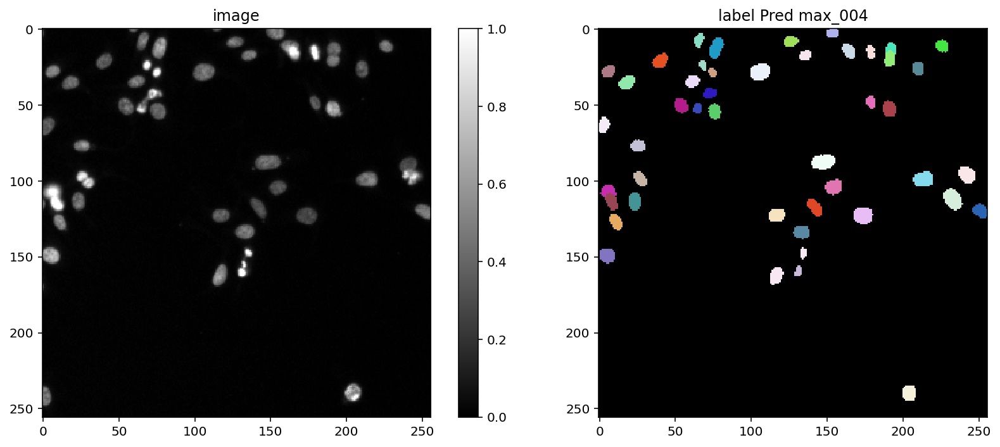

447it [00:04, 98.15it/s] 


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 11s 147ms/step - loss: 2.8728 - prob_loss: 0.7077 - dist_loss: 10.8256 - prob_kld: 0.5918 - dist_relevant_mae: 10.8253 - dist_relevant_mse: 222.9049 - dist_dist_iou_metric: 0.1463 - val_loss: 2.2816 - val_prob_loss: 0.6307 - val_dist_loss: 8.2545 - val_prob_kld: 0.5455 - val_dist_relevant_mae: 8.2541 - val_dist_relevant_mse: 146.9187 - val_dist_dist_iou_metric: 0.2339 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 107ms/step - loss: 2.2130 - prob_loss: 0.6988 - dist_loss: 7.5710 - prob_kld: 0.5621 - dist_relevant_mae: 7.5703 - dist_relevant_mse: 120.0557 - dist_dist_iou_metric: 0.3160 - val_loss: 2.7492 - val_prob_loss: 0.6901 - val_dist_loss: 10.2951 - val_prob_kld: 0.6050 - val_dist_relevant_mae: 10.2948 - val_dist_relevant_mse: 205.6425 - val_dist_dist_iou_metric: 0.0771 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 6s 104ms/st

Epoch 20/100
56/56 [==============================] - 5s 96ms/step - loss: 1.2311 - prob_loss: 0.6044 - dist_loss: 3.1333 - prob_kld: 0.4043 - dist_relevant_mae: 3.1325 - dist_relevant_mse: 25.9694 - dist_dist_iou_metric: 0.6403 - val_loss: 1.0843 - val_prob_loss: 0.4219 - val_dist_loss: 3.3119 - val_prob_kld: 0.3367 - val_dist_relevant_mae: 3.3114 - val_dist_relevant_mse: 31.3784 - val_dist_dist_iou_metric: 0.6018 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 5s 97ms/step - loss: 1.1126 - prob_loss: 0.5942 - dist_loss: 2.5919 - prob_kld: 0.3723 - dist_relevant_mae: 2.5912 - dist_relevant_mse: 19.6382 - dist_dist_iou_metric: 0.6857 - val_loss: 0.9244 - val_prob_loss: 0.3675 - val_dist_loss: 2.7849 - val_prob_kld: 0.2823 - val_dist_relevant_mae: 2.7843 - val_dist_relevant_mse: 22.3950 - val_dist_dist_iou_metric: 0.6742 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 5s 96ms/step - loss: 1.1627 - prob_loss: 0.5955 - dist_loss: 2.8364 - prob

Epoch 39/100
56/56 [==============================] - 5s 98ms/step - loss: 1.0378 - prob_loss: 0.5928 - dist_loss: 2.2252 - prob_kld: 0.3765 - dist_relevant_mae: 2.2243 - dist_relevant_mse: 14.5710 - dist_dist_iou_metric: 0.7269 - val_loss: 0.8708 - val_prob_loss: 0.3967 - val_dist_loss: 2.3702 - val_prob_kld: 0.3116 - val_dist_relevant_mae: 2.3695 - val_dist_relevant_mse: 16.4348 - val_dist_dist_iou_metric: 0.7249 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 5s 98ms/step - loss: 1.0526 - prob_loss: 0.5957 - dist_loss: 2.2842 - prob_kld: 0.3785 - dist_relevant_mae: 2.2834 - dist_relevant_mse: 14.8032 - dist_dist_iou_metric: 0.7164 - val_loss: 0.8931 - val_prob_loss: 0.3544 - val_dist_loss: 2.6932 - val_prob_kld: 0.2692 - val_dist_relevant_mae: 2.6925 - val_dist_relevant_mse: 20.7924 - val_dist_dist_iou_metric: 0.7069 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 5s 99ms/step - loss: 1.0661 - prob_loss: 0.5966 - dist_loss: 2.3473 - prob

Epoch 58/100
56/56 [==============================] - 5s 95ms/step - loss: 0.9742 - prob_loss: 0.5849 - dist_loss: 1.9467 - prob_kld: 0.3698 - dist_relevant_mae: 1.9459 - dist_relevant_mse: 12.2364 - dist_dist_iou_metric: 0.7609 - val_loss: 0.9475 - val_prob_loss: 0.4294 - val_dist_loss: 2.5903 - val_prob_kld: 0.3443 - val_dist_relevant_mae: 2.5894 - val_dist_relevant_mse: 16.4335 - val_dist_dist_iou_metric: 0.7236 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 5s 99ms/step - loss: 1.0022 - prob_loss: 0.5939 - dist_loss: 2.0415 - prob_kld: 0.3791 - dist_relevant_mae: 2.0407 - dist_relevant_mse: 11.3793 - dist_dist_iou_metric: 0.7427 - val_loss: 0.7479 - val_prob_loss: 0.3417 - val_dist_loss: 2.0309 - val_prob_kld: 0.2565 - val_dist_relevant_mae: 2.0302 - val_dist_relevant_mse: 13.1019 - val_dist_dist_iou_metric: 0.7473 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 5s 98ms/step - loss: 0.9714 - prob_loss: 0.5865 - dist_loss: 1.9245 - prob

Epoch 77/100
56/56 [==============================] - 5s 96ms/step - loss: 0.9385 - prob_loss: 0.5894 - dist_loss: 1.7453 - prob_kld: 0.3721 - dist_relevant_mae: 1.7445 - dist_relevant_mse: 9.5029 - dist_dist_iou_metric: 0.7710 - val_loss: 0.7859 - val_prob_loss: 0.3811 - val_dist_loss: 2.0239 - val_prob_kld: 0.2959 - val_dist_relevant_mae: 2.0232 - val_dist_relevant_mse: 12.9964 - val_dist_dist_iou_metric: 0.7527 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 5s 96ms/step - loss: 0.9617 - prob_loss: 0.5896 - dist_loss: 1.8601 - prob_kld: 0.3862 - dist_relevant_mae: 1.8594 - dist_relevant_mse: 10.3045 - dist_dist_iou_metric: 0.7616 - val_loss: 0.8099 - val_prob_loss: 0.4319 - val_dist_loss: 1.8897 - val_prob_kld: 0.3467 - val_dist_relevant_mae: 1.8891 - val_dist_relevant_mse: 10.9914 - val_dist_dist_iou_metric: 0.7609 - lr: 3.0000e-04
Epoch 79/100
56/56 [==============================] - 5s 95ms/step - loss: 0.9479 - prob_loss: 0.5917 - dist_loss: 1.7810 - prob_

Epoch 96/100
56/56 [==============================] - 5s 96ms/step - loss: 0.9362 - prob_loss: 0.5887 - dist_loss: 1.7372 - prob_kld: 0.3876 - dist_relevant_mae: 1.7366 - dist_relevant_mse: 9.4637 - dist_dist_iou_metric: 0.7764 - val_loss: 0.8350 - val_prob_loss: 0.4743 - val_dist_loss: 1.8037 - val_prob_kld: 0.3891 - val_dist_relevant_mae: 1.8033 - val_dist_relevant_mse: 10.5230 - val_dist_dist_iou_metric: 0.7670 - lr: 3.0000e-04
Epoch 97/100
56/56 [==============================] - 5s 96ms/step - loss: 0.9252 - prob_loss: 0.5856 - dist_loss: 1.6979 - prob_kld: 0.4170 - dist_relevant_mae: 1.6973 - dist_relevant_mse: 8.2280 - dist_dist_iou_metric: 0.7814 - val_loss: 0.7701 - val_prob_loss: 0.4214 - val_dist_loss: 1.7435 - val_prob_kld: 0.3363 - val_dist_relevant_mae: 1.7430 - val_dist_relevant_mse: 10.1528 - val_dist_dist_iou_metric: 0.7742 - lr: 3.0000e-04
Epoch 98/100
56/56 [==============================] - 5s 96ms/step - loss: 0.9312 - prob_loss: 0.5867 - dist_loss: 1.7224 - prob_k

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/max_016


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [00:09<00:00,  5.31it/s]


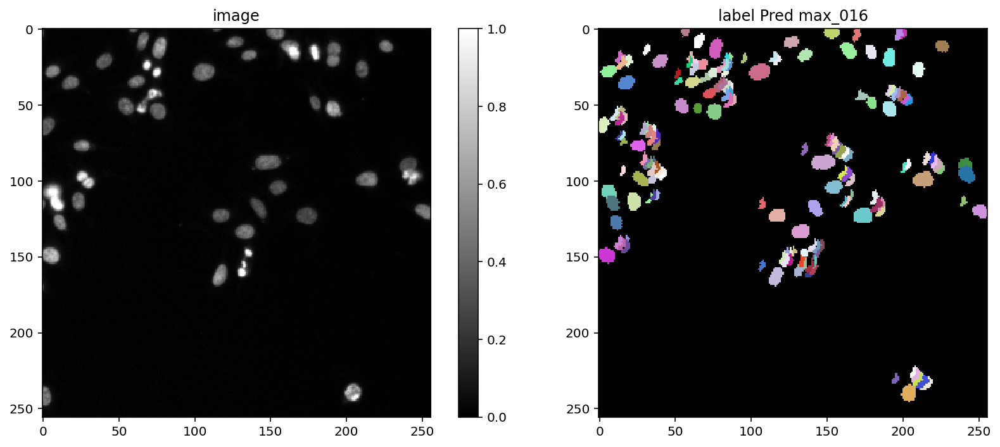

447it [00:04, 95.55it/s] 


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 10s 151ms/step - loss: 3.0650 - prob_loss: 0.7149 - dist_loss: 11.7507 - prob_kld: 0.5969 - dist_relevant_mae: 11.7505 - dist_relevant_mse: 250.0339 - dist_dist_iou_metric: 0.0849 - val_loss: 2.5910 - val_prob_loss: 0.6849 - val_dist_loss: 9.5308 - val_prob_kld: 0.6013 - val_dist_relevant_mae: 9.5304 - val_dist_relevant_mse: 187.3618 - val_dist_dist_iou_metric: 0.1838 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 108ms/step - loss: 2.2771 - prob_loss: 0.6880 - dist_loss: 7.9454 - prob_kld: 0.5854 - dist_relevant_mae: 7.9448 - dist_relevant_mse: 129.7330 - dist_dist_iou_metric: 0.2888 - val_loss: 2.2843 - val_prob_loss: 0.6500 - val_dist_loss: 8.1714 - val_prob_kld: 0.5665 - val_dist_relevant_mae: 8.1709 - val_dist_relevant_mse: 147.7656 - val_dist_dist_iou_metric: 0.2377 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 6s 103ms/step

Epoch 20/100
56/56 [==============================] - 6s 110ms/step - loss: 1.1888 - prob_loss: 0.6007 - dist_loss: 2.9401 - prob_kld: 0.3931 - dist_relevant_mae: 2.9394 - dist_relevant_mse: 23.6895 - dist_dist_iou_metric: 0.6448 - val_loss: 1.0388 - val_prob_loss: 0.4140 - val_dist_loss: 3.1237 - val_prob_kld: 0.3305 - val_dist_relevant_mae: 3.1230 - val_dist_relevant_mse: 24.6590 - val_dist_dist_iou_metric: 0.6539 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 6s 108ms/step - loss: 1.1825 - prob_loss: 0.5997 - dist_loss: 2.9144 - prob_kld: 0.4122 - dist_relevant_mae: 2.9136 - dist_relevant_mse: 23.3202 - dist_dist_iou_metric: 0.6536 - val_loss: 1.0238 - val_prob_loss: 0.4066 - val_dist_loss: 3.0861 - val_prob_kld: 0.3231 - val_dist_relevant_mae: 3.0855 - val_dist_relevant_mse: 25.1510 - val_dist_dist_iou_metric: 0.6523 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 6s 102ms/step - loss: 1.1714 - prob_loss: 0.5988 - dist_loss: 2.8628 - p

Epoch 39/100
56/56 [==============================] - 6s 103ms/step - loss: 1.0277 - prob_loss: 0.5911 - dist_loss: 2.1830 - prob_kld: 0.3428 - dist_relevant_mae: 2.1825 - dist_relevant_mse: 14.0654 - dist_dist_iou_metric: 0.7246 - val_loss: 0.8242 - val_prob_loss: 0.3783 - val_dist_loss: 2.2293 - val_prob_kld: 0.2947 - val_dist_relevant_mae: 2.2288 - val_dist_relevant_mse: 14.4231 - val_dist_dist_iou_metric: 0.7321 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 6s 100ms/step - loss: 1.0362 - prob_loss: 0.5962 - dist_loss: 2.2003 - prob_kld: 0.3402 - dist_relevant_mae: 2.1997 - dist_relevant_mse: 14.0169 - dist_dist_iou_metric: 0.7212 - val_loss: 0.8337 - val_prob_loss: 0.3675 - val_dist_loss: 2.3310 - val_prob_kld: 0.2839 - val_dist_relevant_mae: 2.3304 - val_dist_relevant_mse: 16.1923 - val_dist_dist_iou_metric: 0.7168 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 6s 101ms/step - loss: 1.0350 - prob_loss: 0.6015 - dist_loss: 2.1673 - p

Epoch 58/100
56/56 [==============================] - 6s 102ms/step - loss: 0.9934 - prob_loss: 0.5899 - dist_loss: 2.0176 - prob_kld: 0.3896 - dist_relevant_mae: 2.0170 - dist_relevant_mse: 11.6462 - dist_dist_iou_metric: 0.7404 - val_loss: 0.8304 - val_prob_loss: 0.4234 - val_dist_loss: 2.0347 - val_prob_kld: 0.3399 - val_dist_relevant_mae: 2.0343 - val_dist_relevant_mse: 12.3190 - val_dist_dist_iou_metric: 0.7404 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 5s 98ms/step - loss: 0.9673 - prob_loss: 0.5860 - dist_loss: 1.9064 - prob_kld: 0.3866 - dist_relevant_mae: 1.9058 - dist_relevant_mse: 10.5956 - dist_dist_iou_metric: 0.7556 - val_loss: 0.8154 - val_prob_loss: 0.4197 - val_dist_loss: 1.9788 - val_prob_kld: 0.3361 - val_dist_relevant_mae: 1.9784 - val_dist_relevant_mse: 11.5604 - val_dist_dist_iou_metric: 0.7581 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 6s 99ms/step - loss: 0.9781 - prob_loss: 0.5931 - dist_loss: 1.9254 - pro

Epoch 77/100
56/56 [==============================] - 5s 96ms/step - loss: 0.9613 - prob_loss: 0.5836 - dist_loss: 1.8883 - prob_kld: 0.4536 - dist_relevant_mae: 1.8878 - dist_relevant_mse: 10.1611 - dist_dist_iou_metric: 0.7624 - val_loss: 0.9026 - val_prob_loss: 0.4642 - val_dist_loss: 2.1919 - val_prob_kld: 0.3806 - val_dist_relevant_mae: 2.1913 - val_dist_relevant_mse: 12.4685 - val_dist_dist_iou_metric: 0.7558 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 5s 97ms/step - loss: 0.9615 - prob_loss: 0.5859 - dist_loss: 1.8778 - prob_kld: 0.4491 - dist_relevant_mae: 1.8773 - dist_relevant_mse: 10.1431 - dist_dist_iou_metric: 0.7611 - val_loss: 0.8516 - val_prob_loss: 0.4812 - val_dist_loss: 1.8517 - val_prob_kld: 0.3977 - val_dist_relevant_mae: 1.8513 - val_dist_relevant_mse: 10.7240 - val_dist_dist_iou_metric: 0.7694 - lr: 3.0000e-04
Epoch 79/100
56/56 [==============================] - 5s 99ms/step - loss: 0.9516 - prob_loss: 0.5864 - dist_loss: 1.8258 - prob

Epoch 96/100
56/56 [==============================] - 6s 100ms/step - loss: 0.9692 - prob_loss: 0.5873 - dist_loss: 1.9095 - prob_kld: 0.4495 - dist_relevant_mae: 1.9090 - dist_relevant_mse: 10.4400 - dist_dist_iou_metric: 0.7544 - val_loss: 0.8419 - val_prob_loss: 0.4780 - val_dist_loss: 1.8193 - val_prob_kld: 0.3945 - val_dist_relevant_mae: 1.8188 - val_dist_relevant_mse: 9.1769 - val_dist_dist_iou_metric: 0.7788 - lr: 3.0000e-04
Epoch 97/100
56/56 [==============================] - 5s 99ms/step - loss: 0.9190 - prob_loss: 0.5846 - dist_loss: 1.6717 - prob_kld: 0.4729 - dist_relevant_mae: 1.6712 - dist_relevant_mse: 8.4064 - dist_dist_iou_metric: 0.7778 - val_loss: 0.8347 - val_prob_loss: 0.5044 - val_dist_loss: 1.6515 - val_prob_kld: 0.4208 - val_dist_relevant_mae: 1.6511 - val_dist_relevant_mse: 8.0852 - val_dist_dist_iou_metric: 0.7919 - lr: 3.0000e-04
Epoch 98/100
56/56 [==============================] - 6s 100ms/step - loss: 0.9316 - prob_loss: 0.5854 - dist_loss: 1.7312 - prob_

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/max_064


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [00:19<00:00,  2.55it/s]


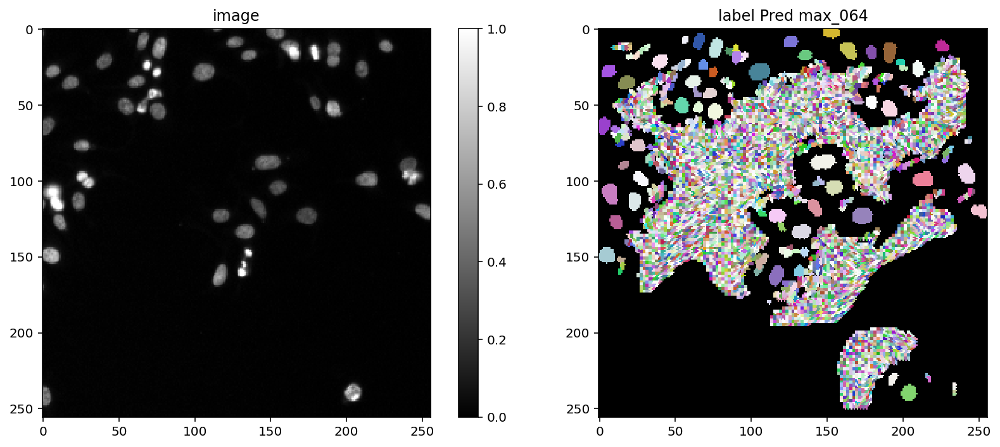

447it [00:04, 95.50it/s] 


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 10s 163ms/step - loss: 2.7889 - prob_loss: 0.7175 - dist_loss: 10.3573 - prob_kld: 0.5769 - dist_relevant_mae: 10.3570 - dist_relevant_mse: 202.5565 - dist_dist_iou_metric: 0.1277 - val_loss: 2.6373 - val_prob_loss: 0.6089 - val_dist_loss: 10.1421 - val_prob_kld: 0.5277 - val_dist_relevant_mae: 10.1419 - val_dist_relevant_mse: 201.1246 - val_dist_dist_iou_metric: 0.0906 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 106ms/step - loss: 2.2221 - prob_loss: 0.6973 - dist_loss: 7.6240 - prob_kld: 0.5546 - dist_relevant_mae: 7.6235 - dist_relevant_mse: 119.4525 - dist_dist_iou_metric: 0.2961 - val_loss: 2.1569 - val_prob_loss: 0.6044 - val_dist_loss: 7.7625 - val_prob_kld: 0.5232 - val_dist_relevant_mae: 7.7622 - val_dist_relevant_mse: 132.7061 - val_dist_dist_iou_metric: 0.2133 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 6s 103ms/st

Epoch 20/100
56/56 [==============================] - 6s 111ms/step - loss: 1.1647 - prob_loss: 0.6062 - dist_loss: 2.7926 - prob_kld: 0.4377 - dist_relevant_mae: 2.7916 - dist_relevant_mse: 21.6513 - dist_dist_iou_metric: 0.6618 - val_loss: 1.0908 - val_prob_loss: 0.4416 - val_dist_loss: 3.2459 - val_prob_kld: 0.3604 - val_dist_relevant_mae: 3.2452 - val_dist_relevant_mse: 29.0657 - val_dist_dist_iou_metric: 0.6029 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 6s 110ms/step - loss: 1.1818 - prob_loss: 0.6048 - dist_loss: 2.8847 - prob_kld: 0.4460 - dist_relevant_mae: 2.8838 - dist_relevant_mse: 22.9793 - dist_dist_iou_metric: 0.6582 - val_loss: 1.1875 - val_prob_loss: 0.5921 - val_dist_loss: 2.9769 - val_prob_kld: 0.5109 - val_dist_relevant_mae: 2.9756 - val_dist_relevant_mse: 24.7168 - val_dist_dist_iou_metric: 0.6605 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 6s 112ms/step - loss: 1.1730 - prob_loss: 0.5993 - dist_loss: 2.8680 - p

Epoch 39/100
56/56 [==============================] - 6s 110ms/step - loss: 1.0279 - prob_loss: 0.5930 - dist_loss: 2.1742 - prob_kld: 0.4329 - dist_relevant_mae: 2.1734 - dist_relevant_mse: 13.4752 - dist_dist_iou_metric: 0.7255 - val_loss: 1.0182 - val_prob_loss: 0.5143 - val_dist_loss: 2.5192 - val_prob_kld: 0.4332 - val_dist_relevant_mae: 2.5181 - val_dist_relevant_mse: 20.2132 - val_dist_dist_iou_metric: 0.7031 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 6s 110ms/step - loss: 1.0456 - prob_loss: 0.6024 - dist_loss: 2.2164 - prob_kld: 0.4231 - dist_relevant_mae: 2.2156 - dist_relevant_mse: 14.1133 - dist_dist_iou_metric: 0.7216 - val_loss: 0.9201 - val_prob_loss: 0.4633 - val_dist_loss: 2.2837 - val_prob_kld: 0.3822 - val_dist_relevant_mae: 2.2831 - val_dist_relevant_mse: 16.3888 - val_dist_dist_iou_metric: 0.7092 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 6s 106ms/step - loss: 1.0581 - prob_loss: 0.5971 - dist_loss: 2.3052 - p

Epoch 58/100
56/56 [==============================] - 6s 111ms/step - loss: 0.9454 - prob_loss: 0.5897 - dist_loss: 1.7786 - prob_kld: 0.4323 - dist_relevant_mae: 1.7780 - dist_relevant_mse: 9.5795 - dist_dist_iou_metric: 0.7627 - val_loss: 0.8294 - val_prob_loss: 0.4412 - val_dist_loss: 1.9408 - val_prob_kld: 0.3600 - val_dist_relevant_mae: 1.9403 - val_dist_relevant_mse: 12.0656 - val_dist_dist_iou_metric: 0.7481 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 6s 116ms/step - loss: 0.9848 - prob_loss: 0.5898 - dist_loss: 1.9747 - prob_kld: 0.4401 - dist_relevant_mae: 1.9740 - dist_relevant_mse: 11.7122 - dist_dist_iou_metric: 0.7541 - val_loss: 0.8977 - val_prob_loss: 0.4857 - val_dist_loss: 2.0602 - val_prob_kld: 0.4045 - val_dist_relevant_mae: 2.0595 - val_dist_relevant_mse: 13.6000 - val_dist_dist_iou_metric: 0.7393 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 6s 104ms/step - loss: 0.9678 - prob_loss: 0.5900 - dist_loss: 1.8890 - pr

Epoch 77/100
56/56 [==============================] - 6s 114ms/step - loss: 0.9333 - prob_loss: 0.5891 - dist_loss: 1.7210 - prob_kld: 0.5008 - dist_relevant_mae: 1.7204 - dist_relevant_mse: 8.4311 - dist_dist_iou_metric: 0.7724 - val_loss: 0.8237 - val_prob_loss: 0.4510 - val_dist_loss: 1.8634 - val_prob_kld: 0.3698 - val_dist_relevant_mae: 1.8629 - val_dist_relevant_mse: 12.0110 - val_dist_dist_iou_metric: 0.7621 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 6s 114ms/step - loss: 0.9679 - prob_loss: 0.5951 - dist_loss: 1.8641 - prob_kld: 0.4689 - dist_relevant_mae: 1.8635 - dist_relevant_mse: 11.8678 - dist_dist_iou_metric: 0.7664 - val_loss: 0.8193 - val_prob_loss: 0.4504 - val_dist_loss: 1.8441 - val_prob_kld: 0.3693 - val_dist_relevant_mae: 1.8435 - val_dist_relevant_mse: 11.5717 - val_dist_dist_iou_metric: 0.7657 - lr: 3.0000e-04
Epoch 79/100
56/56 [==============================] - 6s 113ms/step - loss: 0.9645 - prob_loss: 0.5901 - dist_loss: 1.8722 - pr

Epoch 96/100
56/56 [==============================] - 6s 102ms/step - loss: 0.9199 - prob_loss: 0.5927 - dist_loss: 1.6356 - prob_kld: 0.4816 - dist_relevant_mae: 1.6351 - dist_relevant_mse: 8.3712 - dist_dist_iou_metric: 0.7876 - val_loss: 0.8148 - val_prob_loss: 0.4630 - val_dist_loss: 1.7589 - val_prob_kld: 0.3818 - val_dist_relevant_mae: 1.7584 - val_dist_relevant_mse: 11.0539 - val_dist_dist_iou_metric: 0.7735 - lr: 3.0000e-04
Epoch 97/100
56/56 [==============================] - 6s 101ms/step - loss: 0.9154 - prob_loss: 0.5845 - dist_loss: 1.6544 - prob_kld: 0.4951 - dist_relevant_mae: 1.6538 - dist_relevant_mse: 8.5405 - dist_dist_iou_metric: 0.7859 - val_loss: 0.8966 - val_prob_loss: 0.5225 - val_dist_loss: 1.8704 - val_prob_kld: 0.4414 - val_dist_relevant_mae: 1.8698 - val_dist_relevant_mse: 11.6993 - val_dist_dist_iou_metric: 0.7704 - lr: 3.0000e-04
Epoch 98/100
56/56 [==============================] - 6s 100ms/step - loss: 0.9115 - prob_loss: 0.5856 - dist_loss: 1.6292 - pro

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/max_256


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [00:10<00:00,  4.92it/s]


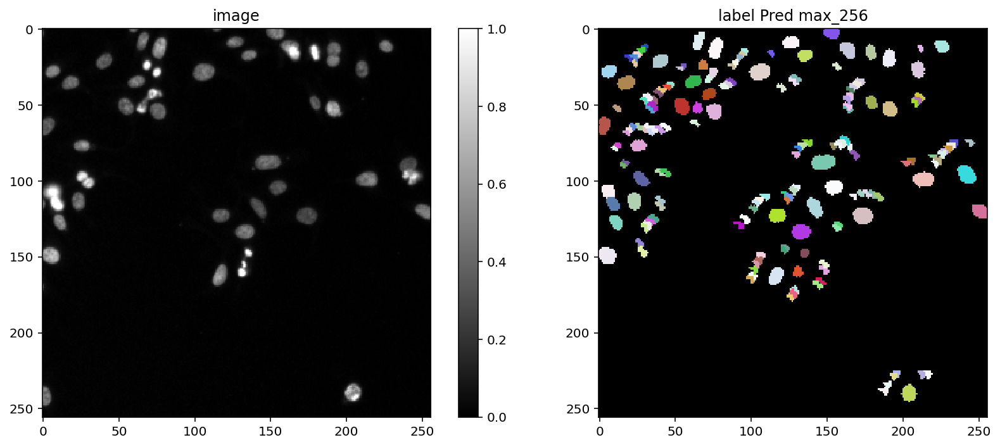

Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 10s 153ms/step - loss: 2.4551 - prob_loss: 0.3961 - dist_loss: 10.2949 - prob_kld: 0.3201 - dist_relevant_mae: 10.2945 - dist_relevant_mse: 198.2377 - dist_dist_iou_metric: 0.1399 - val_loss: 2.1738 - val_prob_loss: 0.4385 - val_dist_loss: 8.6766 - val_prob_kld: 0.3553 - val_dist_relevant_mae: 8.6761 - val_dist_relevant_mse: 160.5379 - val_dist_dist_iou_metric: 0.2167 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 107ms/step - loss: 1.8676 - prob_loss: 0.3117 - dist_loss: 7.7797 - prob_kld: 0.2365 - dist_relevant_mae: 7.7789 - dist_relevant_mse: 126.3509 - dist_dist_iou_metric: 0.2936 - val_loss: 1.8356 - val_prob_loss: 0.3491 - val_dist_loss: 7.4323 - val_prob_kld: 0.2660 - val_dist_relevant_mae: 7.4316 - val_dist_relevant_mse: 119.6280 - val_dist_dist_iou_metric: 0.3112 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 6s 103ms/step

Epoch 20/100
56/56 [==============================] - 6s 100ms/step - loss: 0.6286 - prob_loss: 0.0974 - dist_loss: 2.6558 - prob_kld: 0.0205 - dist_relevant_mae: 2.6553 - dist_relevant_mse: 20.3046 - dist_dist_iou_metric: 0.6724 - val_loss: 0.6991 - val_prob_loss: 0.1033 - val_dist_loss: 2.9789 - val_prob_kld: 0.0202 - val_dist_relevant_mae: 2.9784 - val_dist_relevant_mse: 24.3565 - val_dist_dist_iou_metric: 0.6353 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 6s 100ms/step - loss: 0.6231 - prob_loss: 0.0969 - dist_loss: 2.6310 - prob_kld: 0.0199 - dist_relevant_mae: 2.6304 - dist_relevant_mse: 19.6603 - dist_dist_iou_metric: 0.6772 - val_loss: 0.6588 - val_prob_loss: 0.1018 - val_dist_loss: 2.7850 - val_prob_kld: 0.0187 - val_dist_relevant_mae: 2.7845 - val_dist_relevant_mse: 21.0636 - val_dist_dist_iou_metric: 0.6779 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 6s 103ms/step - loss: 0.6554 - prob_loss: 0.0932 - dist_loss: 2.8110 - p

Epoch 39/100
56/56 [==============================] - 6s 107ms/step - loss: 0.5114 - prob_loss: 0.0921 - dist_loss: 2.0964 - prob_kld: 0.0169 - dist_relevant_mae: 2.0960 - dist_relevant_mse: 12.9803 - dist_dist_iou_metric: 0.7265 - val_loss: 0.5421 - val_prob_loss: 0.1004 - val_dist_loss: 2.2086 - val_prob_kld: 0.0173 - val_dist_relevant_mae: 2.2081 - val_dist_relevant_mse: 13.9447 - val_dist_dist_iou_metric: 0.7267 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 6s 102ms/step - loss: 0.5133 - prob_loss: 0.0922 - dist_loss: 2.1057 - prob_kld: 0.0161 - dist_relevant_mae: 2.1053 - dist_relevant_mse: 13.6839 - dist_dist_iou_metric: 0.7295 - val_loss: 0.5513 - val_prob_loss: 0.1002 - val_dist_loss: 2.2556 - val_prob_kld: 0.0170 - val_dist_relevant_mae: 2.2551 - val_dist_relevant_mse: 14.4330 - val_dist_dist_iou_metric: 0.7259 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 6s 103ms/step - loss: 0.5149 - prob_loss: 0.0910 - dist_loss: 2.1196 - p

Epoch 58/100
56/56 [==============================] - 6s 104ms/step - loss: 0.4696 - prob_loss: 0.0951 - dist_loss: 1.8725 - prob_kld: 0.0168 - dist_relevant_mae: 1.8721 - dist_relevant_mse: 10.0555 - dist_dist_iou_metric: 0.7517 - val_loss: 0.4792 - val_prob_loss: 0.1015 - val_dist_loss: 1.8884 - val_prob_kld: 0.0184 - val_dist_relevant_mae: 1.8880 - val_dist_relevant_mse: 10.6698 - val_dist_dist_iou_metric: 0.7569 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 6s 108ms/step - loss: 0.4549 - prob_loss: 0.0910 - dist_loss: 1.8195 - prob_kld: 0.0164 - dist_relevant_mae: 1.8191 - dist_relevant_mse: 10.2193 - dist_dist_iou_metric: 0.7558 - val_loss: 0.4654 - val_prob_loss: 0.0985 - val_dist_loss: 1.8342 - val_prob_kld: 0.0154 - val_dist_relevant_mae: 1.8338 - val_dist_relevant_mse: 10.0206 - val_dist_dist_iou_metric: 0.7679 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 6s 104ms/step - loss: 0.4554 - prob_loss: 0.0912 - dist_loss: 1.8212 - p

Epoch 77/100
56/56 [==============================] - 6s 106ms/step - loss: 0.4396 - prob_loss: 0.0888 - dist_loss: 1.7537 - prob_kld: 0.0151 - dist_relevant_mae: 1.7533 - dist_relevant_mse: 9.2445 - dist_dist_iou_metric: 0.7629 - val_loss: 0.4550 - val_prob_loss: 0.0992 - val_dist_loss: 1.7787 - val_prob_kld: 0.0161 - val_dist_relevant_mae: 1.7783 - val_dist_relevant_mse: 9.3611 - val_dist_dist_iou_metric: 0.7723 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 6s 104ms/step - loss: 0.4387 - prob_loss: 0.0930 - dist_loss: 1.7281 - prob_kld: 0.0150 - dist_relevant_mae: 1.7277 - dist_relevant_mse: 8.8892 - dist_dist_iou_metric: 0.7674 - val_loss: 0.4591 - val_prob_loss: 0.0977 - val_dist_loss: 1.8068 - val_prob_kld: 0.0146 - val_dist_relevant_mae: 1.8064 - val_dist_relevant_mse: 10.7047 - val_dist_dist_iou_metric: 0.7670 - lr: 3.0000e-04
Epoch 79/100
56/56 [==============================] - 6s 102ms/step - loss: 0.4270 - prob_loss: 0.0920 - dist_loss: 1.6752 - prob

Epoch 96/100
56/56 [==============================] - 6s 106ms/step - loss: 0.4134 - prob_loss: 0.0878 - dist_loss: 1.6282 - prob_kld: 0.0147 - dist_relevant_mae: 1.6278 - dist_relevant_mse: 8.0996 - dist_dist_iou_metric: 0.7816 - val_loss: 0.4474 - val_prob_loss: 0.1011 - val_dist_loss: 1.7314 - val_prob_kld: 0.0180 - val_dist_relevant_mae: 1.7310 - val_dist_relevant_mse: 9.3986 - val_dist_dist_iou_metric: 0.7746 - lr: 3.0000e-04
Epoch 97/100
56/56 [==============================] - 6s 105ms/step - loss: 0.4251 - prob_loss: 0.0950 - dist_loss: 1.6504 - prob_kld: 0.0153 - dist_relevant_mae: 1.6500 - dist_relevant_mse: 8.3470 - dist_dist_iou_metric: 0.7830 - val_loss: 0.4449 - val_prob_loss: 0.0981 - val_dist_loss: 1.7340 - val_prob_kld: 0.0149 - val_dist_relevant_mae: 1.7336 - val_dist_relevant_mse: 9.3779 - val_dist_dist_iou_metric: 0.7798 - lr: 3.0000e-04
Epoch 98/100
56/56 [==============================] - 6s 107ms/step - loss: 0.4307 - prob_loss: 0.0917 - dist_loss: 1.6951 - prob_

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/max_full


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [00:08<00:00,  5.64it/s]


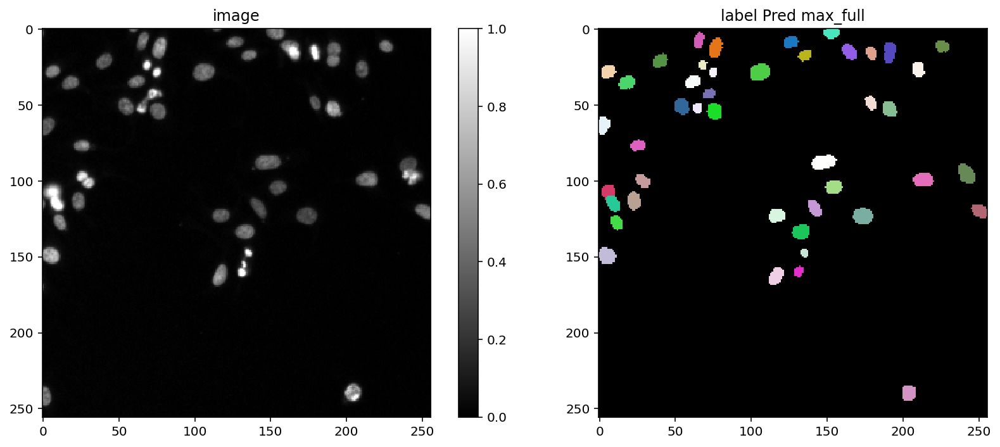

447it [00:04, 101.11it/s]


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 9s 135ms/step - loss: 2.6555 - prob_loss: 0.7559 - dist_loss: 9.4981 - prob_kld: 0.6918 - dist_relevant_mae: 9.4978 - dist_relevant_mse: 182.0658 - dist_dist_iou_metric: 0.1022 - val_loss: 2.4206 - val_prob_loss: 0.5943 - val_dist_loss: 9.1313 - val_prob_kld: 0.5134 - val_dist_relevant_mae: 9.1310 - val_dist_relevant_mse: 174.1804 - val_dist_dist_iou_metric: 0.1757 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 102ms/step - loss: 2.1978 - prob_loss: 0.7212 - dist_loss: 7.3831 - prob_kld: 0.6465 - dist_relevant_mae: 7.3825 - dist_relevant_mse: 122.3766 - dist_dist_iou_metric: 0.2545 - val_loss: 2.6839 - val_prob_loss: 0.6409 - val_dist_loss: 10.2146 - val_prob_kld: 0.5600 - val_dist_relevant_mae: 10.2144 - val_dist_relevant_mse: 206.4738 - val_dist_dist_iou_metric: 0.0953 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 6s 106ms/step 

Epoch 20/100
56/56 [==============================] - 5s 93ms/step - loss: 1.3187 - prob_loss: 0.6239 - dist_loss: 3.4741 - prob_kld: 0.5762 - dist_relevant_mae: 3.4734 - dist_relevant_mse: 31.8163 - dist_dist_iou_metric: 0.5666 - val_loss: 1.4519 - val_prob_loss: 0.6278 - val_dist_loss: 4.1202 - val_prob_kld: 0.5469 - val_dist_relevant_mae: 4.1196 - val_dist_relevant_mse: 46.2085 - val_dist_dist_iou_metric: 0.5254 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 5s 94ms/step - loss: 1.3240 - prob_loss: 0.6454 - dist_loss: 3.3928 - prob_kld: 0.5930 - dist_relevant_mae: 3.3923 - dist_relevant_mse: 32.6703 - dist_dist_iou_metric: 0.5639 - val_loss: 1.2862 - val_prob_loss: 0.5792 - val_dist_loss: 3.5350 - val_prob_kld: 0.4983 - val_dist_relevant_mae: 3.5346 - val_dist_relevant_mse: 32.7662 - val_dist_dist_iou_metric: 0.6057 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 5s 96ms/step - loss: 1.2835 - prob_loss: 0.6211 - dist_loss: 3.3121 - prob

Epoch 39/100
56/56 [==============================] - 5s 97ms/step - loss: 1.2074 - prob_loss: 0.6132 - dist_loss: 2.9712 - prob_kld: 1.0806 - dist_relevant_mae: 2.9707 - dist_relevant_mse: 25.1864 - dist_dist_iou_metric: 0.6160 - val_loss: 1.7059 - val_prob_loss: 1.0793 - val_dist_loss: 3.1329 - val_prob_kld: 0.9984 - val_dist_relevant_mae: 3.1325 - val_dist_relevant_mse: 28.6468 - val_dist_dist_iou_metric: 0.6296 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 5s 95ms/step - loss: 1.1923 - prob_loss: 0.6120 - dist_loss: 2.9016 - prob_kld: 0.8491 - dist_relevant_mae: 2.9010 - dist_relevant_mse: 24.5181 - dist_dist_iou_metric: 0.6243 - val_loss: 1.4570 - val_prob_loss: 0.8262 - val_dist_loss: 3.1538 - val_prob_kld: 0.7453 - val_dist_relevant_mae: 3.1532 - val_dist_relevant_mse: 27.9100 - val_dist_dist_iou_metric: 0.6314 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 5s 98ms/step - loss: 1.2082 - prob_loss: 0.6176 - dist_loss: 2.9527 - prob

Epoch 58/100
56/56 [==============================] - 5s 94ms/step - loss: 1.1674 - prob_loss: 0.6127 - dist_loss: 2.7735 - prob_kld: 0.9391 - dist_relevant_mae: 2.7729 - dist_relevant_mse: 24.8328 - dist_dist_iou_metric: 0.6316 - val_loss: 1.3649 - val_prob_loss: 0.7289 - val_dist_loss: 3.1802 - val_prob_kld: 0.6480 - val_dist_relevant_mae: 3.1797 - val_dist_relevant_mse: 29.3519 - val_dist_dist_iou_metric: 0.6261 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 5s 93ms/step - loss: 1.1469 - prob_loss: 0.6116 - dist_loss: 2.6766 - prob_kld: 0.8326 - dist_relevant_mae: 2.6760 - dist_relevant_mse: 20.4624 - dist_dist_iou_metric: 0.6470 - val_loss: 1.7367 - val_prob_loss: 0.9639 - val_dist_loss: 3.8640 - val_prob_kld: 0.8830 - val_dist_relevant_mae: 3.8637 - val_dist_relevant_mse: 43.5363 - val_dist_dist_iou_metric: 0.5697 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 5s 94ms/step - loss: 1.1668 - prob_loss: 0.6198 - dist_loss: 2.7350 - prob

Epoch 77/100
56/56 [==============================] - 5s 94ms/step - loss: 1.0794 - prob_loss: 0.6017 - dist_loss: 2.3884 - prob_kld: 0.9141 - dist_relevant_mae: 2.3878 - dist_relevant_mse: 17.2361 - dist_dist_iou_metric: 0.6793 - val_loss: 1.6688 - val_prob_loss: 1.0363 - val_dist_loss: 3.1629 - val_prob_kld: 0.9554 - val_dist_relevant_mae: 3.1625 - val_dist_relevant_mse: 27.7855 - val_dist_dist_iou_metric: 0.6201 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 5s 94ms/step - loss: 1.0713 - prob_loss: 0.6061 - dist_loss: 2.3258 - prob_kld: 1.0119 - dist_relevant_mae: 2.3253 - dist_relevant_mse: 16.2260 - dist_dist_iou_metric: 0.6686 - val_loss: 1.6407 - val_prob_loss: 1.1088 - val_dist_loss: 2.6595 - val_prob_kld: 1.0279 - val_dist_relevant_mae: 2.6592 - val_dist_relevant_mse: 22.6791 - val_dist_dist_iou_metric: 0.6738 - lr: 3.0000e-04
Epoch 79/100
56/56 [==============================] - 5s 94ms/step - loss: 1.1147 - prob_loss: 0.6141 - dist_loss: 2.5031 - prob

Epoch 96/100
56/56 [==============================] - 5s 95ms/step - loss: 1.0560 - prob_loss: 0.6011 - dist_loss: 2.2745 - prob_kld: 0.9297 - dist_relevant_mae: 2.2739 - dist_relevant_mse: 14.6739 - dist_dist_iou_metric: 0.6810 - val_loss: 1.4939 - val_prob_loss: 0.9858 - val_dist_loss: 2.5405 - val_prob_kld: 0.9049 - val_dist_relevant_mae: 2.5400 - val_dist_relevant_mse: 20.4480 - val_dist_dist_iou_metric: 0.7018 - lr: 3.0000e-04
Epoch 97/100
56/56 [==============================] - 5s 94ms/step - loss: 1.0434 - prob_loss: 0.6023 - dist_loss: 2.2059 - prob_kld: 1.0435 - dist_relevant_mae: 2.2054 - dist_relevant_mse: 13.9273 - dist_dist_iou_metric: 0.6794 - val_loss: 1.5978 - val_prob_loss: 1.0900 - val_dist_loss: 2.5392 - val_prob_kld: 1.0091 - val_dist_relevant_mae: 2.5388 - val_dist_relevant_mse: 20.2841 - val_dist_dist_iou_metric: 0.6908 - lr: 3.0000e-04
Epoch 98/100
56/56 [==============================] - 5s 94ms/step - loss: 1.0508 - prob_loss: 0.6048 - dist_loss: 2.2301 - prob

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/minmax_001


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [02:38<00:00,  3.18s/it]


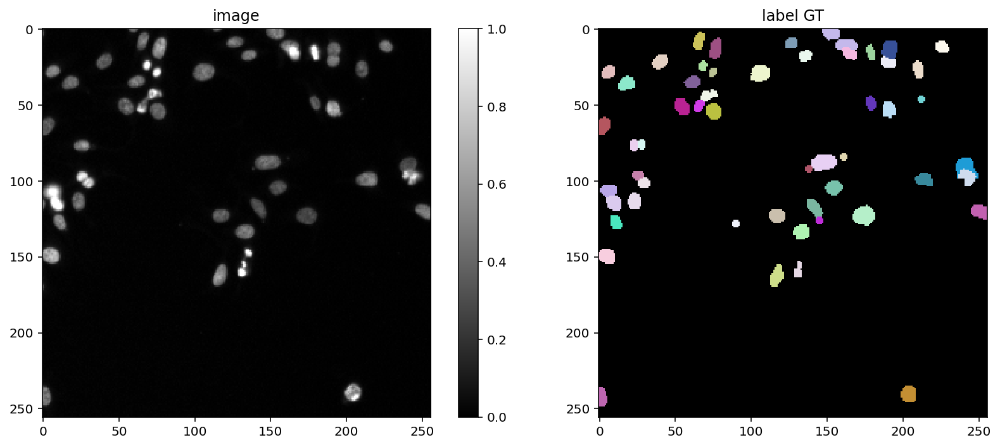

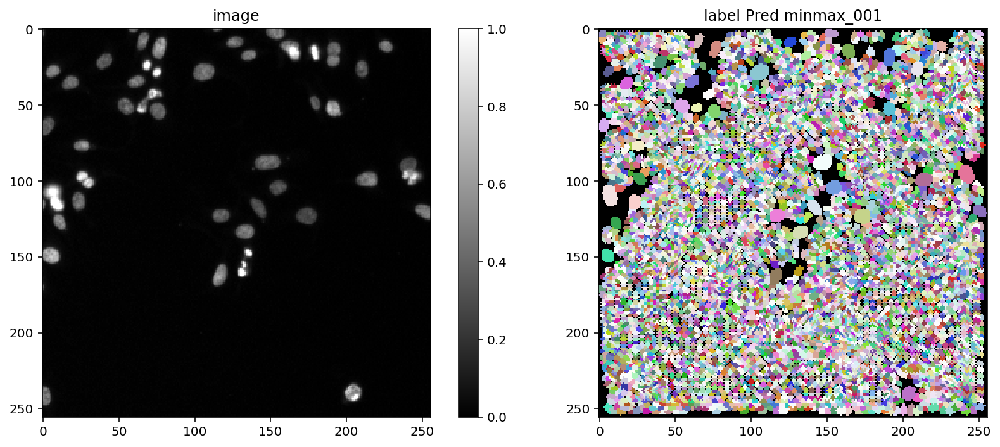

447it [00:04, 100.39it/s]


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 10s 144ms/step - loss: 2.7980 - prob_loss: 0.7233 - dist_loss: 10.3734 - prob_kld: 0.5547 - dist_relevant_mae: 10.3732 - dist_relevant_mse: 223.0875 - dist_dist_iou_metric: 0.1451 - val_loss: 2.7544 - val_prob_loss: 0.7201 - val_dist_loss: 10.1715 - val_prob_kld: 0.6400 - val_dist_relevant_mae: 10.1712 - val_dist_relevant_mse: 207.9356 - val_dist_dist_iou_metric: 0.1173 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 101ms/step - loss: 2.3203 - prob_loss: 0.6835 - dist_loss: 8.1840 - prob_kld: 0.5345 - dist_relevant_mae: 8.1835 - dist_relevant_mse: 146.2895 - dist_dist_iou_metric: 0.2702 - val_loss: 2.3629 - val_prob_loss: 0.5198 - val_dist_loss: 9.2157 - val_prob_kld: 0.4396 - val_dist_relevant_mae: 9.2154 - val_dist_relevant_mse: 180.1059 - val_dist_dist_iou_metric: 0.1594 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 5s 98ms/ste

Epoch 20/100
56/56 [==============================] - 6s 109ms/step - loss: 1.2476 - prob_loss: 0.6205 - dist_loss: 3.1356 - prob_kld: 0.6896 - dist_relevant_mae: 3.1350 - dist_relevant_mse: 27.3552 - dist_dist_iou_metric: 0.6204 - val_loss: 1.2849 - val_prob_loss: 0.6139 - val_dist_loss: 3.3546 - val_prob_kld: 0.5338 - val_dist_relevant_mae: 3.3541 - val_dist_relevant_mse: 30.3470 - val_dist_dist_iou_metric: 0.6078 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 6s 109ms/step - loss: 1.2086 - prob_loss: 0.6108 - dist_loss: 2.9890 - prob_kld: 0.7476 - dist_relevant_mae: 2.9884 - dist_relevant_mse: 25.0448 - dist_dist_iou_metric: 0.6318 - val_loss: 1.6015 - val_prob_loss: 0.9465 - val_dist_loss: 3.2752 - val_prob_kld: 0.8663 - val_dist_relevant_mae: 3.2747 - val_dist_relevant_mse: 28.4960 - val_dist_dist_iou_metric: 0.6194 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 6s 110ms/step - loss: 1.1943 - prob_loss: 0.6038 - dist_loss: 2.9527 - p

Epoch 39/100
56/56 [==============================] - 6s 107ms/step - loss: 1.0502 - prob_loss: 0.6008 - dist_loss: 2.2471 - prob_kld: 1.0668 - dist_relevant_mae: 2.2466 - dist_relevant_mse: 15.1406 - dist_dist_iou_metric: 0.7035 - val_loss: 1.7343 - val_prob_loss: 1.1641 - val_dist_loss: 2.8512 - val_prob_kld: 1.0839 - val_dist_relevant_mae: 2.8507 - val_dist_relevant_mse: 22.2091 - val_dist_dist_iou_metric: 0.6865 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 6s 110ms/step - loss: 1.0623 - prob_loss: 0.5995 - dist_loss: 2.3141 - prob_kld: 1.1132 - dist_relevant_mae: 2.3136 - dist_relevant_mse: 15.7964 - dist_dist_iou_metric: 0.6975 - val_loss: 1.1563 - val_prob_loss: 0.6129 - val_dist_loss: 2.7169 - val_prob_kld: 0.5327 - val_dist_relevant_mae: 2.7158 - val_dist_relevant_mse: 20.5909 - val_dist_dist_iou_metric: 0.6978 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 6s 108ms/step - loss: 1.0894 - prob_loss: 0.5993 - dist_loss: 2.4505 - p

Epoch 58/100
56/56 [==============================] - 5s 95ms/step - loss: 1.0191 - prob_loss: 0.5995 - dist_loss: 2.0976 - prob_kld: 1.0593 - dist_relevant_mae: 2.0972 - dist_relevant_mse: 12.9097 - dist_dist_iou_metric: 0.7199 - val_loss: 1.5921 - val_prob_loss: 1.1245 - val_dist_loss: 2.3379 - val_prob_kld: 1.0443 - val_dist_relevant_mae: 2.3375 - val_dist_relevant_mse: 16.9974 - val_dist_dist_iou_metric: 0.7209 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 5s 96ms/step - loss: 0.9815 - prob_loss: 0.5924 - dist_loss: 1.9452 - prob_kld: 1.0959 - dist_relevant_mae: 1.9448 - dist_relevant_mse: 11.7400 - dist_dist_iou_metric: 0.7295 - val_loss: 1.6808 - val_prob_loss: 1.2063 - val_dist_loss: 2.3725 - val_prob_kld: 1.1261 - val_dist_relevant_mae: 2.3721 - val_dist_relevant_mse: 16.9098 - val_dist_dist_iou_metric: 0.7089 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 5s 95ms/step - loss: 1.0121 - prob_loss: 0.5977 - dist_loss: 2.0716 - prob

Epoch 77/100
56/56 [==============================] - 5s 94ms/step - loss: 0.9788 - prob_loss: 0.5942 - dist_loss: 1.9230 - prob_kld: 0.9531 - dist_relevant_mae: 1.9225 - dist_relevant_mse: 11.6358 - dist_dist_iou_metric: 0.7455 - val_loss: 1.5635 - val_prob_loss: 1.1300 - val_dist_loss: 2.1673 - val_prob_kld: 1.0498 - val_dist_relevant_mae: 2.1669 - val_dist_relevant_mse: 15.2631 - val_dist_dist_iou_metric: 0.7360 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 5s 95ms/step - loss: 0.9550 - prob_loss: 0.5978 - dist_loss: 1.7860 - prob_kld: 0.8493 - dist_relevant_mae: 1.7854 - dist_relevant_mse: 10.2847 - dist_dist_iou_metric: 0.7542 - val_loss: 1.2687 - val_prob_loss: 0.8316 - val_dist_loss: 2.1853 - val_prob_kld: 0.7514 - val_dist_relevant_mae: 2.1848 - val_dist_relevant_mse: 14.6377 - val_dist_dist_iou_metric: 0.7279 - lr: 3.0000e-04
Epoch 79/100
56/56 [==============================] - 5s 96ms/step - loss: 0.9569 - prob_loss: 0.5894 - dist_loss: 1.8374 - prob

56/56 [==============================] - 5s 97ms/step - loss: 0.9414 - prob_loss: 0.5869 - dist_loss: 1.7726 - prob_kld: 1.1553 - dist_relevant_mae: 1.7721 - dist_relevant_mse: 10.4098 - dist_dist_iou_metric: 0.7680 - val_loss: 1.6336 - val_prob_loss: 1.2402 - val_dist_loss: 1.9671 - val_prob_kld: 1.1600 - val_dist_relevant_mae: 1.9667 - val_dist_relevant_mse: 12.5289 - val_dist_dist_iou_metric: 0.7513 - lr: 1.5000e-04
Epoch 96/100
56/56 [==============================] - 5s 96ms/step - loss: 0.9420 - prob_loss: 0.5881 - dist_loss: 1.7691 - prob_kld: 1.1991 - dist_relevant_mae: 1.7687 - dist_relevant_mse: 9.3595 - dist_dist_iou_metric: 0.7630 - val_loss: 1.5360 - val_prob_loss: 1.1332 - val_dist_loss: 2.0137 - val_prob_kld: 1.0531 - val_dist_relevant_mae: 2.0134 - val_dist_relevant_mse: 13.7322 - val_dist_dist_iou_metric: 0.7534 - lr: 1.5000e-04
Epoch 97/100
56/56 [==============================] - 5s 96ms/step - loss: 0.9566 - prob_loss: 0.5871 - dist_loss: 1.8478 - prob_kld: 1.0260 -

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/minmax_004


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [02:15<00:00,  2.71s/it]


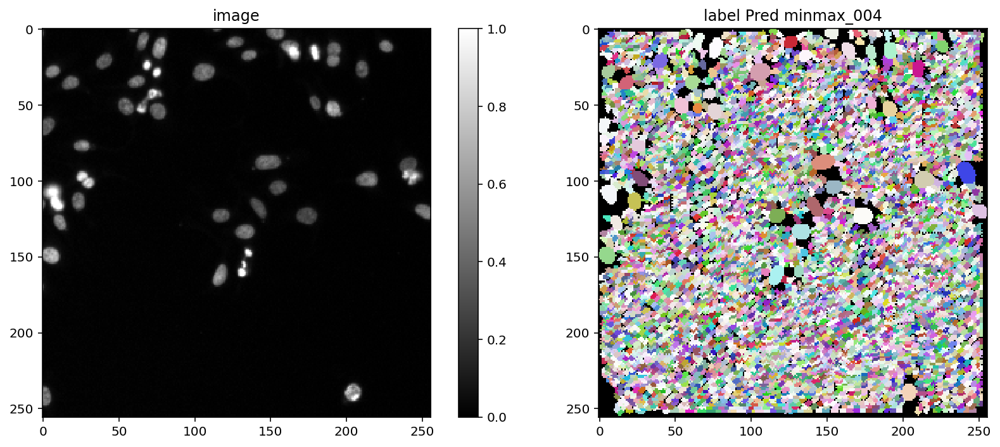

447it [00:04, 103.47it/s]


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 11s 152ms/step - loss: 2.9990 - prob_loss: 0.7260 - dist_loss: 11.3650 - prob_kld: 0.5863 - dist_relevant_mae: 11.3647 - dist_relevant_mse: 243.3593 - dist_dist_iou_metric: 0.1251 - val_loss: 2.3867 - val_prob_loss: 0.6503 - val_dist_loss: 8.6820 - val_prob_kld: 0.5696 - val_dist_relevant_mae: 8.6816 - val_dist_relevant_mse: 159.9547 - val_dist_dist_iou_metric: 0.2336 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 108ms/step - loss: 2.2119 - prob_loss: 0.6922 - dist_loss: 7.5986 - prob_kld: 0.5289 - dist_relevant_mae: 7.5980 - dist_relevant_mse: 122.0046 - dist_dist_iou_metric: 0.2997 - val_loss: 2.0589 - val_prob_loss: 0.6736 - val_dist_loss: 6.9269 - val_prob_kld: 0.5929 - val_dist_relevant_mae: 6.9261 - val_dist_relevant_mse: 98.7778 - val_dist_dist_iou_metric: 0.3666 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 6s 105ms/step 

Epoch 20/100
56/56 [==============================] - 5s 99ms/step - loss: 1.1571 - prob_loss: 0.6018 - dist_loss: 2.7766 - prob_kld: 0.5232 - dist_relevant_mae: 2.7759 - dist_relevant_mse: 21.5998 - dist_dist_iou_metric: 0.6722 - val_loss: 1.1368 - val_prob_loss: 0.5942 - val_dist_loss: 2.7132 - val_prob_kld: 0.5134 - val_dist_relevant_mae: 2.7128 - val_dist_relevant_mse: 21.7562 - val_dist_dist_iou_metric: 0.6763 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 6s 100ms/step - loss: 1.1508 - prob_loss: 0.5970 - dist_loss: 2.7686 - prob_kld: 0.5001 - dist_relevant_mae: 2.7681 - dist_relevant_mse: 22.5063 - dist_dist_iou_metric: 0.6750 - val_loss: 1.1340 - val_prob_loss: 0.5457 - val_dist_loss: 2.9418 - val_prob_kld: 0.4649 - val_dist_relevant_mae: 2.9411 - val_dist_relevant_mse: 21.1238 - val_dist_dist_iou_metric: 0.6752 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 5s 97ms/step - loss: 1.1274 - prob_loss: 0.5938 - dist_loss: 2.6678 - pro

Epoch 39/100
56/56 [==============================] - 6s 100ms/step - loss: 1.0016 - prob_loss: 0.5910 - dist_loss: 2.0529 - prob_kld: 0.7055 - dist_relevant_mae: 2.0524 - dist_relevant_mse: 12.7098 - dist_dist_iou_metric: 0.7365 - val_loss: 1.2989 - val_prob_loss: 0.8665 - val_dist_loss: 2.1624 - val_prob_kld: 0.7857 - val_dist_relevant_mae: 2.1620 - val_dist_relevant_mse: 14.2038 - val_dist_dist_iou_metric: 0.7334 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 6s 101ms/step - loss: 1.0041 - prob_loss: 0.5894 - dist_loss: 2.0732 - prob_kld: 0.6187 - dist_relevant_mae: 2.0727 - dist_relevant_mse: 13.5480 - dist_dist_iou_metric: 0.7442 - val_loss: 1.1292 - val_prob_loss: 0.6914 - val_dist_loss: 2.1891 - val_prob_kld: 0.6107 - val_dist_relevant_mae: 2.1887 - val_dist_relevant_mse: 14.9621 - val_dist_dist_iou_metric: 0.7274 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 5s 98ms/step - loss: 1.0165 - prob_loss: 0.5916 - dist_loss: 2.1248 - pr

Epoch 58/100
56/56 [==============================] - ETA: 0s - loss: 0.9549 - prob_loss: 0.5870 - dist_loss: 1.8395 - prob_kld: 0.7287 - dist_relevant_mae: 1.8390 - dist_relevant_mse: 10.4165 - dist_dist_iou_metric: 0.7645
Epoch 00058: ReduceLROnPlateau reducing learning rate to 0.0001500000071246177.
56/56 [==============================] - 5s 96ms/step - loss: 0.9549 - prob_loss: 0.5870 - dist_loss: 1.8395 - prob_kld: 0.7287 - dist_relevant_mae: 1.8390 - dist_relevant_mse: 10.4165 - dist_dist_iou_metric: 0.7645 - val_loss: 1.2778 - val_prob_loss: 0.9102 - val_dist_loss: 1.8379 - val_prob_kld: 0.8295 - val_dist_relevant_mae: 1.8375 - val_dist_relevant_mse: 10.6803 - val_dist_dist_iou_metric: 0.7675 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 5s 97ms/step - loss: 0.9410 - prob_loss: 0.5854 - dist_loss: 1.7778 - prob_kld: 0.8571 - dist_relevant_mae: 1.7774 - dist_relevant_mse: 10.0852 - dist_dist_iou_metric: 0.7725 - val_loss: 1.2578 - val_prob_loss: 0.8773 -

56/56 [==============================] - 5s 94ms/step - loss: 0.9374 - prob_loss: 0.5848 - dist_loss: 1.7631 - prob_kld: 0.9353 - dist_relevant_mae: 1.7627 - dist_relevant_mse: 10.3161 - dist_dist_iou_metric: 0.7745 - val_loss: 1.4228 - val_prob_loss: 1.0614 - val_dist_loss: 1.8066 - val_prob_kld: 0.9807 - val_dist_relevant_mae: 1.8063 - val_dist_relevant_mse: 9.9967 - val_dist_dist_iou_metric: 0.7668 - lr: 1.5000e-04
Epoch 77/100
56/56 [==============================] - 5s 96ms/step - loss: 0.9148 - prob_loss: 0.5833 - dist_loss: 1.6574 - prob_kld: 1.0184 - dist_relevant_mae: 1.6570 - dist_relevant_mse: 8.8022 - dist_dist_iou_metric: 0.7828 - val_loss: 1.3573 - val_prob_loss: 1.0030 - val_dist_loss: 1.7715 - val_prob_kld: 0.9223 - val_dist_relevant_mae: 1.7710 - val_dist_relevant_mse: 9.9647 - val_dist_dist_iou_metric: 0.7772 - lr: 1.5000e-04
Epoch 78/100
56/56 [==============================] - 5s 97ms/step - loss: 0.9358 - prob_loss: 0.5832 - dist_loss: 1.7630 - prob_kld: 0.9898 - d

Epoch 95/100
56/56 [==============================] - 5s 98ms/step - loss: 0.9038 - prob_loss: 0.5858 - dist_loss: 1.5901 - prob_kld: 0.9974 - dist_relevant_mae: 1.5897 - dist_relevant_mse: 7.9228 - dist_dist_iou_metric: 0.7874 - val_loss: 1.4772 - val_prob_loss: 1.1455 - val_dist_loss: 1.6586 - val_prob_kld: 1.0648 - val_dist_relevant_mae: 1.6582 - val_dist_relevant_mse: 8.7731 - val_dist_dist_iou_metric: 0.7909 - lr: 1.5000e-04
Epoch 96/100
56/56 [==============================] - 5s 98ms/step - loss: 0.9065 - prob_loss: 0.5834 - dist_loss: 1.6154 - prob_kld: 0.9921 - dist_relevant_mae: 1.6150 - dist_relevant_mse: 7.9970 - dist_dist_iou_metric: 0.7879 - val_loss: 1.4728 - val_prob_loss: 1.1421 - val_dist_loss: 1.6534 - val_prob_kld: 1.0614 - val_dist_relevant_mae: 1.6530 - val_dist_relevant_mse: 8.7229 - val_dist_dist_iou_metric: 0.7915 - lr: 1.5000e-04
Epoch 97/100
56/56 [==============================] - 5s 99ms/step - loss: 0.9041 - prob_loss: 0.5824 - dist_loss: 1.6084 - prob_kld

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/minmax_016


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [03:07<00:00,  3.75s/it]


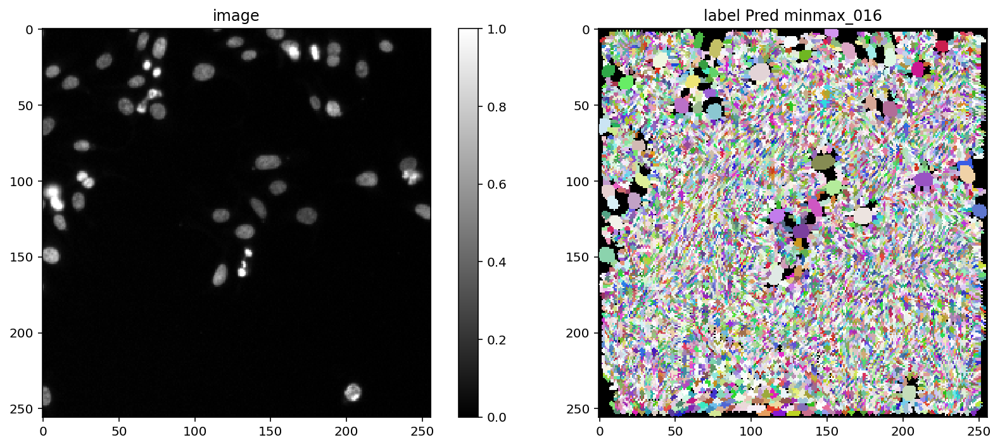

447it [00:04, 95.99it/s] 


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 10s 155ms/step - loss: 2.7484 - prob_loss: 0.7368 - dist_loss: 10.0576 - prob_kld: 0.5633 - dist_relevant_mae: 10.0572 - dist_relevant_mse: 196.7487 - dist_dist_iou_metric: 0.1578 - val_loss: 2.3378 - val_prob_loss: 0.6932 - val_dist_loss: 8.2228 - val_prob_kld: 0.6110 - val_dist_relevant_mae: 8.2223 - val_dist_relevant_mse: 145.6737 - val_dist_dist_iou_metric: 0.2444 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 109ms/step - loss: 2.2717 - prob_loss: 0.6943 - dist_loss: 7.8869 - prob_kld: 0.5429 - dist_relevant_mae: 7.8862 - dist_relevant_mse: 129.3226 - dist_dist_iou_metric: 0.2874 - val_loss: 2.0378 - val_prob_loss: 0.6224 - val_dist_loss: 7.0768 - val_prob_kld: 0.5402 - val_dist_relevant_mae: 7.0762 - val_dist_relevant_mse: 110.5859 - val_dist_dist_iou_metric: 0.3260 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 6s 104ms/step

Epoch 20/100
56/56 [==============================] - 6s 100ms/step - loss: 1.1089 - prob_loss: 0.5996 - dist_loss: 2.5464 - prob_kld: 0.4403 - dist_relevant_mae: 2.5458 - dist_relevant_mse: 18.4353 - dist_dist_iou_metric: 0.6817 - val_loss: 1.0962 - val_prob_loss: 0.5427 - val_dist_loss: 2.7676 - val_prob_kld: 0.4605 - val_dist_relevant_mae: 2.7671 - val_dist_relevant_mse: 20.5861 - val_dist_dist_iou_metric: 0.6799 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 6s 99ms/step - loss: 1.1116 - prob_loss: 0.5968 - dist_loss: 2.5738 - prob_kld: 0.4513 - dist_relevant_mae: 2.5733 - dist_relevant_mse: 18.2615 - dist_dist_iou_metric: 0.6814 - val_loss: 1.0514 - val_prob_loss: 0.5151 - val_dist_loss: 2.6812 - val_prob_kld: 0.4329 - val_dist_relevant_mae: 2.6806 - val_dist_relevant_mse: 21.0310 - val_dist_dist_iou_metric: 0.6718 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 6s 100ms/step - loss: 1.1605 - prob_loss: 0.5999 - dist_loss: 2.8026 - pr

Epoch 39/100
56/56 [==============================] - 6s 99ms/step - loss: 1.0026 - prob_loss: 0.5899 - dist_loss: 2.0636 - prob_kld: 0.5423 - dist_relevant_mae: 2.0632 - dist_relevant_mse: 12.1538 - dist_dist_iou_metric: 0.7341 - val_loss: 0.9811 - val_prob_loss: 0.5341 - val_dist_loss: 2.2348 - val_prob_kld: 0.4519 - val_dist_relevant_mae: 2.2339 - val_dist_relevant_mse: 15.2110 - val_dist_dist_iou_metric: 0.7274 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 6s 101ms/step - loss: 0.9858 - prob_loss: 0.5901 - dist_loss: 1.9786 - prob_kld: 0.5213 - dist_relevant_mae: 1.9781 - dist_relevant_mse: 11.1888 - dist_dist_iou_metric: 0.7394 - val_loss: 1.1305 - val_prob_loss: 0.6780 - val_dist_loss: 2.2625 - val_prob_kld: 0.5957 - val_dist_relevant_mae: 2.2621 - val_dist_relevant_mse: 13.9768 - val_dist_dist_iou_metric: 0.7283 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 6s 100ms/step - loss: 0.9924 - prob_loss: 0.5929 - dist_loss: 1.9978 - pr

Epoch 58/100
56/56 [==============================] - 6s 102ms/step - loss: 0.9707 - prob_loss: 0.5902 - dist_loss: 1.9024 - prob_kld: 0.8733 - dist_relevant_mae: 1.9020 - dist_relevant_mse: 10.1294 - dist_dist_iou_metric: 0.7540 - val_loss: 1.4470 - val_prob_loss: 1.0452 - val_dist_loss: 2.0093 - val_prob_kld: 0.9630 - val_dist_relevant_mae: 2.0089 - val_dist_relevant_mse: 11.6551 - val_dist_dist_iou_metric: 0.7472 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 6s 103ms/step - loss: 0.9400 - prob_loss: 0.5886 - dist_loss: 1.7571 - prob_kld: 0.9255 - dist_relevant_mae: 1.7567 - dist_relevant_mse: 9.3908 - dist_dist_iou_metric: 0.7648 - val_loss: 1.2399 - val_prob_loss: 0.7981 - val_dist_loss: 2.2091 - val_prob_kld: 0.7158 - val_dist_relevant_mae: 2.2086 - val_dist_relevant_mse: 12.9138 - val_dist_dist_iou_metric: 0.7468 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 6s 104ms/step - loss: 0.9425 - prob_loss: 0.5867 - dist_loss: 1.7792 - pr

56/56 [==============================] - 6s 104ms/step - loss: 0.9047 - prob_loss: 0.5847 - dist_loss: 1.5996 - prob_kld: 0.9154 - dist_relevant_mae: 1.5992 - dist_relevant_mse: 7.8717 - dist_dist_iou_metric: 0.7828 - val_loss: 1.4635 - val_prob_loss: 1.1269 - val_dist_loss: 1.6831 - val_prob_kld: 1.0446 - val_dist_relevant_mae: 1.6827 - val_dist_relevant_mse: 8.7136 - val_dist_dist_iou_metric: 0.7769 - lr: 1.5000e-04
Epoch 77/100
56/56 [==============================] - 6s 104ms/step - loss: 0.9043 - prob_loss: 0.5857 - dist_loss: 1.5931 - prob_kld: 0.8365 - dist_relevant_mae: 1.5926 - dist_relevant_mse: 8.2598 - dist_dist_iou_metric: 0.7839 - val_loss: 1.2067 - val_prob_loss: 0.8738 - val_dist_loss: 1.6643 - val_prob_kld: 0.7916 - val_dist_relevant_mae: 1.6640 - val_dist_relevant_mse: 8.6884 - val_dist_dist_iou_metric: 0.7808 - lr: 1.5000e-04
Epoch 78/100
56/56 [==============================] - 6s 104ms/step - loss: 0.9072 - prob_loss: 0.5853 - dist_loss: 1.6094 - prob_kld: 0.5398 -

Epoch 95/100
56/56 [==============================] - 6s 103ms/step - loss: 0.8835 - prob_loss: 0.5835 - dist_loss: 1.5003 - prob_kld: 1.1045 - dist_relevant_mae: 1.4999 - dist_relevant_mse: 6.9378 - dist_dist_iou_metric: 0.7966 - val_loss: 1.4379 - val_prob_loss: 1.1144 - val_dist_loss: 1.6176 - val_prob_kld: 1.0321 - val_dist_relevant_mae: 1.6172 - val_dist_relevant_mse: 8.8354 - val_dist_dist_iou_metric: 0.7896 - lr: 1.5000e-04
Epoch 96/100
56/56 [==============================] - 6s 103ms/step - loss: 0.8831 - prob_loss: 0.5812 - dist_loss: 1.5092 - prob_kld: 1.2191 - dist_relevant_mae: 1.5089 - dist_relevant_mse: 7.4743 - dist_dist_iou_metric: 0.7980 - val_loss: 1.5067 - val_prob_loss: 1.1842 - val_dist_loss: 1.6121 - val_prob_kld: 1.1020 - val_dist_relevant_mae: 1.6117 - val_dist_relevant_mse: 8.5163 - val_dist_dist_iou_metric: 0.7875 - lr: 1.5000e-04
Epoch 97/100
56/56 [==============================] - 6s 103ms/step - loss: 0.8870 - prob_loss: 0.5836 - dist_loss: 1.5169 - prob_

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/minmax_064


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [04:24<00:00,  5.28s/it]


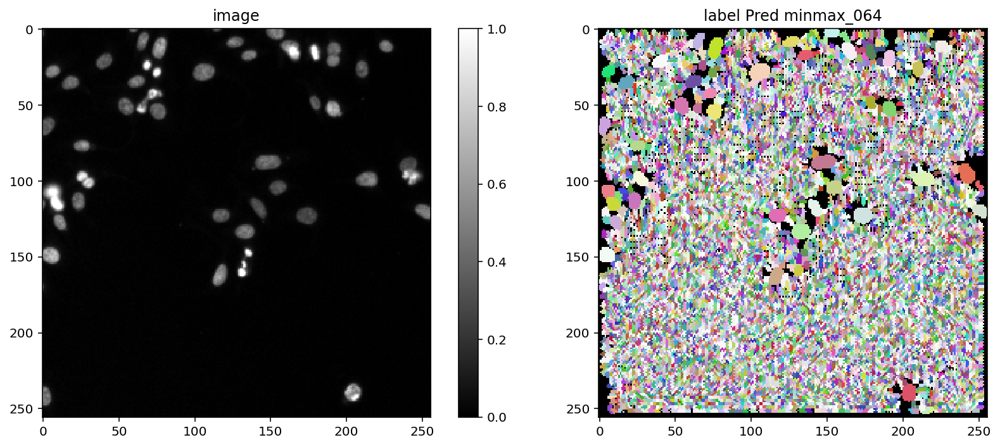

447it [00:04, 95.57it/s] 


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 10s 154ms/step - loss: 2.9087 - prob_loss: 0.7103 - dist_loss: 10.9923 - prob_kld: 0.5354 - dist_relevant_mae: 10.9920 - dist_relevant_mse: 227.1095 - dist_dist_iou_metric: 0.1187 - val_loss: 2.4994 - val_prob_loss: 0.6686 - val_dist_loss: 9.1538 - val_prob_kld: 0.5867 - val_dist_relevant_mae: 9.1534 - val_dist_relevant_mse: 175.6637 - val_dist_dist_iou_metric: 0.1736 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 115ms/step - loss: 2.1612 - prob_loss: 0.7148 - dist_loss: 7.2322 - prob_kld: 0.5185 - dist_relevant_mae: 7.2315 - dist_relevant_mse: 109.3976 - dist_dist_iou_metric: 0.3001 - val_loss: 2.2765 - val_prob_loss: 0.5561 - val_dist_loss: 8.6017 - val_prob_kld: 0.4742 - val_dist_relevant_mae: 8.6013 - val_dist_relevant_mse: 159.9338 - val_dist_dist_iou_metric: 0.1817 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 6s 106ms/step

Epoch 20/100
56/56 [==============================] - 5s 99ms/step - loss: 1.0888 - prob_loss: 0.5982 - dist_loss: 2.4530 - prob_kld: 0.4705 - dist_relevant_mae: 2.4525 - dist_relevant_mse: 17.3056 - dist_dist_iou_metric: 0.6877 - val_loss: 1.0702 - val_prob_loss: 0.5351 - val_dist_loss: 2.6754 - val_prob_kld: 0.4531 - val_dist_relevant_mae: 2.6748 - val_dist_relevant_mse: 20.3739 - val_dist_dist_iou_metric: 0.6899 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 5s 99ms/step - loss: 1.1372 - prob_loss: 0.5996 - dist_loss: 2.6880 - prob_kld: 0.4876 - dist_relevant_mae: 2.6875 - dist_relevant_mse: 20.4563 - dist_dist_iou_metric: 0.6733 - val_loss: 1.0965 - val_prob_loss: 0.5267 - val_dist_loss: 2.8489 - val_prob_kld: 0.4448 - val_dist_relevant_mae: 2.8483 - val_dist_relevant_mse: 21.2697 - val_dist_dist_iou_metric: 0.6870 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 5s 98ms/step - loss: 1.0919 - prob_loss: 0.6024 - dist_loss: 2.4471 - prob

Epoch 39/100
56/56 [==============================] - 6s 107ms/step - loss: 0.9898 - prob_loss: 0.5945 - dist_loss: 1.9766 - prob_kld: 0.6008 - dist_relevant_mae: 1.9762 - dist_relevant_mse: 11.6131 - dist_dist_iou_metric: 0.7363 - val_loss: 1.1107 - val_prob_loss: 0.6852 - val_dist_loss: 2.1276 - val_prob_kld: 0.6032 - val_dist_relevant_mae: 2.1271 - val_dist_relevant_mse: 14.8677 - val_dist_dist_iou_metric: 0.7440 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 6s 107ms/step - loss: 0.9929 - prob_loss: 0.5922 - dist_loss: 2.0037 - prob_kld: 0.6144 - dist_relevant_mae: 2.0031 - dist_relevant_mse: 12.1092 - dist_dist_iou_metric: 0.7375 - val_loss: 1.1065 - val_prob_loss: 0.6857 - val_dist_loss: 2.1040 - val_prob_kld: 0.6038 - val_dist_relevant_mae: 2.1036 - val_dist_relevant_mse: 13.5505 - val_dist_dist_iou_metric: 0.7376 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 6s 104ms/step - loss: 0.9810 - prob_loss: 0.5917 - dist_loss: 1.9463 - p

Epoch 58/100
56/56 [==============================] - 6s 100ms/step - loss: 0.9460 - prob_loss: 0.5915 - dist_loss: 1.7723 - prob_kld: 0.8179 - dist_relevant_mae: 1.7719 - dist_relevant_mse: 9.7710 - dist_dist_iou_metric: 0.7661 - val_loss: 1.2029 - val_prob_loss: 0.8440 - val_dist_loss: 1.7947 - val_prob_kld: 0.7620 - val_dist_relevant_mae: 1.7943 - val_dist_relevant_mse: 10.7362 - val_dist_dist_iou_metric: 0.7727 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 6s 101ms/step - loss: 0.9410 - prob_loss: 0.5880 - dist_loss: 1.7651 - prob_kld: 0.8444 - dist_relevant_mae: 1.7648 - dist_relevant_mse: 8.9354 - dist_dist_iou_metric: 0.7631 - val_loss: 1.2014 - val_prob_loss: 0.8259 - val_dist_loss: 1.8774 - val_prob_kld: 0.7439 - val_dist_relevant_mae: 1.8770 - val_dist_relevant_mse: 10.8087 - val_dist_dist_iou_metric: 0.7707 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 6s 101ms/step - loss: 0.9388 - prob_loss: 0.5885 - dist_loss: 1.7515 - pro

Epoch 77/100
56/56 [==============================] - 6s 100ms/step - loss: 0.9181 - prob_loss: 0.5911 - dist_loss: 1.6347 - prob_kld: 1.0638 - dist_relevant_mae: 1.6343 - dist_relevant_mse: 8.3681 - dist_dist_iou_metric: 0.7836 - val_loss: 1.1203 - val_prob_loss: 0.7825 - val_dist_loss: 1.6890 - val_prob_kld: 0.7005 - val_dist_relevant_mae: 1.6885 - val_dist_relevant_mse: 9.9820 - val_dist_dist_iou_metric: 0.7830 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 5s 99ms/step - loss: 0.9212 - prob_loss: 0.5861 - dist_loss: 1.6756 - prob_kld: 0.8924 - dist_relevant_mae: 1.6751 - dist_relevant_mse: 8.3312 - dist_dist_iou_metric: 0.7759 - val_loss: 1.5290 - val_prob_loss: 1.1639 - val_dist_loss: 1.8254 - val_prob_kld: 1.0819 - val_dist_relevant_mae: 1.8249 - val_dist_relevant_mse: 10.0737 - val_dist_dist_iou_metric: 0.7763 - lr: 3.0000e-04
Epoch 79/100
56/56 [==============================] - 6s 100ms/step - loss: 0.9213 - prob_loss: 0.5834 - dist_loss: 1.6895 - prob_

56/56 [==============================] - 6s 101ms/step - loss: 0.8843 - prob_loss: 0.5827 - dist_loss: 1.5081 - prob_kld: 1.2237 - dist_relevant_mae: 1.5077 - dist_relevant_mse: 7.0337 - dist_dist_iou_metric: 0.7935 - val_loss: 1.5171 - val_prob_loss: 1.2016 - val_dist_loss: 1.5776 - val_prob_kld: 1.1196 - val_dist_relevant_mae: 1.5772 - val_dist_relevant_mse: 8.7815 - val_dist_dist_iou_metric: 0.7940 - lr: 1.5000e-04
Epoch 96/100
56/56 [==============================] - 6s 100ms/step - loss: 0.8805 - prob_loss: 0.5828 - dist_loss: 1.4886 - prob_kld: 1.2337 - dist_relevant_mae: 1.4882 - dist_relevant_mse: 6.8799 - dist_dist_iou_metric: 0.7948 - val_loss: 1.5912 - val_prob_loss: 1.2728 - val_dist_loss: 1.5918 - val_prob_kld: 1.1909 - val_dist_relevant_mae: 1.5914 - val_dist_relevant_mse: 8.8132 - val_dist_dist_iou_metric: 0.7928 - lr: 1.5000e-04
Epoch 97/100
56/56 [==============================] - 6s 101ms/step - loss: 0.8997 - prob_loss: 0.5841 - dist_loss: 1.5780 - prob_kld: 1.2285 -

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/minmax_256


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [02:36<00:00,  3.13s/it]


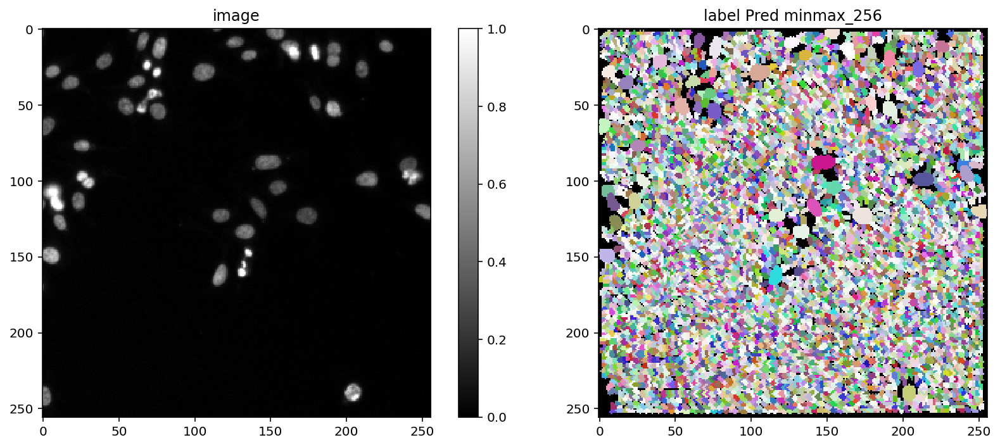

Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 11s 152ms/step - loss: 2.6579 - prob_loss: 0.3765 - dist_loss: 11.4073 - prob_kld: 0.3004 - dist_relevant_mae: 11.4070 - dist_relevant_mse: 239.2814 - dist_dist_iou_metric: 0.0942 - val_loss: 2.2012 - val_prob_loss: 0.3051 - val_dist_loss: 9.4805 - val_prob_kld: 0.2248 - val_dist_relevant_mae: 9.4800 - val_dist_relevant_mse: 192.8913 - val_dist_dist_iou_metric: 0.1862 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 113ms/step - loss: 1.8262 - prob_loss: 0.2990 - dist_loss: 7.6360 - prob_kld: 0.2232 - dist_relevant_mae: 7.6352 - dist_relevant_mse: 122.4720 - dist_dist_iou_metric: 0.3116 - val_loss: 1.7567 - val_prob_loss: 0.3582 - val_dist_loss: 6.9925 - val_prob_kld: 0.2778 - val_dist_relevant_mae: 6.9916 - val_dist_relevant_mse: 100.1875 - val_dist_dist_iou_metric: 0.3770 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 6s 106ms/step

Epoch 20/100
56/56 [==============================] - 7s 119ms/step - loss: 0.6673 - prob_loss: 0.0968 - dist_loss: 2.8524 - prob_kld: 0.0207 - dist_relevant_mae: 2.8518 - dist_relevant_mse: 22.5244 - dist_dist_iou_metric: 0.6500 - val_loss: 0.7040 - val_prob_loss: 0.0988 - val_dist_loss: 3.0259 - val_prob_kld: 0.0185 - val_dist_relevant_mae: 3.0253 - val_dist_relevant_mse: 28.2651 - val_dist_dist_iou_metric: 0.6376 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 6s 112ms/step - loss: 0.6445 - prob_loss: 0.1013 - dist_loss: 2.7161 - prob_kld: 0.0251 - dist_relevant_mae: 2.7155 - dist_relevant_mse: 21.6480 - dist_dist_iou_metric: 0.6605 - val_loss: 0.7202 - val_prob_loss: 0.1177 - val_dist_loss: 3.0124 - val_prob_kld: 0.0373 - val_dist_relevant_mae: 3.0120 - val_dist_relevant_mse: 28.5946 - val_dist_dist_iou_metric: 0.6417 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 6s 117ms/step - loss: 0.6588 - prob_loss: 0.1021 - dist_loss: 2.7834 - p

Epoch 39/100
56/56 [==============================] - 6s 107ms/step - loss: 0.5257 - prob_loss: 0.0928 - dist_loss: 2.1643 - prob_kld: 0.0159 - dist_relevant_mae: 2.1639 - dist_relevant_mse: 14.0855 - dist_dist_iou_metric: 0.7205 - val_loss: 0.5525 - val_prob_loss: 0.0957 - val_dist_loss: 2.2839 - val_prob_kld: 0.0153 - val_dist_relevant_mae: 2.2835 - val_dist_relevant_mse: 16.3546 - val_dist_dist_iou_metric: 0.7161 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 6s 103ms/step - loss: 0.5259 - prob_loss: 0.0908 - dist_loss: 2.1757 - prob_kld: 0.0168 - dist_relevant_mae: 2.1752 - dist_relevant_mse: 13.8396 - dist_dist_iou_metric: 0.7185 - val_loss: 0.6115 - val_prob_loss: 0.0978 - val_dist_loss: 2.5684 - val_prob_kld: 0.0174 - val_dist_relevant_mae: 2.5679 - val_dist_relevant_mse: 17.4327 - val_dist_dist_iou_metric: 0.7095 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 6s 105ms/step - loss: 0.5139 - prob_loss: 0.0921 - dist_loss: 2.1090 - p

Epoch 58/100
56/56 [==============================] - 6s 104ms/step - loss: 0.4701 - prob_loss: 0.0936 - dist_loss: 1.8824 - prob_kld: 0.0162 - dist_relevant_mae: 1.8819 - dist_relevant_mse: 10.7080 - dist_dist_iou_metric: 0.7550 - val_loss: 0.4799 - val_prob_loss: 0.0947 - val_dist_loss: 1.9261 - val_prob_kld: 0.0143 - val_dist_relevant_mae: 1.9257 - val_dist_relevant_mse: 10.9591 - val_dist_dist_iou_metric: 0.7594 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 6s 101ms/step - loss: 0.4833 - prob_loss: 0.0920 - dist_loss: 1.9564 - prob_kld: 0.0155 - dist_relevant_mae: 1.9560 - dist_relevant_mse: 11.4284 - dist_dist_iou_metric: 0.7467 - val_loss: 0.5585 - val_prob_loss: 0.0959 - val_dist_loss: 2.3131 - val_prob_kld: 0.0155 - val_dist_relevant_mae: 2.3127 - val_dist_relevant_mse: 16.7602 - val_dist_dist_iou_metric: 0.7138 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 6s 104ms/step - loss: 0.4944 - prob_loss: 0.0942 - dist_loss: 2.0006 - p

Epoch 77/100
56/56 [==============================] - 6s 111ms/step - loss: 0.4252 - prob_loss: 0.0925 - dist_loss: 1.6639 - prob_kld: 0.0151 - dist_relevant_mae: 1.6635 - dist_relevant_mse: 8.4241 - dist_dist_iou_metric: 0.7739 - val_loss: 0.4374 - val_prob_loss: 0.0936 - val_dist_loss: 1.7192 - val_prob_kld: 0.0132 - val_dist_relevant_mae: 1.7188 - val_dist_relevant_mse: 9.5653 - val_dist_dist_iou_metric: 0.7788 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 6s 105ms/step - loss: 0.4279 - prob_loss: 0.0909 - dist_loss: 1.6850 - prob_kld: 0.0139 - dist_relevant_mae: 1.6845 - dist_relevant_mse: 8.6613 - dist_dist_iou_metric: 0.7772 - val_loss: 0.4730 - val_prob_loss: 0.0941 - val_dist_loss: 1.8944 - val_prob_kld: 0.0137 - val_dist_relevant_mae: 1.8939 - val_dist_relevant_mse: 9.8187 - val_dist_dist_iou_metric: 0.7721 - lr: 3.0000e-04
Epoch 79/100
56/56 [==============================] - 6s 104ms/step - loss: 0.4370 - prob_loss: 0.0869 - dist_loss: 1.7507 - prob_

Epoch 96/100
56/56 [==============================] - 6s 109ms/step - loss: 0.4166 - prob_loss: 0.0920 - dist_loss: 1.6230 - prob_kld: 0.0156 - dist_relevant_mae: 1.6226 - dist_relevant_mse: 8.0499 - dist_dist_iou_metric: 0.7801 - val_loss: 0.4199 - val_prob_loss: 0.0936 - val_dist_loss: 1.6318 - val_prob_kld: 0.0132 - val_dist_relevant_mae: 1.6314 - val_dist_relevant_mse: 8.9373 - val_dist_dist_iou_metric: 0.7860 - lr: 3.0000e-04
Epoch 97/100
56/56 [==============================] - 6s 105ms/step - loss: 0.4050 - prob_loss: 0.0870 - dist_loss: 1.5903 - prob_kld: 0.0126 - dist_relevant_mae: 1.5899 - dist_relevant_mse: 7.7815 - dist_dist_iou_metric: 0.7862 - val_loss: 0.4253 - val_prob_loss: 0.0937 - val_dist_loss: 1.6581 - val_prob_kld: 0.0133 - val_dist_relevant_mae: 1.6577 - val_dist_relevant_mse: 9.3325 - val_dist_dist_iou_metric: 0.7873 - lr: 3.0000e-04
Epoch 98/100
56/56 [==============================] - 6s 105ms/step - loss: 0.4134 - prob_loss: 0.0897 - dist_loss: 1.6182 - prob_

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/minmax_full


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [00:13<00:00,  3.70it/s]


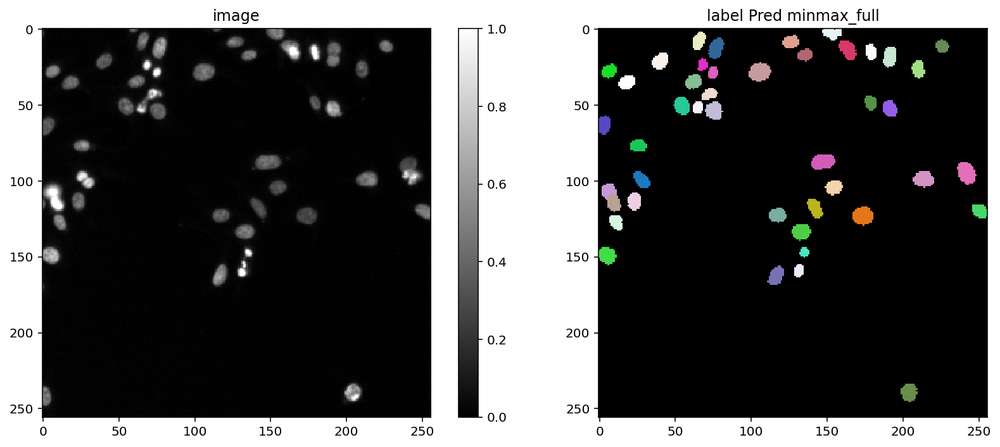

447it [00:04, 103.44it/s]
447it [00:00, 1655.35it/s]


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 9s 145ms/step - loss: 2.3016 - prob_loss: 0.6496 - dist_loss: 8.2602 - prob_kld: 0.4512 - dist_relevant_mae: 8.2601 - dist_relevant_mse: 137.9550 - dist_dist_iou_metric: 0.0378 - val_loss: 3.1343 - val_prob_loss: 0.5102 - val_dist_loss: 13.1205 - val_prob_kld: 0.4266 - val_dist_relevant_mae: 13.1204 - val_dist_relevant_mse: 296.6830 - val_dist_dist_iou_metric: 0.0120 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 104ms/step - loss: 2.0701 - prob_loss: 0.6668 - dist_loss: 7.0167 - prob_kld: 0.3759 - dist_relevant_mae: 7.0161 - dist_relevant_mse: 117.0251 - dist_dist_iou_metric: 0.2042 - val_loss: 2.4395 - val_prob_loss: 0.4809 - val_dist_loss: 9.7930 - val_prob_kld: 0.3973 - val_dist_relevant_mae: 9.7926 - val_dist_relevant_mse: 198.3161 - val_dist_dist_iou_metric: 0.1457 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 6s 100ms/step 

Epoch 20/100
56/56 [==============================] - 6s 101ms/step - loss: 1.1112 - prob_loss: 0.4671 - dist_loss: 3.2207 - prob_kld: 0.1892 - dist_relevant_mae: 3.2202 - dist_relevant_mse: 30.6867 - dist_dist_iou_metric: 0.5291 - val_loss: 1.1556 - val_prob_loss: 0.3496 - val_dist_loss: 4.0302 - val_prob_kld: 0.2660 - val_dist_relevant_mae: 4.0294 - val_dist_relevant_mse: 41.9036 - val_dist_dist_iou_metric: 0.5604 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 5s 94ms/step - loss: 1.0851 - prob_loss: 0.4742 - dist_loss: 3.0544 - prob_kld: 0.2228 - dist_relevant_mae: 3.0537 - dist_relevant_mse: 24.8807 - dist_dist_iou_metric: 0.5220 - val_loss: 0.9309 - val_prob_loss: 0.1302 - val_dist_loss: 4.0033 - val_prob_kld: 0.0466 - val_dist_relevant_mae: 4.0028 - val_dist_relevant_mse: 43.2671 - val_dist_dist_iou_metric: 0.5483 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 5s 95ms/step - loss: 1.0572 - prob_loss: 0.4554 - dist_loss: 3.0094 - pro

Epoch 39/100
56/56 [==============================] - 5s 98ms/step - loss: 0.9344 - prob_loss: 0.4356 - dist_loss: 2.4941 - prob_kld: 0.1784 - dist_relevant_mae: 2.4936 - dist_relevant_mse: 19.2346 - dist_dist_iou_metric: 0.5824 - val_loss: 0.8177 - val_prob_loss: 0.1242 - val_dist_loss: 3.4679 - val_prob_kld: 0.0406 - val_dist_relevant_mae: 3.4675 - val_dist_relevant_mse: 33.8398 - val_dist_dist_iou_metric: 0.5963 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 5s 94ms/step - loss: 0.9818 - prob_loss: 0.4305 - dist_loss: 2.7569 - prob_kld: 0.1585 - dist_relevant_mae: 2.7564 - dist_relevant_mse: 25.6978 - dist_dist_iou_metric: 0.5830 - val_loss: 0.9609 - val_prob_loss: 0.2220 - val_dist_loss: 3.6942 - val_prob_kld: 0.1384 - val_dist_relevant_mae: 3.6936 - val_dist_relevant_mse: 33.7922 - val_dist_dist_iou_metric: 0.6026 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 5s 92ms/step - loss: 0.9850 - prob_loss: 0.4341 - dist_loss: 2.7548 - prob

Epoch 58/100
56/56 [==============================] - 5s 92ms/step - loss: 0.8507 - prob_loss: 0.4181 - dist_loss: 2.1629 - prob_kld: 0.1472 - dist_relevant_mae: 2.1625 - dist_relevant_mse: 14.7243 - dist_dist_iou_metric: 0.6249 - val_loss: 0.7747 - val_prob_loss: 0.1415 - val_dist_loss: 3.1663 - val_prob_kld: 0.0579 - val_dist_relevant_mae: 3.1660 - val_dist_relevant_mse: 29.5111 - val_dist_dist_iou_metric: 0.6359 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 5s 91ms/step - loss: 0.9025 - prob_loss: 0.4236 - dist_loss: 2.3949 - prob_kld: 0.1585 - dist_relevant_mae: 2.3944 - dist_relevant_mse: 18.7262 - dist_dist_iou_metric: 0.6085 - val_loss: 0.8028 - val_prob_loss: 0.1304 - val_dist_loss: 3.3618 - val_prob_kld: 0.0468 - val_dist_relevant_mae: 3.3615 - val_dist_relevant_mse: 31.3086 - val_dist_dist_iou_metric: 0.6241 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 5s 92ms/step - loss: 0.8908 - prob_loss: 0.4255 - dist_loss: 2.3265 - prob

Epoch 77/100
56/56 [==============================] - 5s 90ms/step - loss: 0.7871 - prob_loss: 0.4119 - dist_loss: 1.8764 - prob_kld: 0.1530 - dist_relevant_mae: 1.8760 - dist_relevant_mse: 11.6220 - dist_dist_iou_metric: 0.6614 - val_loss: 0.7509 - val_prob_loss: 0.1279 - val_dist_loss: 3.1148 - val_prob_kld: 0.0443 - val_dist_relevant_mae: 3.1144 - val_dist_relevant_mse: 28.4830 - val_dist_dist_iou_metric: 0.6444 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 5s 91ms/step - loss: 0.8483 - prob_loss: 0.4098 - dist_loss: 2.1929 - prob_kld: 0.1577 - dist_relevant_mae: 2.1924 - dist_relevant_mse: 15.4251 - dist_dist_iou_metric: 0.6310 - val_loss: 0.8397 - val_prob_loss: 0.1438 - val_dist_loss: 3.4798 - val_prob_kld: 0.0602 - val_dist_relevant_mae: 3.4794 - val_dist_relevant_mse: 32.1178 - val_dist_dist_iou_metric: 0.6346 - lr: 3.0000e-04
Epoch 79/100
56/56 [==============================] - 4s 79ms/step - loss: 0.9348 - prob_loss: 0.4397 - dist_loss: 2.4757 - prob

Epoch 96/100
56/56 [==============================] - 5s 94ms/step - loss: 0.7995 - prob_loss: 0.4128 - dist_loss: 1.9335 - prob_kld: 0.1598 - dist_relevant_mae: 1.9331 - dist_relevant_mse: 12.2668 - dist_dist_iou_metric: 0.6584 - val_loss: 0.7632 - val_prob_loss: 0.1521 - val_dist_loss: 3.0557 - val_prob_kld: 0.0685 - val_dist_relevant_mae: 3.0553 - val_dist_relevant_mse: 28.9709 - val_dist_dist_iou_metric: 0.6236 - lr: 3.0000e-04
Epoch 97/100
56/56 [==============================] - 5s 94ms/step - loss: 0.8336 - prob_loss: 0.4222 - dist_loss: 2.0569 - prob_kld: 0.1613 - dist_relevant_mae: 2.0564 - dist_relevant_mse: 14.9616 - dist_dist_iou_metric: 0.6478 - val_loss: 0.7410 - val_prob_loss: 0.1603 - val_dist_loss: 2.9038 - val_prob_kld: 0.0767 - val_dist_relevant_mae: 2.9034 - val_dist_relevant_mse: 26.0992 - val_dist_dist_iou_metric: 0.6608 - lr: 3.0000e-04
Epoch 98/100
56/56 [==============================] - 5s 94ms/step - loss: 0.8355 - prob_loss: 0.4183 - dist_loss: 2.0862 - prob

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/min_001_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [00:14<00:00,  3.42it/s]


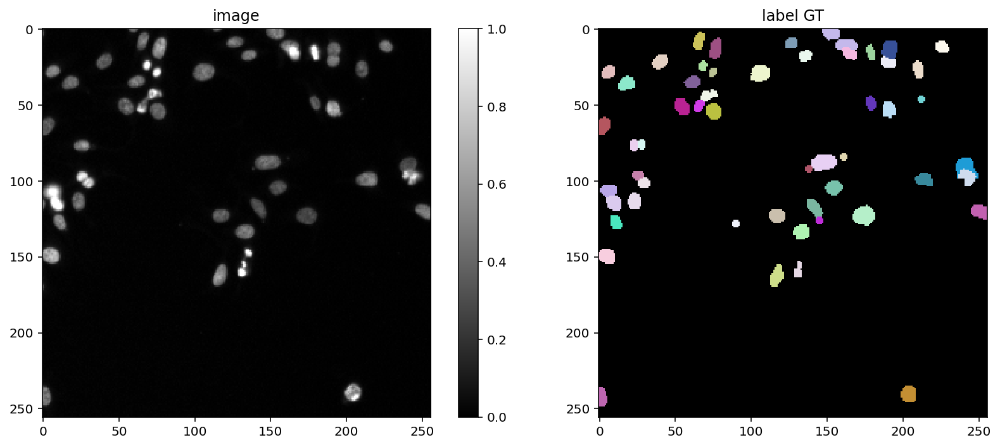

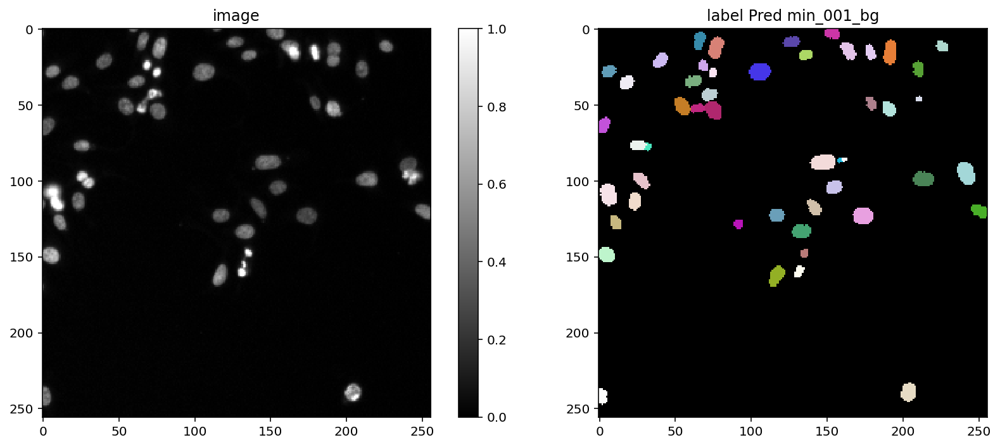

447it [00:04, 106.32it/s]
447it [00:00, 1529.49it/s]


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 10s 142ms/step - loss: 3.1690 - prob_loss: 0.6512 - dist_loss: 12.5888 - prob_kld: 0.4273 - dist_relevant_mae: 12.5887 - dist_relevant_mse: 287.3331 - dist_dist_iou_metric: 0.0341 - val_loss: 2.9957 - val_prob_loss: 0.5730 - val_dist_loss: 12.1135 - val_prob_kld: 0.4908 - val_dist_relevant_mae: 12.1133 - val_dist_relevant_mse: 267.7357 - val_dist_dist_iou_metric: 0.0479 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 101ms/step - loss: 2.2253 - prob_loss: 0.6491 - dist_loss: 7.8809 - prob_kld: 0.4233 - dist_relevant_mae: 7.8802 - dist_relevant_mse: 131.5519 - dist_dist_iou_metric: 0.2626 - val_loss: 1.9099 - val_prob_loss: 0.4782 - val_dist_loss: 7.1587 - val_prob_kld: 0.3960 - val_dist_relevant_mae: 7.1580 - val_dist_relevant_mse: 99.6369 - val_dist_dist_iou_metric: 0.3684 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 5s 97ms/step

Epoch 20/100
56/56 [==============================] - 5s 93ms/step - loss: 1.0559 - prob_loss: 0.4247 - dist_loss: 3.1558 - prob_kld: 0.1775 - dist_relevant_mae: 3.1552 - dist_relevant_mse: 27.3790 - dist_dist_iou_metric: 0.6105 - val_loss: 0.8940 - val_prob_loss: 0.2026 - val_dist_loss: 3.4569 - val_prob_kld: 0.1205 - val_dist_relevant_mae: 3.4562 - val_dist_relevant_mse: 32.1327 - val_dist_dist_iou_metric: 0.6174 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 5s 97ms/step - loss: 0.9947 - prob_loss: 0.4203 - dist_loss: 2.8719 - prob_kld: 0.1266 - dist_relevant_mae: 2.8714 - dist_relevant_mse: 23.3675 - dist_dist_iou_metric: 0.6367 - val_loss: 0.8253 - val_prob_loss: 0.1343 - val_dist_loss: 3.4549 - val_prob_kld: 0.0521 - val_dist_relevant_mae: 3.4545 - val_dist_relevant_mse: 32.1794 - val_dist_dist_iou_metric: 0.6119 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 5s 99ms/step - loss: 1.0325 - prob_loss: 0.4272 - dist_loss: 3.0263 - prob

Epoch 39/100
56/56 [==============================] - 5s 91ms/step - loss: 0.9050 - prob_loss: 0.4143 - dist_loss: 2.4538 - prob_kld: 0.1398 - dist_relevant_mae: 2.4532 - dist_relevant_mse: 17.5453 - dist_dist_iou_metric: 0.6889 - val_loss: 0.7716 - val_prob_loss: 0.1181 - val_dist_loss: 3.2679 - val_prob_kld: 0.0359 - val_dist_relevant_mae: 3.2674 - val_dist_relevant_mse: 29.1164 - val_dist_dist_iou_metric: 0.6605 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 6s 99ms/step - loss: 0.9143 - prob_loss: 0.4183 - dist_loss: 2.4801 - prob_kld: 0.1359 - dist_relevant_mae: 2.4795 - dist_relevant_mse: 17.7590 - dist_dist_iou_metric: 0.6756 - val_loss: 0.7109 - val_prob_loss: 0.1275 - val_dist_loss: 2.9168 - val_prob_kld: 0.0453 - val_dist_relevant_mae: 2.9164 - val_dist_relevant_mse: 25.8219 - val_dist_dist_iou_metric: 0.6645 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 5s 94ms/step - loss: 0.8820 - prob_loss: 0.4167 - dist_loss: 2.3265 - prob

Epoch 58/100
56/56 [==============================] - 5s 96ms/step - loss: 0.8244 - prob_loss: 0.4110 - dist_loss: 2.0673 - prob_kld: 0.1173 - dist_relevant_mae: 2.0668 - dist_relevant_mse: 12.9223 - dist_dist_iou_metric: 0.7230 - val_loss: 0.6467 - val_prob_loss: 0.1279 - val_dist_loss: 2.5941 - val_prob_kld: 0.0457 - val_dist_relevant_mae: 2.5937 - val_dist_relevant_mse: 20.8627 - val_dist_dist_iou_metric: 0.7036 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 5s 93ms/step - loss: 0.8220 - prob_loss: 0.4145 - dist_loss: 2.0375 - prob_kld: 0.1200 - dist_relevant_mae: 2.0370 - dist_relevant_mse: 12.0232 - dist_dist_iou_metric: 0.7194 - val_loss: 0.6732 - val_prob_loss: 0.1159 - val_dist_loss: 2.7863 - val_prob_kld: 0.0338 - val_dist_relevant_mae: 2.7858 - val_dist_relevant_mse: 22.8224 - val_dist_dist_iou_metric: 0.6982 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 5s 96ms/step - loss: 0.8301 - prob_loss: 0.4122 - dist_loss: 2.0895 - prob

Epoch 77/100
56/56 [==============================] - 5s 93ms/step - loss: 0.8124 - prob_loss: 0.4062 - dist_loss: 2.0310 - prob_kld: 0.1195 - dist_relevant_mae: 2.0305 - dist_relevant_mse: 12.4517 - dist_dist_iou_metric: 0.7276 - val_loss: 0.6223 - val_prob_loss: 0.1377 - val_dist_loss: 2.4228 - val_prob_kld: 0.0556 - val_dist_relevant_mae: 2.4224 - val_dist_relevant_mse: 19.9761 - val_dist_dist_iou_metric: 0.7096 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 5s 97ms/step - loss: 0.7783 - prob_loss: 0.4023 - dist_loss: 1.8800 - prob_kld: 0.1314 - dist_relevant_mae: 1.8796 - dist_relevant_mse: 10.5917 - dist_dist_iou_metric: 0.7383 - val_loss: 0.5733 - val_prob_loss: 0.1122 - val_dist_loss: 2.3056 - val_prob_kld: 0.0301 - val_dist_relevant_mae: 2.3052 - val_dist_relevant_mse: 17.1652 - val_dist_dist_iou_metric: 0.7212 - lr: 3.0000e-04
Epoch 79/100
56/56 [==============================] - 5s 93ms/step - loss: 0.7964 - prob_loss: 0.4089 - dist_loss: 1.9376 - prob

Epoch 96/100
56/56 [==============================] - 5s 95ms/step - loss: 0.7585 - prob_loss: 0.4022 - dist_loss: 1.7817 - prob_kld: 0.1230 - dist_relevant_mae: 1.7812 - dist_relevant_mse: 9.8772 - dist_dist_iou_metric: 0.7566 - val_loss: 0.5679 - val_prob_loss: 0.1192 - val_dist_loss: 2.2432 - val_prob_kld: 0.0371 - val_dist_relevant_mae: 2.2428 - val_dist_relevant_mse: 17.1479 - val_dist_dist_iou_metric: 0.7370 - lr: 3.0000e-04
Epoch 97/100
56/56 [==============================] - 5s 94ms/step - loss: 0.7580 - prob_loss: 0.4015 - dist_loss: 1.7824 - prob_kld: 0.1286 - dist_relevant_mae: 1.7819 - dist_relevant_mse: 9.7670 - dist_dist_iou_metric: 0.7480 - val_loss: 0.5668 - val_prob_loss: 0.1207 - val_dist_loss: 2.2301 - val_prob_kld: 0.0386 - val_dist_relevant_mae: 2.2298 - val_dist_relevant_mse: 16.3546 - val_dist_dist_iou_metric: 0.7278 - lr: 3.0000e-04
Epoch 98/100
56/56 [==============================] - 5s 99ms/step - loss: 0.7542 - prob_loss: 0.4061 - dist_loss: 1.7404 - prob_k

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/min_004_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


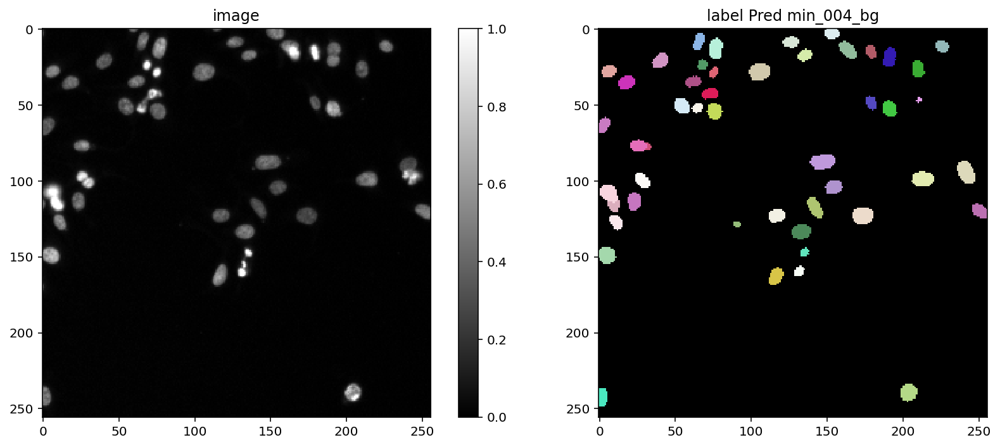

447it [00:04, 94.23it/s] 
447it [00:00, 1340.57it/s]


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 10s 157ms/step - loss: 2.8588 - prob_loss: 0.6482 - dist_loss: 11.0530 - prob_kld: 0.4199 - dist_relevant_mae: 11.0527 - dist_relevant_mse: 229.4433 - dist_dist_iou_metric: 0.0937 - val_loss: 2.1687 - val_prob_loss: 0.3787 - val_dist_loss: 8.9500 - val_prob_kld: 0.2960 - val_dist_relevant_mae: 8.9495 - val_dist_relevant_mse: 166.4139 - val_dist_dist_iou_metric: 0.2075 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 107ms/step - loss: 2.1206 - prob_loss: 0.6347 - dist_loss: 7.4295 - prob_kld: 0.4217 - dist_relevant_mae: 7.4287 - dist_relevant_mse: 114.5747 - dist_dist_iou_metric: 0.3055 - val_loss: 1.9201 - val_prob_loss: 0.4413 - val_dist_loss: 7.3938 - val_prob_kld: 0.3586 - val_dist_relevant_mae: 7.3933 - val_dist_relevant_mse: 119.7186 - val_dist_dist_iou_metric: 0.3002 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 6s 103ms/step

Epoch 20/100
56/56 [==============================] - 6s 105ms/step - loss: 0.9877 - prob_loss: 0.4143 - dist_loss: 2.8670 - prob_kld: 0.1005 - dist_relevant_mae: 2.8665 - dist_relevant_mse: 22.7029 - dist_dist_iou_metric: 0.6454 - val_loss: 0.7281 - val_prob_loss: 0.1193 - val_dist_loss: 3.0436 - val_prob_kld: 0.0366 - val_dist_relevant_mae: 3.0432 - val_dist_relevant_mse: 24.3703 - val_dist_dist_iou_metric: 0.6435 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 5s 99ms/step - loss: 1.0168 - prob_loss: 0.4160 - dist_loss: 3.0039 - prob_kld: 0.1256 - dist_relevant_mae: 3.0033 - dist_relevant_mse: 25.3265 - dist_dist_iou_metric: 0.6321 - val_loss: 0.7202 - val_prob_loss: 0.1146 - val_dist_loss: 3.0276 - val_prob_kld: 0.0319 - val_dist_relevant_mae: 3.0272 - val_dist_relevant_mse: 25.0417 - val_dist_dist_iou_metric: 0.6544 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 6s 103ms/step - loss: 0.9684 - prob_loss: 0.4165 - dist_loss: 2.7598 - pr

Epoch 39/100
56/56 [==============================] - 6s 101ms/step - loss: 0.8430 - prob_loss: 0.4076 - dist_loss: 2.1768 - prob_kld: 0.1036 - dist_relevant_mae: 2.1763 - dist_relevant_mse: 14.5300 - dist_dist_iou_metric: 0.7165 - val_loss: 0.6233 - val_prob_loss: 0.1097 - val_dist_loss: 2.5681 - val_prob_kld: 0.0270 - val_dist_relevant_mae: 2.5677 - val_dist_relevant_mse: 19.2681 - val_dist_dist_iou_metric: 0.7064 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 6s 100ms/step - loss: 0.8549 - prob_loss: 0.4132 - dist_loss: 2.2084 - prob_kld: 0.0974 - dist_relevant_mae: 2.2079 - dist_relevant_mse: 13.9559 - dist_dist_iou_metric: 0.7133 - val_loss: 0.6235 - val_prob_loss: 0.1079 - val_dist_loss: 2.5783 - val_prob_kld: 0.0252 - val_dist_relevant_mae: 2.5779 - val_dist_relevant_mse: 19.8563 - val_dist_dist_iou_metric: 0.6898 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 6s 105ms/step - loss: 0.8451 - prob_loss: 0.4094 - dist_loss: 2.1786 - p

Epoch 58/100
56/56 [==============================] - 6s 104ms/step - loss: 0.7935 - prob_loss: 0.4052 - dist_loss: 1.9416 - prob_kld: 0.0906 - dist_relevant_mae: 1.9412 - dist_relevant_mse: 11.4778 - dist_dist_iou_metric: 0.7436 - val_loss: 0.5433 - val_prob_loss: 0.1072 - val_dist_loss: 2.1806 - val_prob_kld: 0.0245 - val_dist_relevant_mae: 2.1802 - val_dist_relevant_mse: 14.3833 - val_dist_dist_iou_metric: 0.7293 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 6s 103ms/step - loss: 0.8234 - prob_loss: 0.4094 - dist_loss: 2.0698 - prob_kld: 0.1140 - dist_relevant_mae: 2.0693 - dist_relevant_mse: 12.8109 - dist_dist_iou_metric: 0.7272 - val_loss: 0.5677 - val_prob_loss: 0.1147 - val_dist_loss: 2.2651 - val_prob_kld: 0.0320 - val_dist_relevant_mae: 2.2647 - val_dist_relevant_mse: 15.1165 - val_dist_dist_iou_metric: 0.7236 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 6s 103ms/step - loss: 0.7932 - prob_loss: 0.4038 - dist_loss: 1.9468 - p

Epoch 77/100
56/56 [==============================] - 5s 97ms/step - loss: 0.7615 - prob_loss: 0.4020 - dist_loss: 1.7977 - prob_kld: 0.1178 - dist_relevant_mae: 1.7972 - dist_relevant_mse: 9.7943 - dist_dist_iou_metric: 0.7524 - val_loss: 0.5330 - val_prob_loss: 0.1186 - val_dist_loss: 2.0717 - val_prob_kld: 0.0359 - val_dist_relevant_mae: 2.0713 - val_dist_relevant_mse: 12.2083 - val_dist_dist_iou_metric: 0.7561 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 6s 103ms/step - loss: 0.7303 - prob_loss: 0.3995 - dist_loss: 1.6536 - prob_kld: 0.0919 - dist_relevant_mae: 1.6532 - dist_relevant_mse: 8.0969 - dist_dist_iou_metric: 0.7722 - val_loss: 0.5107 - val_prob_loss: 0.1092 - val_dist_loss: 2.0077 - val_prob_kld: 0.0265 - val_dist_relevant_mae: 2.0073 - val_dist_relevant_mse: 12.4475 - val_dist_dist_iou_metric: 0.7498 - lr: 3.0000e-04
Epoch 79/100
56/56 [==============================] - 5s 99ms/step - loss: 0.7712 - prob_loss: 0.4032 - dist_loss: 1.8398 - prob_

Epoch 96/100
56/56 [==============================] - 5s 97ms/step - loss: 0.7647 - prob_loss: 0.4003 - dist_loss: 1.8221 - prob_kld: 0.0882 - dist_relevant_mae: 1.8217 - dist_relevant_mse: 10.0586 - dist_dist_iou_metric: 0.7572 - val_loss: 0.5021 - val_prob_loss: 0.1131 - val_dist_loss: 1.9451 - val_prob_kld: 0.0304 - val_dist_relevant_mae: 1.9448 - val_dist_relevant_mse: 11.6967 - val_dist_dist_iou_metric: 0.7572 - lr: 3.0000e-04
Epoch 97/100
56/56 [==============================] - 6s 103ms/step - loss: 0.7341 - prob_loss: 0.4003 - dist_loss: 1.6693 - prob_kld: 0.0930 - dist_relevant_mae: 1.6689 - dist_relevant_mse: 8.8713 - dist_dist_iou_metric: 0.7678 - val_loss: 0.4772 - val_prob_loss: 0.1079 - val_dist_loss: 1.8464 - val_prob_kld: 0.0252 - val_dist_relevant_mae: 1.8461 - val_dist_relevant_mse: 10.5139 - val_dist_dist_iou_metric: 0.7696 - lr: 3.0000e-04
Epoch 98/100
56/56 [==============================] - 6s 102ms/step - loss: 0.7275 - prob_loss: 0.3948 - dist_loss: 1.6632 - pro

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/min_016_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [00:14<00:00,  3.55it/s]


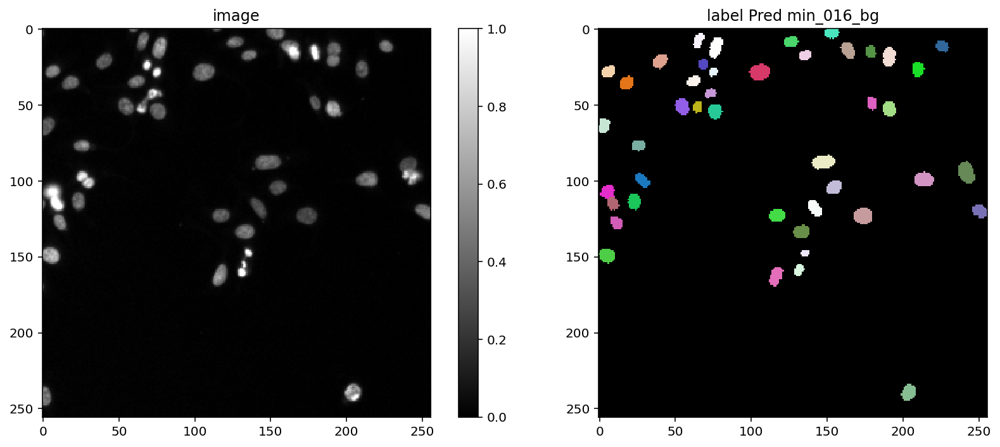

447it [00:04, 90.61it/s] 
447it [00:00, 1268.85it/s]


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 11s 149ms/step - loss: 2.7839 - prob_loss: 0.6277 - dist_loss: 10.7812 - prob_kld: 0.3958 - dist_relevant_mae: 10.7808 - dist_relevant_mse: 217.4766 - dist_dist_iou_metric: 0.1175 - val_loss: 2.1853 - val_prob_loss: 0.5126 - val_dist_loss: 8.3639 - val_prob_kld: 0.4331 - val_dist_relevant_mae: 8.3634 - val_dist_relevant_mse: 152.3394 - val_dist_dist_iou_metric: 0.2467 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 104ms/step - loss: 2.0145 - prob_loss: 0.5524 - dist_loss: 7.3109 - prob_kld: 0.2682 - dist_relevant_mae: 7.3101 - dist_relevant_mse: 110.9685 - dist_dist_iou_metric: 0.3032 - val_loss: 1.6164 - val_prob_loss: 0.2135 - val_dist_loss: 7.0143 - val_prob_kld: 0.1340 - val_dist_relevant_mae: 7.0137 - val_dist_relevant_mse: 112.7609 - val_dist_dist_iou_metric: 0.3261 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 6s 100ms/step

Epoch 20/100
56/56 [==============================] - 6s 100ms/step - loss: 1.0138 - prob_loss: 0.4194 - dist_loss: 2.9721 - prob_kld: 0.0937 - dist_relevant_mae: 2.9715 - dist_relevant_mse: 23.9967 - dist_dist_iou_metric: 0.6301 - val_loss: 0.7458 - val_prob_loss: 0.1336 - val_dist_loss: 3.0609 - val_prob_kld: 0.0541 - val_dist_relevant_mae: 3.0603 - val_dist_relevant_mse: 26.9767 - val_dist_dist_iou_metric: 0.6423 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 5s 95ms/step - loss: 0.9658 - prob_loss: 0.4154 - dist_loss: 2.7516 - prob_kld: 0.1127 - dist_relevant_mae: 2.7510 - dist_relevant_mse: 21.9805 - dist_dist_iou_metric: 0.6506 - val_loss: 0.8088 - val_prob_loss: 0.2149 - val_dist_loss: 2.9693 - val_prob_kld: 0.1354 - val_dist_relevant_mae: 2.9688 - val_dist_relevant_mse: 27.0701 - val_dist_dist_iou_metric: 0.6510 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 6s 105ms/step - loss: 0.9757 - prob_loss: 0.4150 - dist_loss: 2.8031 - pr

Epoch 39/100
56/56 [==============================] - 5s 96ms/step - loss: 0.8429 - prob_loss: 0.4052 - dist_loss: 2.1886 - prob_kld: 0.0876 - dist_relevant_mae: 2.1882 - dist_relevant_mse: 14.2129 - dist_dist_iou_metric: 0.7108 - val_loss: 0.6364 - val_prob_loss: 0.1204 - val_dist_loss: 2.5802 - val_prob_kld: 0.0409 - val_dist_relevant_mae: 2.5798 - val_dist_relevant_mse: 22.0496 - val_dist_dist_iou_metric: 0.6952 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 5s 95ms/step - loss: 0.8559 - prob_loss: 0.4074 - dist_loss: 2.2428 - prob_kld: 0.0913 - dist_relevant_mae: 2.2423 - dist_relevant_mse: 14.7799 - dist_dist_iou_metric: 0.7064 - val_loss: 0.6568 - val_prob_loss: 0.1106 - val_dist_loss: 2.7311 - val_prob_kld: 0.0311 - val_dist_relevant_mae: 2.7306 - val_dist_relevant_mse: 22.1481 - val_dist_dist_iou_metric: 0.7021 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 5s 99ms/step - loss: 0.8467 - prob_loss: 0.4059 - dist_loss: 2.2040 - prob

Epoch 58/100
56/56 [==============================] - 5s 94ms/step - loss: 0.8131 - prob_loss: 0.4171 - dist_loss: 1.9800 - prob_kld: 0.0912 - dist_relevant_mae: 1.9795 - dist_relevant_mse: 12.1004 - dist_dist_iou_metric: 0.7378 - val_loss: 0.5734 - val_prob_loss: 0.1148 - val_dist_loss: 2.2929 - val_prob_kld: 0.0353 - val_dist_relevant_mae: 2.2925 - val_dist_relevant_mse: 17.3437 - val_dist_dist_iou_metric: 0.7373 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 5s 96ms/step - loss: 0.7823 - prob_loss: 0.4024 - dist_loss: 1.8995 - prob_kld: 0.0817 - dist_relevant_mae: 1.8990 - dist_relevant_mse: 10.6198 - dist_dist_iou_metric: 0.7397 - val_loss: 0.5493 - val_prob_loss: 0.1112 - val_dist_loss: 2.1904 - val_prob_kld: 0.0317 - val_dist_relevant_mae: 2.1900 - val_dist_relevant_mse: 15.9934 - val_dist_dist_iou_metric: 0.7202 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 6s 99ms/step - loss: 0.7863 - prob_loss: 0.4014 - dist_loss: 1.9244 - prob

Epoch 77/100
56/56 [==============================] - 6s 100ms/step - loss: 0.7490 - prob_loss: 0.4000 - dist_loss: 1.7447 - prob_kld: 0.0952 - dist_relevant_mae: 1.7442 - dist_relevant_mse: 9.2939 - dist_dist_iou_metric: 0.7594 - val_loss: 0.5283 - val_prob_loss: 0.1378 - val_dist_loss: 1.9527 - val_prob_kld: 0.0583 - val_dist_relevant_mae: 1.9522 - val_dist_relevant_mse: 14.0554 - val_dist_dist_iou_metric: 0.7599 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 5s 99ms/step - loss: 0.7461 - prob_loss: 0.4048 - dist_loss: 1.7065 - prob_kld: 0.0838 - dist_relevant_mae: 1.7061 - dist_relevant_mse: 8.8552 - dist_dist_iou_metric: 0.7644 - val_loss: 0.5140 - val_prob_loss: 0.1067 - val_dist_loss: 2.0367 - val_prob_kld: 0.0272 - val_dist_relevant_mae: 2.0363 - val_dist_relevant_mse: 13.2380 - val_dist_dist_iou_metric: 0.7580 - lr: 3.0000e-04
Epoch 79/100
56/56 [==============================] - 6s 105ms/step - loss: 0.7691 - prob_loss: 0.4049 - dist_loss: 1.8210 - prob

Epoch 96/100
56/56 [==============================] - 6s 100ms/step - loss: 0.7451 - prob_loss: 0.4041 - dist_loss: 1.7048 - prob_kld: 0.1114 - dist_relevant_mae: 1.7044 - dist_relevant_mse: 8.7616 - dist_dist_iou_metric: 0.7654 - val_loss: 0.5421 - val_prob_loss: 0.1258 - val_dist_loss: 2.0817 - val_prob_kld: 0.0463 - val_dist_relevant_mae: 2.0813 - val_dist_relevant_mse: 15.2470 - val_dist_dist_iou_metric: 0.7565 - lr: 3.0000e-04
Epoch 97/100
56/56 [==============================] - 6s 101ms/step - loss: 0.7543 - prob_loss: 0.4001 - dist_loss: 1.7709 - prob_kld: 0.1056 - dist_relevant_mae: 1.7704 - dist_relevant_mse: 10.2342 - dist_dist_iou_metric: 0.7625 - val_loss: 0.4785 - val_prob_loss: 0.1114 - val_dist_loss: 1.8355 - val_prob_kld: 0.0319 - val_dist_relevant_mae: 1.8350 - val_dist_relevant_mse: 12.4858 - val_dist_dist_iou_metric: 0.7722 - lr: 3.0000e-04
Epoch 98/100
56/56 [==============================] - 5s 97ms/step - loss: 0.7234 - prob_loss: 0.3982 - dist_loss: 1.6259 - pro

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/min_064_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [00:14<00:00,  3.57it/s]


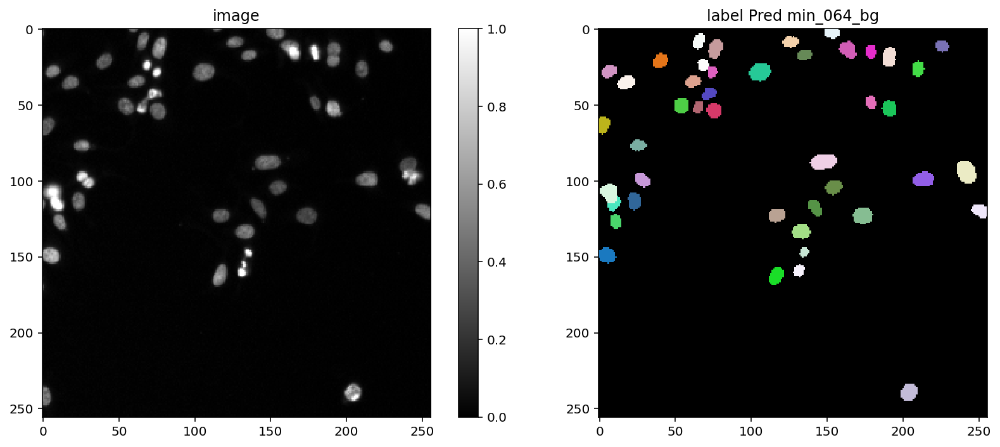

447it [00:05, 85.11it/s] 
447it [00:00, 1207.07it/s]


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 10s 149ms/step - loss: 2.7899 - prob_loss: 0.6597 - dist_loss: 10.6508 - prob_kld: 0.4303 - dist_relevant_mae: 10.6504 - dist_relevant_mse: 211.5492 - dist_dist_iou_metric: 0.1094 - val_loss: 2.3587 - val_prob_loss: 0.3922 - val_dist_loss: 9.8325 - val_prob_kld: 0.3126 - val_dist_relevant_mae: 9.8321 - val_dist_relevant_mse: 198.3052 - val_dist_dist_iou_metric: 0.1523 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 106ms/step - loss: 2.1341 - prob_loss: 0.6422 - dist_loss: 7.4591 - prob_kld: 0.3830 - dist_relevant_mae: 7.4583 - dist_relevant_mse: 116.9821 - dist_dist_iou_metric: 0.2906 - val_loss: 1.8625 - val_prob_loss: 0.4555 - val_dist_loss: 7.0349 - val_prob_kld: 0.3760 - val_dist_relevant_mae: 7.0342 - val_dist_relevant_mse: 107.7475 - val_dist_dist_iou_metric: 0.3372 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 6s 104ms/step

Epoch 20/100
56/56 [==============================] - 5s 95ms/step - loss: 0.9777 - prob_loss: 0.4145 - dist_loss: 2.8164 - prob_kld: 0.0954 - dist_relevant_mae: 2.8159 - dist_relevant_mse: 22.4304 - dist_dist_iou_metric: 0.6501 - val_loss: 0.7830 - val_prob_loss: 0.1536 - val_dist_loss: 3.1470 - val_prob_kld: 0.0740 - val_dist_relevant_mae: 3.1464 - val_dist_relevant_mse: 27.3468 - val_dist_dist_iou_metric: 0.6229 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 5s 96ms/step - loss: 0.9513 - prob_loss: 0.4138 - dist_loss: 2.6878 - prob_kld: 0.1059 - dist_relevant_mae: 2.6873 - dist_relevant_mse: 20.4722 - dist_dist_iou_metric: 0.6565 - val_loss: 0.7340 - val_prob_loss: 0.1296 - val_dist_loss: 3.0220 - val_prob_kld: 0.0501 - val_dist_relevant_mae: 3.0215 - val_dist_relevant_mse: 24.0153 - val_dist_dist_iou_metric: 0.6607 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 5s 96ms/step - loss: 0.9716 - prob_loss: 0.4174 - dist_loss: 2.7708 - prob

Epoch 39/100
56/56 [==============================] - 6s 99ms/step - loss: 0.8363 - prob_loss: 0.4058 - dist_loss: 2.1526 - prob_kld: 0.0821 - dist_relevant_mae: 2.1521 - dist_relevant_mse: 14.0336 - dist_dist_iou_metric: 0.7191 - val_loss: 0.5918 - val_prob_loss: 0.1213 - val_dist_loss: 2.3523 - val_prob_kld: 0.0418 - val_dist_relevant_mae: 2.3519 - val_dist_relevant_mse: 17.6103 - val_dist_dist_iou_metric: 0.7119 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 6s 105ms/step - loss: 0.8222 - prob_loss: 0.4046 - dist_loss: 2.0880 - prob_kld: 0.0830 - dist_relevant_mae: 2.0876 - dist_relevant_mse: 12.6513 - dist_dist_iou_metric: 0.7173 - val_loss: 0.5734 - val_prob_loss: 0.1073 - val_dist_loss: 2.3305 - val_prob_kld: 0.0278 - val_dist_relevant_mae: 2.3301 - val_dist_relevant_mse: 16.4591 - val_dist_dist_iou_metric: 0.7227 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 5s 97ms/step - loss: 0.8501 - prob_loss: 0.4051 - dist_loss: 2.2249 - pro

Epoch 58/100
56/56 [==============================] - 6s 103ms/step - loss: 0.7697 - prob_loss: 0.4004 - dist_loss: 1.8466 - prob_kld: 0.0744 - dist_relevant_mae: 1.8462 - dist_relevant_mse: 10.2943 - dist_dist_iou_metric: 0.7491 - val_loss: 0.5073 - val_prob_loss: 0.1086 - val_dist_loss: 1.9935 - val_prob_kld: 0.0291 - val_dist_relevant_mae: 1.9931 - val_dist_relevant_mse: 13.1360 - val_dist_dist_iou_metric: 0.7485 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 5s 98ms/step - loss: 0.7534 - prob_loss: 0.3968 - dist_loss: 1.7830 - prob_kld: 0.0798 - dist_relevant_mae: 1.7826 - dist_relevant_mse: 9.7127 - dist_dist_iou_metric: 0.7489 - val_loss: 0.5493 - val_prob_loss: 0.1061 - val_dist_loss: 2.2157 - val_prob_kld: 0.0266 - val_dist_relevant_mae: 2.2153 - val_dist_relevant_mse: 13.7486 - val_dist_dist_iou_metric: 0.7410 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 5s 97ms/step - loss: 0.7728 - prob_loss: 0.4012 - dist_loss: 1.8582 - prob

Epoch 77/100
56/56 [==============================] - 6s 100ms/step - loss: 0.7519 - prob_loss: 0.3999 - dist_loss: 1.7602 - prob_kld: 0.0775 - dist_relevant_mae: 1.7598 - dist_relevant_mse: 9.0349 - dist_dist_iou_metric: 0.7630 - val_loss: 0.4806 - val_prob_loss: 0.1006 - val_dist_loss: 1.8998 - val_prob_kld: 0.0211 - val_dist_relevant_mae: 1.8995 - val_dist_relevant_mse: 11.3275 - val_dist_dist_iou_metric: 0.7622 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 6s 102ms/step - loss: 0.7856 - prob_loss: 0.4020 - dist_loss: 1.9179 - prob_kld: 0.0783 - dist_relevant_mae: 1.9174 - dist_relevant_mse: 10.9315 - dist_dist_iou_metric: 0.7500 - val_loss: 0.5164 - val_prob_loss: 0.1102 - val_dist_loss: 2.0311 - val_prob_kld: 0.0306 - val_dist_relevant_mae: 2.0307 - val_dist_relevant_mse: 12.9117 - val_dist_dist_iou_metric: 0.7528 - lr: 3.0000e-04
Epoch 79/100
56/56 [==============================] - 6s 100ms/step - loss: 0.7410 - prob_loss: 0.4006 - dist_loss: 1.7019 - pr

Epoch 96/100
56/56 [==============================] - 6s 100ms/step - loss: 0.7304 - prob_loss: 0.3970 - dist_loss: 1.6670 - prob_kld: 0.0968 - dist_relevant_mae: 1.6666 - dist_relevant_mse: 9.0014 - dist_dist_iou_metric: 0.7759 - val_loss: 0.5084 - val_prob_loss: 0.1225 - val_dist_loss: 1.9294 - val_prob_kld: 0.0429 - val_dist_relevant_mae: 1.9290 - val_dist_relevant_mse: 11.7685 - val_dist_dist_iou_metric: 0.7682 - lr: 3.0000e-04
Epoch 97/100
56/56 [==============================] - 6s 100ms/step - loss: 0.7480 - prob_loss: 0.3985 - dist_loss: 1.7476 - prob_kld: 0.0850 - dist_relevant_mae: 1.7472 - dist_relevant_mse: 9.0202 - dist_dist_iou_metric: 0.7674 - val_loss: 0.4714 - val_prob_loss: 0.1082 - val_dist_loss: 1.8160 - val_prob_kld: 0.0287 - val_dist_relevant_mae: 1.8156 - val_dist_relevant_mse: 11.4389 - val_dist_dist_iou_metric: 0.7673 - lr: 3.0000e-04
Epoch 98/100
56/56 [==============================] - 5s 99ms/step - loss: 0.7285 - prob_loss: 0.3948 - dist_loss: 1.6681 - prob

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/min_256_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [00:13<00:00,  3.73it/s]


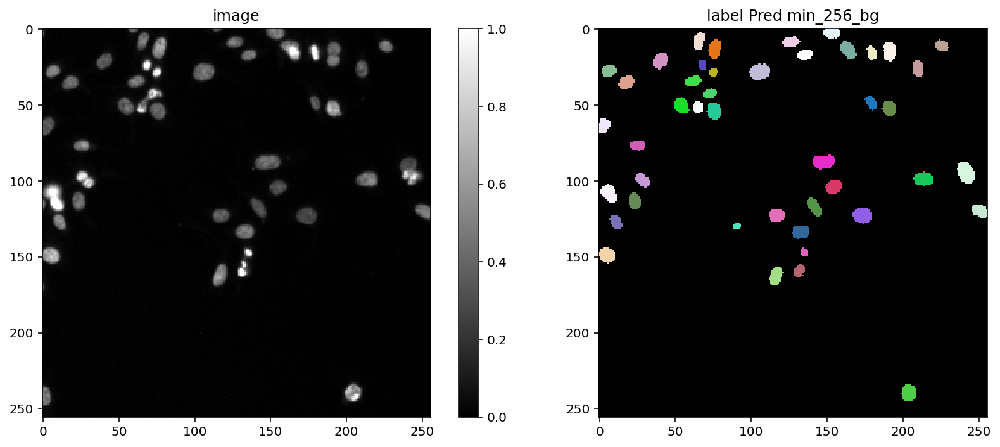

Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 11s 152ms/step - loss: 2.5323 - prob_loss: 0.3941 - dist_loss: 10.6911 - prob_kld: 0.3185 - dist_relevant_mae: 10.6907 - dist_relevant_mse: 215.6446 - dist_dist_iou_metric: 0.1319 - val_loss: 2.2664 - val_prob_loss: 0.3597 - val_dist_loss: 9.5336 - val_prob_kld: 0.2804 - val_dist_relevant_mae: 9.5333 - val_dist_relevant_mse: 189.3154 - val_dist_dist_iou_metric: 0.1370 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 108ms/step - loss: 1.7808 - prob_loss: 0.2962 - dist_loss: 7.4229 - prob_kld: 0.2207 - dist_relevant_mae: 7.4221 - dist_relevant_mse: 115.2249 - dist_dist_iou_metric: 0.3152 - val_loss: 1.5960 - val_prob_loss: 0.2942 - val_dist_loss: 6.5091 - val_prob_kld: 0.2150 - val_dist_relevant_mae: 6.5083 - val_dist_relevant_mse: 93.3136 - val_dist_dist_iou_metric: 0.3647 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 6s 116ms/step 

Epoch 20/100
56/56 [==============================] - 6s 109ms/step - loss: 0.6071 - prob_loss: 0.0951 - dist_loss: 2.5600 - prob_kld: 0.0190 - dist_relevant_mae: 2.5594 - dist_relevant_mse: 18.6004 - dist_dist_iou_metric: 0.6765 - val_loss: 0.6244 - val_prob_loss: 0.0968 - val_dist_loss: 2.6379 - val_prob_kld: 0.0175 - val_dist_relevant_mae: 2.6373 - val_dist_relevant_mse: 20.1356 - val_dist_dist_iou_metric: 0.6827 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 6s 106ms/step - loss: 0.6167 - prob_loss: 0.0945 - dist_loss: 2.6110 - prob_kld: 0.0192 - dist_relevant_mae: 2.6104 - dist_relevant_mse: 20.4778 - dist_dist_iou_metric: 0.6764 - val_loss: 0.6566 - val_prob_loss: 0.1018 - val_dist_loss: 2.7738 - val_prob_kld: 0.0225 - val_dist_relevant_mae: 2.7732 - val_dist_relevant_mse: 22.6477 - val_dist_dist_iou_metric: 0.6553 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 6s 104ms/step - loss: 0.6267 - prob_loss: 0.0981 - dist_loss: 2.6429 - p

Epoch 39/100
56/56 [==============================] - 6s 101ms/step - loss: 0.5066 - prob_loss: 0.0938 - dist_loss: 2.0645 - prob_kld: 0.0188 - dist_relevant_mae: 2.0639 - dist_relevant_mse: 12.7238 - dist_dist_iou_metric: 0.7315 - val_loss: 0.5067 - val_prob_loss: 0.0980 - val_dist_loss: 2.0435 - val_prob_kld: 0.0187 - val_dist_relevant_mae: 2.0430 - val_dist_relevant_mse: 13.0787 - val_dist_dist_iou_metric: 0.7375 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 6s 104ms/step - loss: 0.5120 - prob_loss: 0.0957 - dist_loss: 2.0813 - prob_kld: 0.0167 - dist_relevant_mae: 2.0808 - dist_relevant_mse: 12.9516 - dist_dist_iou_metric: 0.7348 - val_loss: 0.5030 - val_prob_loss: 0.0939 - val_dist_loss: 2.0453 - val_prob_kld: 0.0147 - val_dist_relevant_mae: 2.0448 - val_dist_relevant_mse: 12.6320 - val_dist_dist_iou_metric: 0.7383 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 6s 108ms/step - loss: 0.4962 - prob_loss: 0.0963 - dist_loss: 1.9999 - p

Epoch 58/100
56/56 [==============================] - 6s 101ms/step - loss: 0.4492 - prob_loss: 0.0915 - dist_loss: 1.7882 - prob_kld: 0.0147 - dist_relevant_mae: 1.7877 - dist_relevant_mse: 9.8770 - dist_dist_iou_metric: 0.7656 - val_loss: 0.4801 - val_prob_loss: 0.0937 - val_dist_loss: 1.9321 - val_prob_kld: 0.0145 - val_dist_relevant_mae: 1.9316 - val_dist_relevant_mse: 10.0201 - val_dist_dist_iou_metric: 0.7601 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 6s 105ms/step - loss: 0.4498 - prob_loss: 0.0929 - dist_loss: 1.7845 - prob_kld: 0.0173 - dist_relevant_mae: 1.7841 - dist_relevant_mse: 9.5241 - dist_dist_iou_metric: 0.7609 - val_loss: 0.4362 - val_prob_loss: 0.0928 - val_dist_loss: 1.7171 - val_prob_kld: 0.0135 - val_dist_relevant_mae: 1.7167 - val_dist_relevant_mse: 8.9213 - val_dist_dist_iou_metric: 0.7648 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 6s 102ms/step - loss: 0.4817 - prob_loss: 0.0909 - dist_loss: 1.9539 - prob

Epoch 77/100
56/56 [==============================] - 6s 102ms/step - loss: 0.4382 - prob_loss: 0.0894 - dist_loss: 1.7444 - prob_kld: 0.0153 - dist_relevant_mae: 1.7440 - dist_relevant_mse: 9.1480 - dist_dist_iou_metric: 0.7656 - val_loss: 0.4444 - val_prob_loss: 0.0934 - val_dist_loss: 1.7547 - val_prob_kld: 0.0142 - val_dist_relevant_mae: 1.7543 - val_dist_relevant_mse: 8.6259 - val_dist_dist_iou_metric: 0.7687 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 6s 106ms/step - loss: 0.4287 - prob_loss: 0.0944 - dist_loss: 1.6718 - prob_kld: 0.0159 - dist_relevant_mae: 1.6714 - dist_relevant_mse: 8.6924 - dist_dist_iou_metric: 0.7805 - val_loss: 0.4028 - val_prob_loss: 0.0928 - val_dist_loss: 1.5500 - val_prob_kld: 0.0135 - val_dist_relevant_mae: 1.5496 - val_dist_relevant_mse: 7.3083 - val_dist_dist_iou_metric: 0.7910 - lr: 3.0000e-04
Epoch 79/100
56/56 [==============================] - 6s 100ms/step - loss: 0.4355 - prob_loss: 0.0873 - dist_loss: 1.7408 - prob_

Epoch 96/100
56/56 [==============================] - 6s 103ms/step - loss: 0.4041 - prob_loss: 0.0901 - dist_loss: 1.5699 - prob_kld: 0.0137 - dist_relevant_mae: 1.5694 - dist_relevant_mse: 7.5636 - dist_dist_iou_metric: 0.7887 - val_loss: 0.3989 - val_prob_loss: 0.0920 - val_dist_loss: 1.5347 - val_prob_kld: 0.0127 - val_dist_relevant_mae: 1.5342 - val_dist_relevant_mse: 7.2339 - val_dist_dist_iou_metric: 0.7931 - lr: 3.0000e-04
Epoch 97/100
56/56 [==============================] - 6s 103ms/step - loss: 0.4062 - prob_loss: 0.0915 - dist_loss: 1.5737 - prob_kld: 0.0138 - dist_relevant_mae: 1.5733 - dist_relevant_mse: 7.6084 - dist_dist_iou_metric: 0.7864 - val_loss: 0.4022 - val_prob_loss: 0.0922 - val_dist_loss: 1.5498 - val_prob_kld: 0.0129 - val_dist_relevant_mae: 1.5494 - val_dist_relevant_mse: 7.1596 - val_dist_dist_iou_metric: 0.7914 - lr: 3.0000e-04
Epoch 98/100
56/56 [==============================] - 6s 99ms/step - loss: 0.3998 - prob_loss: 0.0872 - dist_loss: 1.5631 - prob_k

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/min_full_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [00:10<00:00,  4.57it/s]


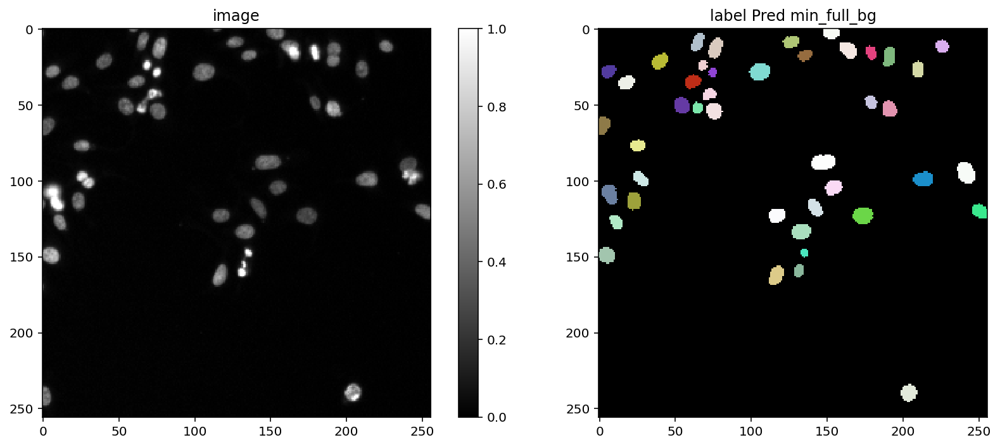

447it [00:04, 99.86it/s] 
447it [00:00, 1639.97it/s]


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 11s 142ms/step - loss: 3.3163 - prob_loss: 0.6391 - dist_loss: 13.3856 - prob_kld: 0.4416 - dist_relevant_mae: 13.3854 - dist_relevant_mse: 325.0820 - dist_dist_iou_metric: 0.0443 - val_loss: 2.7337 - val_prob_loss: 0.6899 - val_dist_loss: 10.2192 - val_prob_kld: 0.6053 - val_dist_relevant_mae: 10.2187 - val_dist_relevant_mse: 207.7510 - val_dist_dist_iou_metric: 0.1653 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 5s 99ms/step - loss: 2.3733 - prob_loss: 0.6457 - dist_loss: 8.6379 - prob_kld: 0.4583 - dist_relevant_mae: 8.6372 - dist_relevant_mse: 159.3566 - dist_dist_iou_metric: 0.2582 - val_loss: 1.9595 - val_prob_loss: 0.4552 - val_dist_loss: 7.5216 - val_prob_kld: 0.3707 - val_dist_relevant_mae: 7.5210 - val_dist_relevant_mse: 123.7892 - val_dist_dist_iou_metric: 0.2845 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 5s 95ms/step

Epoch 20/100
56/56 [==============================] - 5s 92ms/step - loss: 1.0579 - prob_loss: 0.4236 - dist_loss: 3.1715 - prob_kld: 0.2433 - dist_relevant_mae: 3.1704 - dist_relevant_mse: 28.9606 - dist_dist_iou_metric: 0.6152 - val_loss: 0.9728 - val_prob_loss: 0.2231 - val_dist_loss: 3.7487 - val_prob_kld: 0.1386 - val_dist_relevant_mae: 3.7476 - val_dist_relevant_mse: 31.3723 - val_dist_dist_iou_metric: 0.6089 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 5s 99ms/step - loss: 1.0743 - prob_loss: 0.4200 - dist_loss: 3.2716 - prob_kld: 0.2049 - dist_relevant_mae: 3.2704 - dist_relevant_mse: 29.0042 - dist_dist_iou_metric: 0.6195 - val_loss: 0.8357 - val_prob_loss: 0.1541 - val_dist_loss: 3.4079 - val_prob_kld: 0.0696 - val_dist_relevant_mae: 3.4070 - val_dist_relevant_mse: 28.3901 - val_dist_dist_iou_metric: 0.6202 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 5s 94ms/step - loss: 1.0804 - prob_loss: 0.4171 - dist_loss: 3.3166 - prob

Epoch 39/100
56/56 [==============================] - 5s 93ms/step - loss: 0.9607 - prob_loss: 0.4117 - dist_loss: 2.7452 - prob_kld: 0.1146 - dist_relevant_mae: 2.7442 - dist_relevant_mse: 22.3173 - dist_dist_iou_metric: 0.6764 - val_loss: 0.7503 - val_prob_loss: 0.1205 - val_dist_loss: 3.1489 - val_prob_kld: 0.0360 - val_dist_relevant_mae: 3.1480 - val_dist_relevant_mse: 26.0083 - val_dist_dist_iou_metric: 0.6455 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 5s 97ms/step - loss: 0.9626 - prob_loss: 0.4119 - dist_loss: 2.7538 - prob_kld: 0.1049 - dist_relevant_mae: 2.7529 - dist_relevant_mse: 22.1033 - dist_dist_iou_metric: 0.6698 - val_loss: 0.7188 - val_prob_loss: 0.1224 - val_dist_loss: 2.9822 - val_prob_kld: 0.0378 - val_dist_relevant_mae: 2.9814 - val_dist_relevant_mse: 23.9793 - val_dist_dist_iou_metric: 0.6445 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 5s 96ms/step - loss: 0.9866 - prob_loss: 0.4137 - dist_loss: 2.8646 - prob

Epoch 58/100
56/56 [==============================] - 5s 94ms/step - loss: 0.9090 - prob_loss: 0.4057 - dist_loss: 2.5164 - prob_kld: 0.0921 - dist_relevant_mae: 2.5154 - dist_relevant_mse: 19.0907 - dist_dist_iou_metric: 0.6970 - val_loss: 0.7778 - val_prob_loss: 0.1216 - val_dist_loss: 3.2813 - val_prob_kld: 0.0370 - val_dist_relevant_mae: 3.2801 - val_dist_relevant_mse: 23.2419 - val_dist_dist_iou_metric: 0.6582 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 5s 93ms/step - loss: 0.9235 - prob_loss: 0.4065 - dist_loss: 2.5850 - prob_kld: 0.0895 - dist_relevant_mae: 2.5840 - dist_relevant_mse: 18.9314 - dist_dist_iou_metric: 0.6895 - val_loss: 0.7366 - val_prob_loss: 0.1164 - val_dist_loss: 3.1012 - val_prob_kld: 0.0318 - val_dist_relevant_mae: 3.1002 - val_dist_relevant_mse: 26.1684 - val_dist_dist_iou_metric: 0.6491 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 5s 93ms/step - loss: 0.9198 - prob_loss: 0.4140 - dist_loss: 2.5289 - prob

Epoch 77/100
56/56 [==============================] - 5s 96ms/step - loss: 0.8540 - prob_loss: 0.4046 - dist_loss: 2.2466 - prob_kld: 0.1223 - dist_relevant_mae: 2.2454 - dist_relevant_mse: 15.6752 - dist_dist_iou_metric: 0.7144 - val_loss: 0.6138 - val_prob_loss: 0.1085 - val_dist_loss: 2.5264 - val_prob_kld: 0.0240 - val_dist_relevant_mae: 2.5253 - val_dist_relevant_mse: 18.1527 - val_dist_dist_iou_metric: 0.6994 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 5s 92ms/step - loss: 0.9096 - prob_loss: 0.4151 - dist_loss: 2.4726 - prob_kld: 0.0924 - dist_relevant_mae: 2.4717 - dist_relevant_mse: 18.1318 - dist_dist_iou_metric: 0.7046 - val_loss: 0.7255 - val_prob_loss: 0.1155 - val_dist_loss: 3.0499 - val_prob_kld: 0.0310 - val_dist_relevant_mae: 3.0490 - val_dist_relevant_mse: 24.7591 - val_dist_dist_iou_metric: 0.6587 - lr: 3.0000e-04
Epoch 79/100
56/56 [==============================] - 5s 94ms/step - loss: 0.8576 - prob_loss: 0.4014 - dist_loss: 2.2807 - prob

Epoch 96/100
56/56 [==============================] - 6s 102ms/step - loss: 0.7959 - prob_loss: 0.3975 - dist_loss: 1.9919 - prob_kld: 0.1019 - dist_relevant_mae: 1.9908 - dist_relevant_mse: 12.7266 - dist_dist_iou_metric: 0.7315 - val_loss: 0.5801 - val_prob_loss: 0.1051 - val_dist_loss: 2.3747 - val_prob_kld: 0.0206 - val_dist_relevant_mae: 2.3737 - val_dist_relevant_mse: 16.6307 - val_dist_dist_iou_metric: 0.7178 - lr: 3.0000e-04
Epoch 97/100
56/56 [==============================] - 5s 94ms/step - loss: 0.8129 - prob_loss: 0.3972 - dist_loss: 2.0784 - prob_kld: 0.0920 - dist_relevant_mae: 2.0772 - dist_relevant_mse: 12.4893 - dist_dist_iou_metric: 0.7264 - val_loss: 0.5836 - val_prob_loss: 0.1051 - val_dist_loss: 2.3929 - val_prob_kld: 0.0205 - val_dist_relevant_mae: 2.3919 - val_dist_relevant_mse: 17.2346 - val_dist_dist_iou_metric: 0.7112 - lr: 3.0000e-04
Epoch 98/100
56/56 [==============================] - 5s 97ms/step - loss: 0.8885 - prob_loss: 0.4062 - dist_loss: 2.4113 - pro

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/max_001_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [00:12<00:00,  3.97it/s]


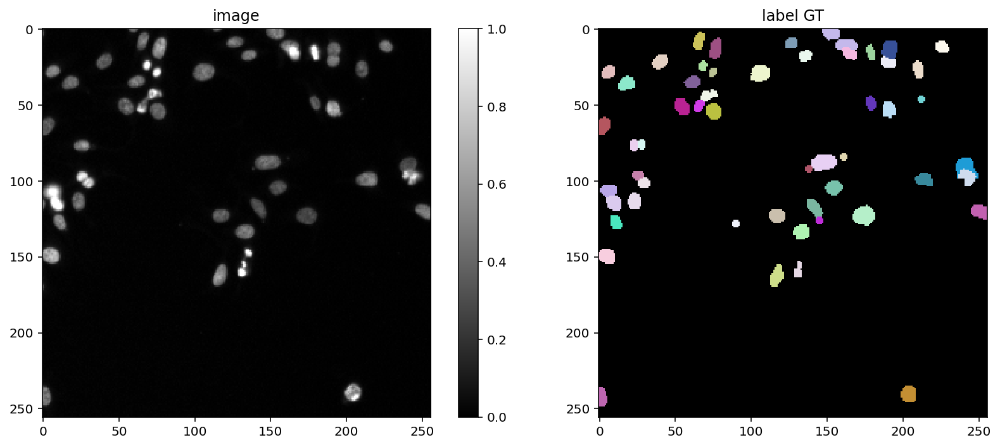

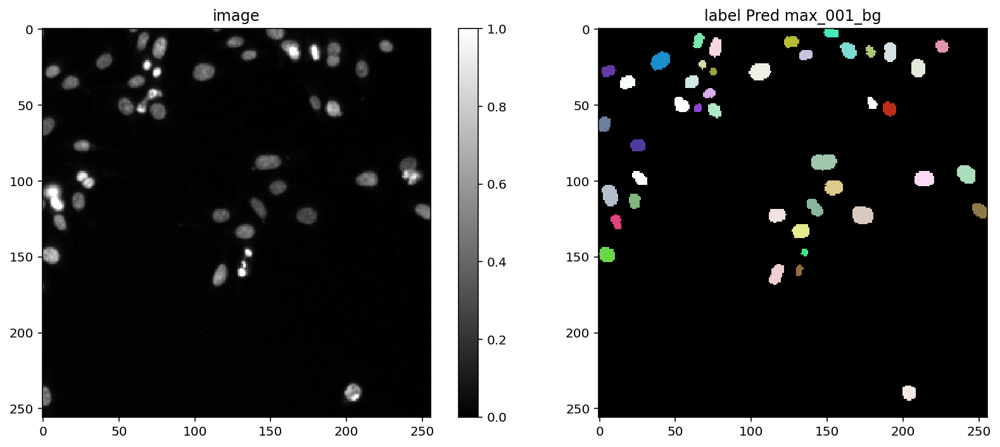

447it [00:04, 106.45it/s]
447it [00:00, 1500.65it/s]


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 10s 145ms/step - loss: 3.1135 - prob_loss: 0.6364 - dist_loss: 12.3859 - prob_kld: 0.4679 - dist_relevant_mae: 12.3856 - dist_relevant_mse: 283.7596 - dist_dist_iou_metric: 0.1042 - val_loss: 2.7357 - val_prob_loss: 0.4581 - val_dist_loss: 11.3879 - val_prob_kld: 0.3775 - val_dist_relevant_mae: 11.3877 - val_dist_relevant_mse: 238.2947 - val_dist_dist_iou_metric: 0.0479 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 103ms/step - loss: 2.3679 - prob_loss: 0.5934 - dist_loss: 8.8724 - prob_kld: 0.3537 - dist_relevant_mae: 8.8719 - dist_relevant_mse: 164.9264 - dist_dist_iou_metric: 0.2596 - val_loss: 1.8858 - val_prob_loss: 0.3882 - val_dist_loss: 7.4879 - val_prob_kld: 0.3076 - val_dist_relevant_mae: 7.4875 - val_dist_relevant_mse: 123.6690 - val_dist_dist_iou_metric: 0.2537 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 6s 100ms/st

Epoch 20/100
56/56 [==============================] - 6s 113ms/step - loss: 1.1004 - prob_loss: 0.4149 - dist_loss: 3.4277 - prob_kld: 0.1028 - dist_relevant_mae: 3.4265 - dist_relevant_mse: 30.8785 - dist_dist_iou_metric: 0.6272 - val_loss: 0.7488 - val_prob_loss: 0.1067 - val_dist_loss: 3.2106 - val_prob_kld: 0.0261 - val_dist_relevant_mae: 3.2095 - val_dist_relevant_mse: 24.9657 - val_dist_dist_iou_metric: 0.6332 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 6s 104ms/step - loss: 1.0117 - prob_loss: 0.4105 - dist_loss: 3.0061 - prob_kld: 0.0855 - dist_relevant_mae: 3.0050 - dist_relevant_mse: 25.2838 - dist_dist_iou_metric: 0.6562 - val_loss: 0.7736 - val_prob_loss: 0.1127 - val_dist_loss: 3.3047 - val_prob_kld: 0.0320 - val_dist_relevant_mae: 3.3036 - val_dist_relevant_mse: 26.6479 - val_dist_dist_iou_metric: 0.6248 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 6s 107ms/step - loss: 1.0890 - prob_loss: 0.4266 - dist_loss: 3.3117 - p

Epoch 39/100
56/56 [==============================] - 6s 100ms/step - loss: 0.9046 - prob_loss: 0.4061 - dist_loss: 2.4924 - prob_kld: 0.0796 - dist_relevant_mae: 2.4915 - dist_relevant_mse: 17.9600 - dist_dist_iou_metric: 0.7040 - val_loss: 0.6262 - val_prob_loss: 0.1057 - val_dist_loss: 2.6026 - val_prob_kld: 0.0251 - val_dist_relevant_mae: 2.6018 - val_dist_relevant_mse: 19.0199 - val_dist_dist_iou_metric: 0.6839 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 5s 94ms/step - loss: 0.9122 - prob_loss: 0.4068 - dist_loss: 2.5272 - prob_kld: 0.0844 - dist_relevant_mae: 2.5262 - dist_relevant_mse: 19.9587 - dist_dist_iou_metric: 0.7013 - val_loss: 0.6676 - val_prob_loss: 0.1238 - val_dist_loss: 2.7190 - val_prob_kld: 0.0431 - val_dist_relevant_mae: 2.7179 - val_dist_relevant_mse: 20.6035 - val_dist_dist_iou_metric: 0.6774 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 5s 94ms/step - loss: 0.8699 - prob_loss: 0.4101 - dist_loss: 2.2989 - pro

Epoch 58/100
56/56 [==============================] - 6s 104ms/step - loss: 0.8290 - prob_loss: 0.4015 - dist_loss: 2.1377 - prob_kld: 0.0880 - dist_relevant_mae: 2.1366 - dist_relevant_mse: 13.7024 - dist_dist_iou_metric: 0.7375 - val_loss: 0.5743 - val_prob_loss: 0.1040 - val_dist_loss: 2.3514 - val_prob_kld: 0.0234 - val_dist_relevant_mae: 2.3504 - val_dist_relevant_mse: 16.2584 - val_dist_dist_iou_metric: 0.7105 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 6s 102ms/step - loss: 0.8323 - prob_loss: 0.4041 - dist_loss: 2.1411 - prob_kld: 0.1065 - dist_relevant_mae: 2.1401 - dist_relevant_mse: 13.9179 - dist_dist_iou_metric: 0.7369 - val_loss: 0.5786 - val_prob_loss: 0.1104 - val_dist_loss: 2.3413 - val_prob_kld: 0.0297 - val_dist_relevant_mae: 2.3403 - val_dist_relevant_mse: 16.0431 - val_dist_dist_iou_metric: 0.7111 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 6s 102ms/step - loss: 0.8376 - prob_loss: 0.4086 - dist_loss: 2.1447 - p

Epoch 77/100
56/56 [==============================] - 6s 106ms/step - loss: 0.8053 - prob_loss: 0.4065 - dist_loss: 1.9943 - prob_kld: 0.1462 - dist_relevant_mae: 1.9932 - dist_relevant_mse: 11.5412 - dist_dist_iou_metric: 0.7560 - val_loss: 0.5328 - val_prob_loss: 0.0968 - val_dist_loss: 2.1798 - val_prob_kld: 0.0162 - val_dist_relevant_mae: 2.1789 - val_dist_relevant_mse: 13.3563 - val_dist_dist_iou_metric: 0.7372 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 6s 100ms/step - loss: 0.7949 - prob_loss: 0.4087 - dist_loss: 1.9312 - prob_kld: 0.0935 - dist_relevant_mae: 1.9303 - dist_relevant_mse: 11.6420 - dist_dist_iou_metric: 0.7583 - val_loss: 0.5801 - val_prob_loss: 0.0974 - val_dist_loss: 2.4135 - val_prob_kld: 0.0168 - val_dist_relevant_mae: 2.4126 - val_dist_relevant_mse: 16.8908 - val_dist_dist_iou_metric: 0.7216 - lr: 3.0000e-04
Epoch 79/100
56/56 [==============================] - 6s 105ms/step - loss: 0.7898 - prob_loss: 0.4010 - dist_loss: 1.9439 - p

Epoch 96/100
56/56 [==============================] - 5s 93ms/step - loss: 0.7703 - prob_loss: 0.4012 - dist_loss: 1.8454 - prob_kld: 0.0805 - dist_relevant_mae: 1.8446 - dist_relevant_mse: 10.4256 - dist_dist_iou_metric: 0.7667 - val_loss: 0.5145 - val_prob_loss: 0.1108 - val_dist_loss: 2.0187 - val_prob_kld: 0.0302 - val_dist_relevant_mae: 2.0180 - val_dist_relevant_mse: 13.0805 - val_dist_dist_iou_metric: 0.7383 - lr: 3.0000e-04
Epoch 97/100
56/56 [==============================] - 5s 91ms/step - loss: 0.7505 - prob_loss: 0.3958 - dist_loss: 1.7733 - prob_kld: 0.0846 - dist_relevant_mae: 1.7725 - dist_relevant_mse: 9.2480 - dist_dist_iou_metric: 0.7703 - val_loss: 0.5090 - val_prob_loss: 0.1048 - val_dist_loss: 2.0207 - val_prob_kld: 0.0242 - val_dist_relevant_mae: 2.0199 - val_dist_relevant_mse: 12.8846 - val_dist_dist_iou_metric: 0.7446 - lr: 3.0000e-04
Epoch 98/100
56/56 [==============================] - 5s 96ms/step - loss: 0.7638 - prob_loss: 0.4002 - dist_loss: 1.8177 - prob_

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/max_004_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [00:15<00:00,  3.21it/s]


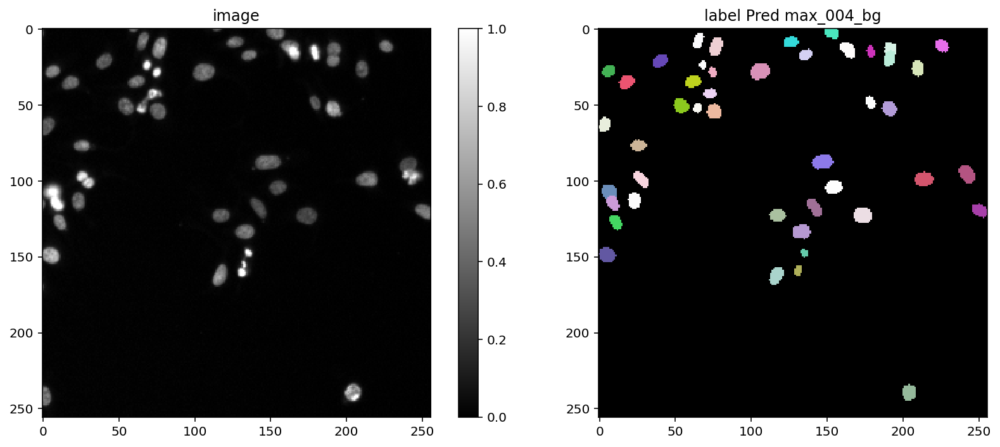

447it [00:04, 95.02it/s] 
447it [00:00, 1284.07it/s]


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 10s 152ms/step - loss: 3.0495 - prob_loss: 0.6458 - dist_loss: 12.0183 - prob_kld: 0.4173 - dist_relevant_mae: 12.0180 - dist_relevant_mse: 264.6859 - dist_dist_iou_metric: 0.0964 - val_loss: 2.2105 - val_prob_loss: 0.4577 - val_dist_loss: 8.7645 - val_prob_kld: 0.3768 - val_dist_relevant_mae: 8.7640 - val_dist_relevant_mse: 163.8556 - val_dist_dist_iou_metric: 0.2088 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 108ms/step - loss: 2.2803 - prob_loss: 0.6421 - dist_loss: 8.1908 - prob_kld: 0.4138 - dist_relevant_mae: 8.1902 - dist_relevant_mse: 137.2684 - dist_dist_iou_metric: 0.2669 - val_loss: 1.8553 - val_prob_loss: 0.4365 - val_dist_loss: 7.0937 - val_prob_kld: 0.3557 - val_dist_relevant_mae: 7.0931 - val_dist_relevant_mse: 112.8360 - val_dist_dist_iou_metric: 0.3122 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 6s 105ms/step

Epoch 20/100
56/56 [==============================] - 6s 101ms/step - loss: 1.0117 - prob_loss: 0.4111 - dist_loss: 3.0029 - prob_kld: 0.0707 - dist_relevant_mae: 3.0022 - dist_relevant_mse: 25.0099 - dist_dist_iou_metric: 0.6503 - val_loss: 0.7093 - val_prob_loss: 0.1053 - val_dist_loss: 3.0198 - val_prob_kld: 0.0245 - val_dist_relevant_mae: 3.0191 - val_dist_relevant_mse: 23.3996 - val_dist_dist_iou_metric: 0.6481 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 6s 102ms/step - loss: 0.9848 - prob_loss: 0.4100 - dist_loss: 2.8741 - prob_kld: 0.0795 - dist_relevant_mae: 2.8733 - dist_relevant_mse: 23.2925 - dist_dist_iou_metric: 0.6576 - val_loss: 0.6914 - val_prob_loss: 0.1014 - val_dist_loss: 2.9498 - val_prob_kld: 0.0206 - val_dist_relevant_mae: 2.9492 - val_dist_relevant_mse: 22.5470 - val_dist_dist_iou_metric: 0.6529 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 5s 98ms/step - loss: 0.9897 - prob_loss: 0.4073 - dist_loss: 2.9122 - pr

Epoch 39/100
56/56 [==============================] - 5s 99ms/step - loss: 0.8752 - prob_loss: 0.4001 - dist_loss: 2.3755 - prob_kld: 0.0961 - dist_relevant_mae: 2.3748 - dist_relevant_mse: 16.7029 - dist_dist_iou_metric: 0.7062 - val_loss: 0.5626 - val_prob_loss: 0.0990 - val_dist_loss: 2.3177 - val_prob_kld: 0.0182 - val_dist_relevant_mae: 2.3171 - val_dist_relevant_mse: 15.1834 - val_dist_dist_iou_metric: 0.7118 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 6s 100ms/step - loss: 0.8521 - prob_loss: 0.4042 - dist_loss: 2.2394 - prob_kld: 0.0623 - dist_relevant_mae: 2.2388 - dist_relevant_mse: 14.6413 - dist_dist_iou_metric: 0.7204 - val_loss: 0.5570 - val_prob_loss: 0.1012 - val_dist_loss: 2.2789 - val_prob_kld: 0.0204 - val_dist_relevant_mae: 2.2783 - val_dist_relevant_mse: 15.7242 - val_dist_dist_iou_metric: 0.7091 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 6s 100ms/step - loss: 0.8484 - prob_loss: 0.4038 - dist_loss: 2.2230 - pr

Epoch 58/100
56/56 [==============================] - 5s 97ms/step - loss: 0.7841 - prob_loss: 0.3990 - dist_loss: 1.9257 - prob_kld: 0.0580 - dist_relevant_mae: 1.9250 - dist_relevant_mse: 10.5867 - dist_dist_iou_metric: 0.7504 - val_loss: 0.5126 - val_prob_loss: 0.0970 - val_dist_loss: 2.0780 - val_prob_kld: 0.0162 - val_dist_relevant_mae: 2.0774 - val_dist_relevant_mse: 12.1492 - val_dist_dist_iou_metric: 0.7368 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 5s 97ms/step - loss: 0.8094 - prob_loss: 0.4024 - dist_loss: 2.0351 - prob_kld: 0.0605 - dist_relevant_mae: 2.0345 - dist_relevant_mse: 11.6914 - dist_dist_iou_metric: 0.7492 - val_loss: 0.5076 - val_prob_loss: 0.0986 - val_dist_loss: 2.0453 - val_prob_kld: 0.0177 - val_dist_relevant_mae: 2.0447 - val_dist_relevant_mse: 12.4910 - val_dist_dist_iou_metric: 0.7425 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 5s 98ms/step - loss: 0.7745 - prob_loss: 0.3963 - dist_loss: 1.8912 - prob

Epoch 77/100
56/56 [==============================] - 5s 99ms/step - loss: 0.8064 - prob_loss: 0.4096 - dist_loss: 1.9840 - prob_kld: 0.0609 - dist_relevant_mae: 1.9833 - dist_relevant_mse: 11.0604 - dist_dist_iou_metric: 0.7539 - val_loss: 0.4640 - val_prob_loss: 0.0981 - val_dist_loss: 1.8295 - val_prob_kld: 0.0172 - val_dist_relevant_mae: 1.8289 - val_dist_relevant_mse: 9.6394 - val_dist_dist_iou_metric: 0.7558 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 5s 99ms/step - loss: 0.7652 - prob_loss: 0.4091 - dist_loss: 1.7808 - prob_kld: 0.0611 - dist_relevant_mae: 1.7802 - dist_relevant_mse: 9.2432 - dist_dist_iou_metric: 0.7672 - val_loss: 0.4693 - val_prob_loss: 0.0973 - val_dist_loss: 1.8597 - val_prob_kld: 0.0165 - val_dist_relevant_mae: 1.8591 - val_dist_relevant_mse: 10.1650 - val_dist_dist_iou_metric: 0.7479 - lr: 3.0000e-04
Epoch 79/100
56/56 [==============================] - 5s 99ms/step - loss: 0.7666 - prob_loss: 0.4004 - dist_loss: 1.8311 - prob_k

Epoch 96/100
56/56 [==============================] - 5s 96ms/step - loss: 0.7347 - prob_loss: 0.3983 - dist_loss: 1.6820 - prob_kld: 0.0552 - dist_relevant_mae: 1.6814 - dist_relevant_mse: 8.4600 - dist_dist_iou_metric: 0.7802 - val_loss: 0.4305 - val_prob_loss: 0.0959 - val_dist_loss: 1.6731 - val_prob_kld: 0.0150 - val_dist_relevant_mae: 1.6725 - val_dist_relevant_mse: 8.7447 - val_dist_dist_iou_metric: 0.7729 - lr: 3.0000e-04
Epoch 97/100
56/56 [==============================] - 5s 97ms/step - loss: 0.7396 - prob_loss: 0.3984 - dist_loss: 1.7061 - prob_kld: 0.0556 - dist_relevant_mae: 1.7055 - dist_relevant_mse: 8.1445 - dist_dist_iou_metric: 0.7798 - val_loss: 0.4552 - val_prob_loss: 0.0945 - val_dist_loss: 1.8034 - val_prob_kld: 0.0137 - val_dist_relevant_mae: 1.8029 - val_dist_relevant_mse: 9.3414 - val_dist_dist_iou_metric: 0.7649 - lr: 3.0000e-04
Epoch 98/100
56/56 [==============================] - 5s 99ms/step - loss: 0.7574 - prob_loss: 0.3980 - dist_loss: 1.7966 - prob_kld

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/max_016_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [00:11<00:00,  4.41it/s]


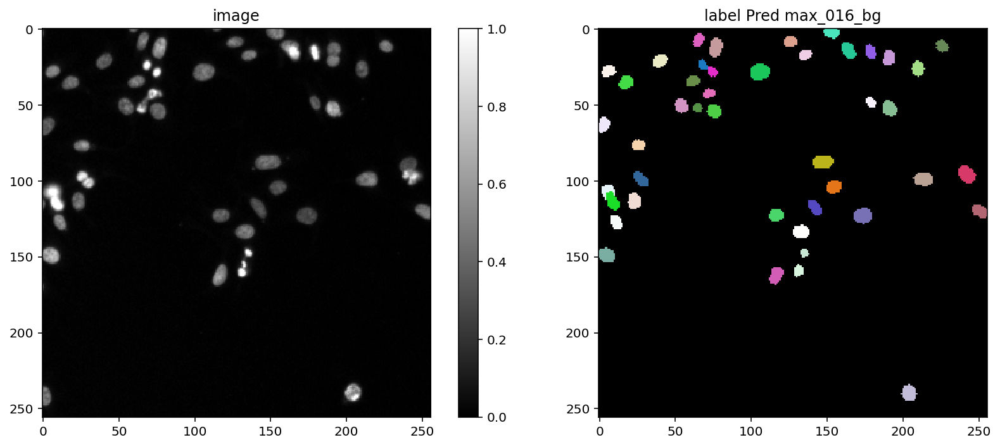

447it [00:04, 94.41it/s] 
447it [00:00, 1268.13it/s]


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 10s 150ms/step - loss: 2.8106 - prob_loss: 0.6525 - dist_loss: 10.7906 - prob_kld: 0.4094 - dist_relevant_mae: 10.7902 - dist_relevant_mse: 220.9012 - dist_dist_iou_metric: 0.1344 - val_loss: 2.2843 - val_prob_loss: 0.3948 - val_dist_loss: 9.4474 - val_prob_kld: 0.3110 - val_dist_relevant_mae: 9.4470 - val_dist_relevant_mse: 186.1805 - val_dist_dist_iou_metric: 0.1694 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 110ms/step - loss: 2.1343 - prob_loss: 0.6141 - dist_loss: 7.6009 - prob_kld: 0.3826 - dist_relevant_mae: 7.6002 - dist_relevant_mse: 120.6405 - dist_dist_iou_metric: 0.2950 - val_loss: 2.1697 - val_prob_loss: 0.5593 - val_dist_loss: 8.0522 - val_prob_kld: 0.4755 - val_dist_relevant_mae: 8.0517 - val_dist_relevant_mse: 144.2858 - val_dist_dist_iou_metric: 0.2363 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 5s 98ms/step 

Epoch 20/100
56/56 [==============================] - 5s 98ms/step - loss: 0.9583 - prob_loss: 0.4093 - dist_loss: 2.7451 - prob_kld: 0.0798 - dist_relevant_mae: 2.7443 - dist_relevant_mse: 20.9458 - dist_dist_iou_metric: 0.6684 - val_loss: 0.8051 - val_prob_loss: 0.1083 - val_dist_loss: 3.4840 - val_prob_kld: 0.0244 - val_dist_relevant_mae: 3.4834 - val_dist_relevant_mse: 30.0446 - val_dist_dist_iou_metric: 0.6448 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 5s 97ms/step - loss: 0.9519 - prob_loss: 0.4089 - dist_loss: 2.7151 - prob_kld: 0.0683 - dist_relevant_mae: 2.7144 - dist_relevant_mse: 20.6944 - dist_dist_iou_metric: 0.6705 - val_loss: 0.7345 - val_prob_loss: 0.1055 - val_dist_loss: 3.1450 - val_prob_kld: 0.0217 - val_dist_relevant_mae: 3.1444 - val_dist_relevant_mse: 29.2966 - val_dist_dist_iou_metric: 0.6300 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 5s 98ms/step - loss: 0.9626 - prob_loss: 0.4081 - dist_loss: 2.7725 - prob

Epoch 39/100
56/56 [==============================] - 5s 98ms/step - loss: 0.8707 - prob_loss: 0.4124 - dist_loss: 2.2915 - prob_kld: 0.1070 - dist_relevant_mae: 2.2906 - dist_relevant_mse: 15.9761 - dist_dist_iou_metric: 0.7153 - val_loss: 0.6462 - val_prob_loss: 0.1558 - val_dist_loss: 2.4523 - val_prob_kld: 0.0719 - val_dist_relevant_mae: 2.4515 - val_dist_relevant_mse: 18.4656 - val_dist_dist_iou_metric: 0.7077 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 6s 107ms/step - loss: 0.8676 - prob_loss: 0.4074 - dist_loss: 2.3012 - prob_kld: 0.1015 - dist_relevant_mae: 2.3002 - dist_relevant_mse: 15.8539 - dist_dist_iou_metric: 0.7195 - val_loss: 0.6351 - val_prob_loss: 0.1049 - val_dist_loss: 2.6510 - val_prob_kld: 0.0211 - val_dist_relevant_mae: 2.6502 - val_dist_relevant_mse: 19.9887 - val_dist_dist_iou_metric: 0.6977 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 6s 109ms/step - loss: 0.8475 - prob_loss: 0.4080 - dist_loss: 2.1977 - pr

Epoch 58/100
56/56 [==============================] - 5s 97ms/step - loss: 0.7845 - prob_loss: 0.4006 - dist_loss: 1.9191 - prob_kld: 0.0559 - dist_relevant_mae: 1.9184 - dist_relevant_mse: 10.8376 - dist_dist_iou_metric: 0.7503 - val_loss: 0.5715 - val_prob_loss: 0.1021 - val_dist_loss: 2.3473 - val_prob_kld: 0.0182 - val_dist_relevant_mae: 2.3466 - val_dist_relevant_mse: 17.1363 - val_dist_dist_iou_metric: 0.7169 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 5s 99ms/step - loss: 0.7897 - prob_loss: 0.3977 - dist_loss: 1.9600 - prob_kld: 0.0519 - dist_relevant_mae: 1.9593 - dist_relevant_mse: 11.0729 - dist_dist_iou_metric: 0.7482 - val_loss: 0.5428 - val_prob_loss: 0.1019 - val_dist_loss: 2.2043 - val_prob_kld: 0.0181 - val_dist_relevant_mae: 2.2038 - val_dist_relevant_mse: 15.7325 - val_dist_dist_iou_metric: 0.7205 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 5s 98ms/step - loss: 0.7821 - prob_loss: 0.3994 - dist_loss: 1.9135 - prob

Epoch 77/100
56/56 [==============================] - 6s 103ms/step - loss: 0.7551 - prob_loss: 0.3961 - dist_loss: 1.7953 - prob_kld: 0.0558 - dist_relevant_mae: 1.7947 - dist_relevant_mse: 9.9306 - dist_dist_iou_metric: 0.7678 - val_loss: 0.4832 - val_prob_loss: 0.1026 - val_dist_loss: 1.9030 - val_prob_kld: 0.0188 - val_dist_relevant_mae: 1.9024 - val_dist_relevant_mse: 12.5674 - val_dist_dist_iou_metric: 0.7614 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 5s 99ms/step - loss: 0.7824 - prob_loss: 0.4031 - dist_loss: 1.8962 - prob_kld: 0.0557 - dist_relevant_mae: 1.8955 - dist_relevant_mse: 10.5222 - dist_dist_iou_metric: 0.7545 - val_loss: 0.4810 - val_prob_loss: 0.1021 - val_dist_loss: 1.8949 - val_prob_kld: 0.0182 - val_dist_relevant_mae: 1.8942 - val_dist_relevant_mse: 12.3610 - val_dist_dist_iou_metric: 0.7612 - lr: 3.0000e-04
Epoch 79/100
56/56 [==============================] - 5s 96ms/step - loss: 0.7409 - prob_loss: 0.3967 - dist_loss: 1.7209 - prob

Epoch 96/100
56/56 [==============================] - 5s 98ms/step - loss: 0.7378 - prob_loss: 0.3954 - dist_loss: 1.7120 - prob_kld: 0.0516 - dist_relevant_mae: 1.7114 - dist_relevant_mse: 8.8975 - dist_dist_iou_metric: 0.7758 - val_loss: 0.4676 - val_prob_loss: 0.1018 - val_dist_loss: 1.8291 - val_prob_kld: 0.0179 - val_dist_relevant_mae: 1.8286 - val_dist_relevant_mse: 11.6692 - val_dist_dist_iou_metric: 0.7659 - lr: 3.0000e-04
Epoch 97/100
56/56 [==============================] - 5s 97ms/step - loss: 0.7398 - prob_loss: 0.3982 - dist_loss: 1.7079 - prob_kld: 0.0529 - dist_relevant_mae: 1.7073 - dist_relevant_mse: 8.7522 - dist_dist_iou_metric: 0.7800 - val_loss: 0.4631 - val_prob_loss: 0.0994 - val_dist_loss: 1.8183 - val_prob_kld: 0.0156 - val_dist_relevant_mae: 1.8177 - val_dist_relevant_mse: 11.6962 - val_dist_dist_iou_metric: 0.7750 - lr: 3.0000e-04
Epoch 98/100
56/56 [==============================] - 5s 95ms/step - loss: 0.7391 - prob_loss: 0.3973 - dist_loss: 1.7090 - prob_k

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/max_064_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [00:18<00:00,  2.71it/s]


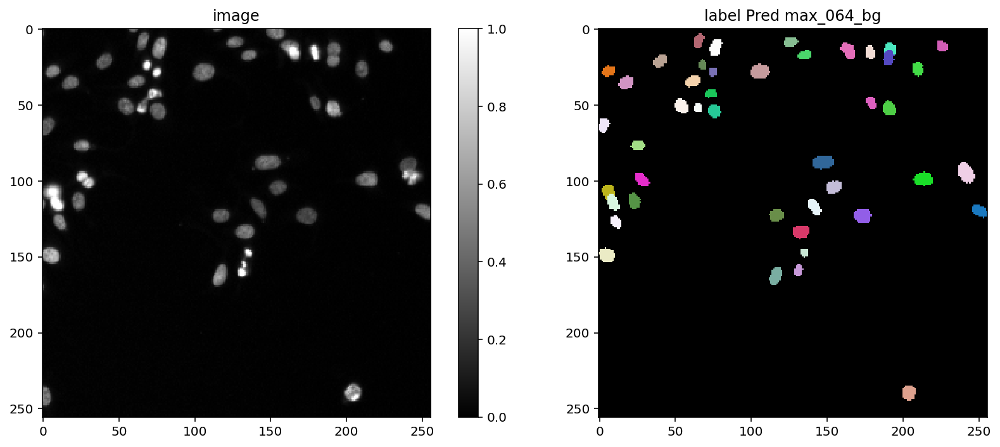

447it [00:04, 95.57it/s] 
447it [00:00, 1220.47it/s]


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 11s 158ms/step - loss: 2.9584 - prob_loss: 0.6437 - dist_loss: 11.5738 - prob_kld: 0.4081 - dist_relevant_mae: 11.5735 - dist_relevant_mse: 243.8857 - dist_dist_iou_metric: 0.0851 - val_loss: 2.2144 - val_prob_loss: 0.4382 - val_dist_loss: 8.8808 - val_prob_kld: 0.3546 - val_dist_relevant_mae: 8.8804 - val_dist_relevant_mse: 163.8425 - val_dist_dist_iou_metric: 0.1996 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 107ms/step - loss: 2.1661 - prob_loss: 0.6106 - dist_loss: 7.7775 - prob_kld: 0.3590 - dist_relevant_mae: 7.7768 - dist_relevant_mse: 126.4208 - dist_dist_iou_metric: 0.3015 - val_loss: 1.9252 - val_prob_loss: 0.3011 - val_dist_loss: 8.1206 - val_prob_kld: 0.2175 - val_dist_relevant_mae: 8.1201 - val_dist_relevant_mse: 143.2921 - val_dist_dist_iou_metric: 0.2160 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 6s 102ms/step

Epoch 20/100
56/56 [==============================] - 6s 101ms/step - loss: 0.9789 - prob_loss: 0.4144 - dist_loss: 2.8225 - prob_kld: 0.0674 - dist_relevant_mae: 2.8218 - dist_relevant_mse: 22.6827 - dist_dist_iou_metric: 0.6596 - val_loss: 0.7242 - val_prob_loss: 0.1462 - val_dist_loss: 2.8901 - val_prob_kld: 0.0626 - val_dist_relevant_mae: 2.8895 - val_dist_relevant_mse: 22.4329 - val_dist_dist_iou_metric: 0.6635 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 6s 101ms/step - loss: 0.9776 - prob_loss: 0.4142 - dist_loss: 2.8166 - prob_kld: 0.0697 - dist_relevant_mae: 2.8158 - dist_relevant_mse: 23.0778 - dist_dist_iou_metric: 0.6648 - val_loss: 0.6753 - val_prob_loss: 0.1033 - val_dist_loss: 2.8601 - val_prob_kld: 0.0197 - val_dist_relevant_mae: 2.8593 - val_dist_relevant_mse: 21.5303 - val_dist_dist_iou_metric: 0.6569 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 5s 98ms/step - loss: 0.9679 - prob_loss: 0.4145 - dist_loss: 2.7669 - pr

Epoch 39/100
56/56 [==============================] - 6s 101ms/step - loss: 0.8546 - prob_loss: 0.4017 - dist_loss: 2.2644 - prob_kld: 0.0559 - dist_relevant_mae: 2.2636 - dist_relevant_mse: 14.8571 - dist_dist_iou_metric: 0.7159 - val_loss: 0.5732 - val_prob_loss: 0.1011 - val_dist_loss: 2.3606 - val_prob_kld: 0.0174 - val_dist_relevant_mae: 2.3600 - val_dist_relevant_mse: 15.7359 - val_dist_dist_iou_metric: 0.7007 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 5s 97ms/step - loss: 0.8648 - prob_loss: 0.4027 - dist_loss: 2.3106 - prob_kld: 0.0558 - dist_relevant_mae: 2.3099 - dist_relevant_mse: 16.2409 - dist_dist_iou_metric: 0.7145 - val_loss: 0.5767 - val_prob_loss: 0.1028 - val_dist_loss: 2.3696 - val_prob_kld: 0.0192 - val_dist_relevant_mae: 2.3689 - val_dist_relevant_mse: 17.1151 - val_dist_dist_iou_metric: 0.7108 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 6s 105ms/step - loss: 0.8342 - prob_loss: 0.4066 - dist_loss: 2.1377 - pr

Epoch 58/100
56/56 [==============================] - 5s 97ms/step - loss: 0.8106 - prob_loss: 0.4018 - dist_loss: 2.0438 - prob_kld: 0.0606 - dist_relevant_mae: 2.0431 - dist_relevant_mse: 12.7142 - dist_dist_iou_metric: 0.7423 - val_loss: 0.5400 - val_prob_loss: 0.1024 - val_dist_loss: 2.1883 - val_prob_kld: 0.0187 - val_dist_relevant_mae: 2.1877 - val_dist_relevant_mse: 14.3287 - val_dist_dist_iou_metric: 0.7299 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 5s 96ms/step - loss: 0.8055 - prob_loss: 0.4018 - dist_loss: 2.0188 - prob_kld: 0.0564 - dist_relevant_mae: 2.0182 - dist_relevant_mse: 12.4249 - dist_dist_iou_metric: 0.7448 - val_loss: 0.5105 - val_prob_loss: 0.1008 - val_dist_loss: 2.0487 - val_prob_kld: 0.0172 - val_dist_relevant_mae: 2.0480 - val_dist_relevant_mse: 12.8919 - val_dist_dist_iou_metric: 0.7478 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 5s 98ms/step - loss: 0.8057 - prob_loss: 0.4039 - dist_loss: 2.0089 - prob

Epoch 77/100
56/56 [==============================] - 5s 96ms/step - loss: 0.7621 - prob_loss: 0.4006 - dist_loss: 1.8074 - prob_kld: 0.0522 - dist_relevant_mae: 1.8068 - dist_relevant_mse: 9.3776 - dist_dist_iou_metric: 0.7655 - val_loss: 0.4681 - val_prob_loss: 0.0994 - val_dist_loss: 1.8437 - val_prob_kld: 0.0158 - val_dist_relevant_mae: 1.8431 - val_dist_relevant_mse: 10.4180 - val_dist_dist_iou_metric: 0.7647 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 5s 94ms/step - loss: 0.7529 - prob_loss: 0.3965 - dist_loss: 1.7820 - prob_kld: 0.0531 - dist_relevant_mae: 1.7814 - dist_relevant_mse: 9.4868 - dist_dist_iou_metric: 0.7692 - val_loss: 0.5062 - val_prob_loss: 0.1029 - val_dist_loss: 2.0162 - val_prob_kld: 0.0193 - val_dist_relevant_mae: 2.0155 - val_dist_relevant_mse: 13.0994 - val_dist_dist_iou_metric: 0.7515 - lr: 3.0000e-04
Epoch 79/100
56/56 [==============================] - 5s 94ms/step - loss: 0.7848 - prob_loss: 0.4012 - dist_loss: 1.9179 - prob_k

Epoch 96/100
56/56 [==============================] - 6s 99ms/step - loss: 0.7243 - prob_loss: 0.3953 - dist_loss: 1.6450 - prob_kld: 0.0521 - dist_relevant_mae: 1.6444 - dist_relevant_mse: 8.6888 - dist_dist_iou_metric: 0.7795 - val_loss: 0.4489 - val_prob_loss: 0.0982 - val_dist_loss: 1.7534 - val_prob_kld: 0.0146 - val_dist_relevant_mae: 1.7529 - val_dist_relevant_mse: 9.2166 - val_dist_dist_iou_metric: 0.7764 - lr: 3.0000e-04
Epoch 97/100
56/56 [==============================] - 5s 98ms/step - loss: 0.7583 - prob_loss: 0.3991 - dist_loss: 1.7959 - prob_kld: 0.0524 - dist_relevant_mae: 1.7954 - dist_relevant_mse: 9.5327 - dist_dist_iou_metric: 0.7714 - val_loss: 0.4586 - val_prob_loss: 0.0995 - val_dist_loss: 1.7953 - val_prob_kld: 0.0159 - val_dist_relevant_mae: 1.7947 - val_dist_relevant_mse: 9.5276 - val_dist_dist_iou_metric: 0.7698 - lr: 3.0000e-04
Epoch 98/100
56/56 [==============================] - 5s 97ms/step - loss: 0.7369 - prob_loss: 0.3970 - dist_loss: 1.6997 - prob_kld

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/max_256_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [00:14<00:00,  3.46it/s]


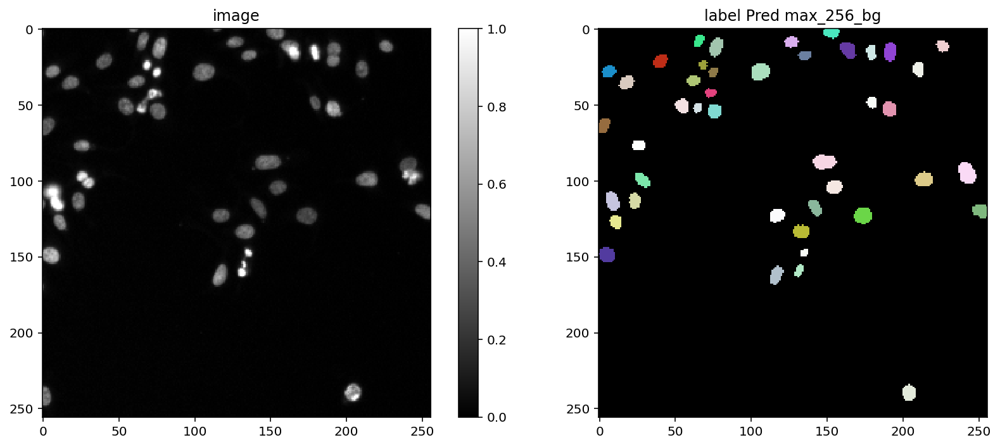

Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 11s 160ms/step - loss: 2.7175 - prob_loss: 0.3931 - dist_loss: 11.6219 - prob_kld: 0.3163 - dist_relevant_mae: 11.6216 - dist_relevant_mse: 247.0284 - dist_dist_iou_metric: 0.0926 - val_loss: 2.0787 - val_prob_loss: 0.2900 - val_dist_loss: 8.9438 - val_prob_kld: 0.2075 - val_dist_relevant_mae: 8.9431 - val_dist_relevant_mse: 162.9937 - val_dist_dist_iou_metric: 0.2315 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 111ms/step - loss: 1.7254 - prob_loss: 0.2695 - dist_loss: 7.2793 - prob_kld: 0.1935 - dist_relevant_mae: 7.2784 - dist_relevant_mse: 109.3621 - dist_dist_iou_metric: 0.3190 - val_loss: 1.6442 - val_prob_loss: 0.2460 - val_dist_loss: 6.9908 - val_prob_kld: 0.1635 - val_dist_relevant_mae: 6.9898 - val_dist_relevant_mse: 106.7105 - val_dist_dist_iou_metric: 0.3259 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 6s 106ms/step

Epoch 20/100
56/56 [==============================] - 6s 102ms/step - loss: 0.6164 - prob_loss: 0.0946 - dist_loss: 2.6089 - prob_kld: 0.0187 - dist_relevant_mae: 2.6083 - dist_relevant_mse: 18.6004 - dist_dist_iou_metric: 0.6705 - val_loss: 0.6731 - val_prob_loss: 0.1001 - val_dist_loss: 2.8647 - val_prob_kld: 0.0176 - val_dist_relevant_mae: 2.8642 - val_dist_relevant_mse: 23.0080 - val_dist_dist_iou_metric: 0.6431 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 6s 107ms/step - loss: 0.5986 - prob_loss: 0.0946 - dist_loss: 2.5197 - prob_kld: 0.0190 - dist_relevant_mae: 2.5192 - dist_relevant_mse: 18.5861 - dist_dist_iou_metric: 0.6839 - val_loss: 0.6147 - val_prob_loss: 0.1013 - val_dist_loss: 2.5667 - val_prob_kld: 0.0188 - val_dist_relevant_mae: 2.5662 - val_dist_relevant_mse: 18.8853 - val_dist_dist_iou_metric: 0.6874 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 6s 104ms/step - loss: 0.6258 - prob_loss: 0.1039 - dist_loss: 2.6099 - p

Epoch 39/100
56/56 [==============================] - 6s 100ms/step - loss: 0.5019 - prob_loss: 0.0919 - dist_loss: 2.0500 - prob_kld: 0.0158 - dist_relevant_mae: 2.0495 - dist_relevant_mse: 12.4991 - dist_dist_iou_metric: 0.7337 - val_loss: 0.5193 - val_prob_loss: 0.0984 - val_dist_loss: 2.1044 - val_prob_kld: 0.0159 - val_dist_relevant_mae: 2.1039 - val_dist_relevant_mse: 13.1227 - val_dist_dist_iou_metric: 0.7342 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 5s 99ms/step - loss: 0.4846 - prob_loss: 0.0912 - dist_loss: 1.9668 - prob_kld: 0.0176 - dist_relevant_mae: 1.9663 - dist_relevant_mse: 11.0240 - dist_dist_iou_metric: 0.7268 - val_loss: 0.5350 - val_prob_loss: 0.0985 - val_dist_loss: 2.1828 - val_prob_kld: 0.0160 - val_dist_relevant_mae: 2.1823 - val_dist_relevant_mse: 13.8021 - val_dist_dist_iou_metric: 0.7298 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 6s 100ms/step - loss: 0.5293 - prob_loss: 0.0945 - dist_loss: 2.1739 - pr

Epoch 58/100
56/56 [==============================] - 6s 100ms/step - loss: 0.4481 - prob_loss: 0.0899 - dist_loss: 1.7910 - prob_kld: 0.0151 - dist_relevant_mae: 1.7905 - dist_relevant_mse: 9.5255 - dist_dist_iou_metric: 0.7614 - val_loss: 0.4664 - val_prob_loss: 0.0974 - val_dist_loss: 1.8450 - val_prob_kld: 0.0149 - val_dist_relevant_mae: 1.8445 - val_dist_relevant_mse: 11.0480 - val_dist_dist_iou_metric: 0.7611 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 6s 102ms/step - loss: 0.4496 - prob_loss: 0.0912 - dist_loss: 1.7922 - prob_kld: 0.0148 - dist_relevant_mae: 1.7917 - dist_relevant_mse: 9.6866 - dist_dist_iou_metric: 0.7614 - val_loss: 0.4748 - val_prob_loss: 0.0972 - val_dist_loss: 1.8876 - val_prob_kld: 0.0147 - val_dist_relevant_mae: 1.8871 - val_dist_relevant_mse: 10.4708 - val_dist_dist_iou_metric: 0.7632 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 6s 103ms/step - loss: 0.4440 - prob_loss: 0.0908 - dist_loss: 1.7659 - pro

Epoch 77/100
56/56 [==============================] - 6s 102ms/step - loss: 0.4298 - prob_loss: 0.0896 - dist_loss: 1.7009 - prob_kld: 0.0142 - dist_relevant_mae: 1.7004 - dist_relevant_mse: 8.7820 - dist_dist_iou_metric: 0.7737 - val_loss: 0.4621 - val_prob_loss: 0.0979 - val_dist_loss: 1.8209 - val_prob_kld: 0.0154 - val_dist_relevant_mae: 1.8205 - val_dist_relevant_mse: 10.0389 - val_dist_dist_iou_metric: 0.7668 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 6s 103ms/step - loss: 0.4300 - prob_loss: 0.0928 - dist_loss: 1.6863 - prob_kld: 0.0158 - dist_relevant_mae: 1.6859 - dist_relevant_mse: 8.9191 - dist_dist_iou_metric: 0.7727 - val_loss: 0.4490 - val_prob_loss: 0.0977 - val_dist_loss: 1.7566 - val_prob_kld: 0.0152 - val_dist_relevant_mae: 1.7561 - val_dist_relevant_mse: 10.0242 - val_dist_dist_iou_metric: 0.7706 - lr: 3.0000e-04
Epoch 79/100
56/56 [==============================] - 6s 106ms/step - loss: 0.4377 - prob_loss: 0.0893 - dist_loss: 1.7421 - pro

Epoch 96/100
56/56 [==============================] - 6s 109ms/step - loss: 0.4139 - prob_loss: 0.0892 - dist_loss: 1.6237 - prob_kld: 0.0141 - dist_relevant_mae: 1.6233 - dist_relevant_mse: 8.0616 - dist_dist_iou_metric: 0.7834 - val_loss: 0.4208 - val_prob_loss: 0.0971 - val_dist_loss: 1.6187 - val_prob_kld: 0.0146 - val_dist_relevant_mae: 1.6183 - val_dist_relevant_mse: 8.7901 - val_dist_dist_iou_metric: 0.7877 - lr: 3.0000e-04
Epoch 97/100
56/56 [==============================] - 6s 103ms/step - loss: 0.4202 - prob_loss: 0.0939 - dist_loss: 1.6315 - prob_kld: 0.0149 - dist_relevant_mae: 1.6311 - dist_relevant_mse: 8.1605 - dist_dist_iou_metric: 0.7823 - val_loss: 0.4319 - val_prob_loss: 0.0962 - val_dist_loss: 1.6784 - val_prob_kld: 0.0137 - val_dist_relevant_mae: 1.6780 - val_dist_relevant_mse: 9.4424 - val_dist_dist_iou_metric: 0.7846 - lr: 3.0000e-04
Epoch 98/100
56/56 [==============================] - 6s 104ms/step - loss: 0.4148 - prob_loss: 0.0902 - dist_loss: 1.6230 - prob_

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/max_full_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [00:11<00:00,  4.26it/s]


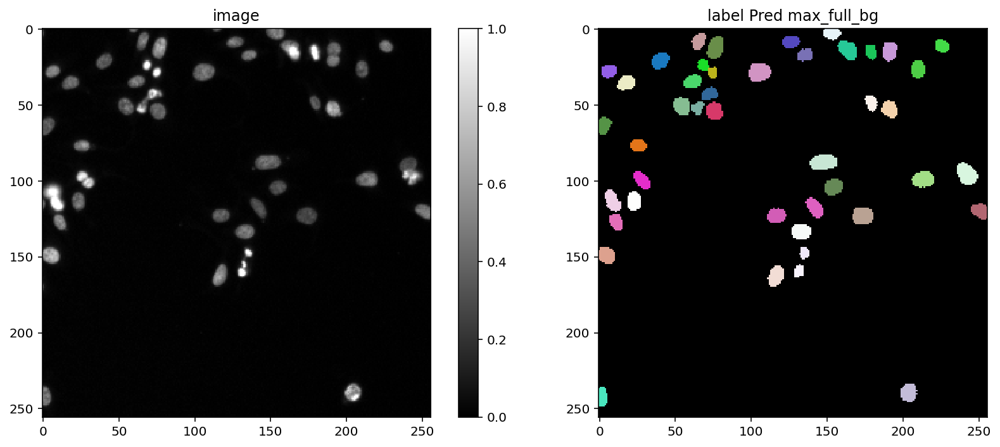

447it [00:04, 98.16it/s] 
447it [00:00, 1574.75it/s]


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 9s 141ms/step - loss: 2.5990 - prob_loss: 0.6647 - dist_loss: 9.6718 - prob_kld: 0.4717 - dist_relevant_mae: 9.6715 - dist_relevant_mse: 191.8656 - dist_dist_iou_metric: 0.1288 - val_loss: 2.5369 - val_prob_loss: 0.6547 - val_dist_loss: 9.4111 - val_prob_kld: 0.5733 - val_dist_relevant_mae: 9.4108 - val_dist_relevant_mse: 182.3669 - val_dist_dist_iou_metric: 0.1551 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 101ms/step - loss: 2.0684 - prob_loss: 0.6579 - dist_loss: 7.0529 - prob_kld: 0.3963 - dist_relevant_mae: 7.0523 - dist_relevant_mse: 112.0242 - dist_dist_iou_metric: 0.2704 - val_loss: 1.9856 - val_prob_loss: 0.4427 - val_dist_loss: 7.7143 - val_prob_kld: 0.3613 - val_dist_relevant_mae: 7.7138 - val_dist_relevant_mse: 131.6361 - val_dist_dist_iou_metric: 0.2405 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 5s 96ms/step - l

Epoch 20/100
56/56 [==============================] - 5s 93ms/step - loss: 1.1296 - prob_loss: 0.4515 - dist_loss: 3.3906 - prob_kld: 0.1904 - dist_relevant_mae: 3.3900 - dist_relevant_mse: 31.4090 - dist_dist_iou_metric: 0.5643 - val_loss: 0.9971 - val_prob_loss: 0.1751 - val_dist_loss: 4.1100 - val_prob_kld: 0.0937 - val_dist_relevant_mae: 4.1095 - val_dist_relevant_mse: 46.0899 - val_dist_dist_iou_metric: 0.5274 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 5s 99ms/step - loss: 1.2138 - prob_loss: 0.4463 - dist_loss: 3.8374 - prob_kld: 0.2129 - dist_relevant_mae: 3.8368 - dist_relevant_mse: 41.0160 - dist_dist_iou_metric: 0.5531 - val_loss: 0.9443 - val_prob_loss: 0.1830 - val_dist_loss: 3.8064 - val_prob_kld: 0.1016 - val_dist_relevant_mae: 3.8057 - val_dist_relevant_mse: 35.0036 - val_dist_dist_iou_metric: 0.5986 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 5s 93ms/step - loss: 1.1566 - prob_loss: 0.4381 - dist_loss: 3.5923 - prob

Epoch 39/100
56/56 [==============================] - 6s 102ms/step - loss: 1.0736 - prob_loss: 0.4381 - dist_loss: 3.1775 - prob_kld: 0.2116 - dist_relevant_mae: 3.1769 - dist_relevant_mse: 30.8332 - dist_dist_iou_metric: 0.6068 - val_loss: 0.8020 - val_prob_loss: 0.1543 - val_dist_loss: 3.2387 - val_prob_kld: 0.0728 - val_dist_relevant_mae: 3.2383 - val_dist_relevant_mse: 29.4746 - val_dist_dist_iou_metric: 0.6209 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 5s 96ms/step - loss: 1.0703 - prob_loss: 0.4462 - dist_loss: 3.1209 - prob_kld: 0.1896 - dist_relevant_mae: 3.1203 - dist_relevant_mse: 28.7430 - dist_dist_iou_metric: 0.6119 - val_loss: 0.8936 - val_prob_loss: 0.1985 - val_dist_loss: 3.4753 - val_prob_kld: 0.1171 - val_dist_relevant_mae: 3.4749 - val_dist_relevant_mse: 31.0899 - val_dist_dist_iou_metric: 0.5642 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 5s 92ms/step - loss: 1.0253 - prob_loss: 0.4410 - dist_loss: 2.9212 - pro

Epoch 58/100
56/56 [==============================] - 5s 91ms/step - loss: 0.9736 - prob_loss: 0.4261 - dist_loss: 2.7376 - prob_kld: 0.1890 - dist_relevant_mae: 2.7370 - dist_relevant_mse: 21.8456 - dist_dist_iou_metric: 0.6381 - val_loss: 0.7852 - val_prob_loss: 0.1814 - val_dist_loss: 3.0191 - val_prob_kld: 0.1000 - val_dist_relevant_mae: 3.0186 - val_dist_relevant_mse: 26.2591 - val_dist_dist_iou_metric: 0.6432 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 5s 90ms/step - loss: 0.9691 - prob_loss: 0.4177 - dist_loss: 2.7570 - prob_kld: 0.2003 - dist_relevant_mae: 2.7563 - dist_relevant_mse: 24.3809 - dist_dist_iou_metric: 0.6350 - val_loss: 0.7354 - val_prob_loss: 0.1414 - val_dist_loss: 2.9698 - val_prob_kld: 0.0600 - val_dist_relevant_mae: 2.9694 - val_dist_relevant_mse: 25.5977 - val_dist_dist_iou_metric: 0.6413 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 5s 91ms/step - loss: 0.9930 - prob_loss: 0.4224 - dist_loss: 2.8531 - prob

Epoch 77/100
56/56 [==============================] - 6s 101ms/step - loss: 0.9177 - prob_loss: 0.4107 - dist_loss: 2.5351 - prob_kld: 0.1650 - dist_relevant_mae: 2.5345 - dist_relevant_mse: 19.4619 - dist_dist_iou_metric: 0.6664 - val_loss: 0.6767 - val_prob_loss: 0.1200 - val_dist_loss: 2.7837 - val_prob_kld: 0.0385 - val_dist_relevant_mae: 2.7833 - val_dist_relevant_mse: 21.9670 - val_dist_dist_iou_metric: 0.6784 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 5s 91ms/step - loss: 0.8497 - prob_loss: 0.4031 - dist_loss: 2.2332 - prob_kld: 0.1468 - dist_relevant_mae: 2.2327 - dist_relevant_mse: 15.2135 - dist_dist_iou_metric: 0.6776 - val_loss: 0.7304 - val_prob_loss: 0.2015 - val_dist_loss: 2.6449 - val_prob_kld: 0.1200 - val_dist_relevant_mae: 2.6441 - val_dist_relevant_mse: 21.1193 - val_dist_dist_iou_metric: 0.6862 - lr: 3.0000e-04
Epoch 79/100
56/56 [==============================] - 5s 94ms/step - loss: 0.9414 - prob_loss: 0.4177 - dist_loss: 2.6185 - pro

Epoch 96/100
56/56 [==============================] - 5s 93ms/step - loss: 0.8620 - prob_loss: 0.4087 - dist_loss: 2.2669 - prob_kld: 0.1840 - dist_relevant_mae: 2.2662 - dist_relevant_mse: 15.3271 - dist_dist_iou_metric: 0.6827 - val_loss: 0.6889 - val_prob_loss: 0.1740 - val_dist_loss: 2.5744 - val_prob_kld: 0.0926 - val_dist_relevant_mae: 2.5739 - val_dist_relevant_mse: 20.2945 - val_dist_dist_iou_metric: 0.6991 - lr: 3.0000e-04
Epoch 97/100
56/56 [==============================] - 5s 91ms/step - loss: 0.8269 - prob_loss: 0.4084 - dist_loss: 2.0923 - prob_kld: 0.1534 - dist_relevant_mae: 2.0917 - dist_relevant_mse: 13.1549 - dist_dist_iou_metric: 0.6832 - val_loss: 0.7082 - val_prob_loss: 0.1760 - val_dist_loss: 2.6611 - val_prob_kld: 0.0945 - val_dist_relevant_mae: 2.6607 - val_dist_relevant_mse: 20.8736 - val_dist_dist_iou_metric: 0.6918 - lr: 3.0000e-04
Epoch 98/100
56/56 [==============================] - 5s 92ms/step - loss: 0.9803 - prob_loss: 0.4141 - dist_loss: 2.8310 - prob

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/minmax_001_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [00:11<00:00,  4.17it/s]


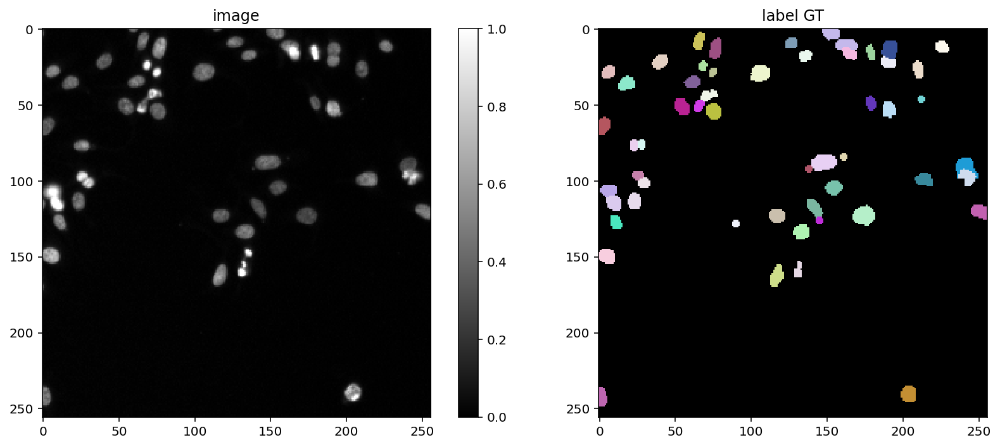

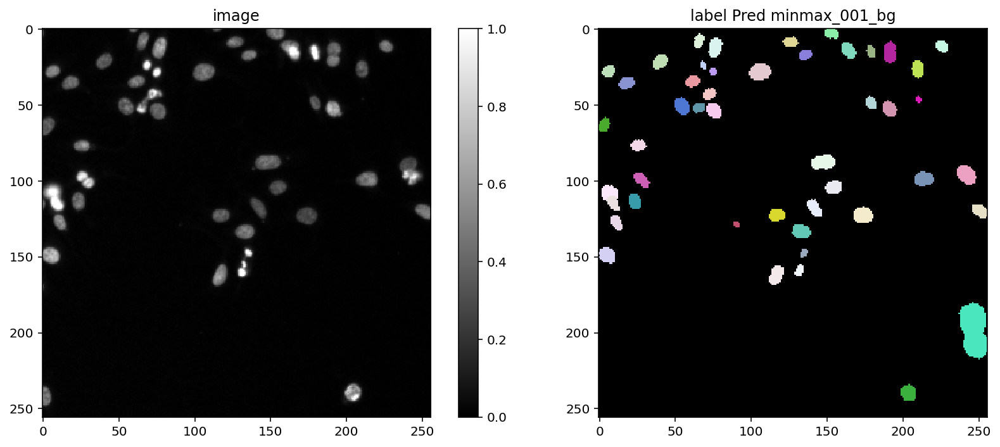

447it [00:04, 100.61it/s]
447it [00:00, 1515.05it/s]


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 10s 145ms/step - loss: 2.9538 - prob_loss: 0.6499 - dist_loss: 11.5194 - prob_kld: 0.4603 - dist_relevant_mae: 11.5191 - dist_relevant_mse: 261.2687 - dist_dist_iou_metric: 0.1025 - val_loss: 2.0147 - val_prob_loss: 0.3939 - val_dist_loss: 8.1039 - val_prob_kld: 0.3105 - val_dist_relevant_mae: 8.1034 - val_dist_relevant_mse: 138.2498 - val_dist_dist_iou_metric: 0.2611 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 100ms/step - loss: 2.2060 - prob_loss: 0.6237 - dist_loss: 7.9113 - prob_kld: 0.3654 - dist_relevant_mae: 7.9107 - dist_relevant_mse: 136.1914 - dist_dist_iou_metric: 0.2854 - val_loss: 2.0730 - val_prob_loss: 0.2645 - val_dist_loss: 9.0423 - val_prob_kld: 0.1811 - val_dist_relevant_mae: 9.0419 - val_dist_relevant_mse: 172.4728 - val_dist_dist_iou_metric: 0.1649 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 6s 102ms/step

Epoch 20/100
56/56 [==============================] - 5s 95ms/step - loss: 1.0280 - prob_loss: 0.4219 - dist_loss: 3.0307 - prob_kld: 0.1805 - dist_relevant_mae: 3.0300 - dist_relevant_mse: 26.6969 - dist_dist_iou_metric: 0.6337 - val_loss: 0.8498 - val_prob_loss: 0.2001 - val_dist_loss: 3.2484 - val_prob_kld: 0.1166 - val_dist_relevant_mae: 3.2475 - val_dist_relevant_mse: 27.2795 - val_dist_dist_iou_metric: 0.6253 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 5s 99ms/step - loss: 1.0342 - prob_loss: 0.4199 - dist_loss: 3.0714 - prob_kld: 0.2061 - dist_relevant_mae: 3.0706 - dist_relevant_mse: 26.0761 - dist_dist_iou_metric: 0.6351 - val_loss: 0.7953 - val_prob_loss: 0.1341 - val_dist_loss: 3.3059 - val_prob_kld: 0.0507 - val_dist_relevant_mae: 3.3053 - val_dist_relevant_mse: 28.4740 - val_dist_dist_iou_metric: 0.6192 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 5s 95ms/step - loss: 1.0139 - prob_loss: 0.4192 - dist_loss: 2.9737 - prob

Epoch 39/100
56/56 [==============================] - 6s 100ms/step - loss: 0.8991 - prob_loss: 0.4090 - dist_loss: 2.4503 - prob_kld: 0.1298 - dist_relevant_mae: 2.4498 - dist_relevant_mse: 17.7557 - dist_dist_iou_metric: 0.6865 - val_loss: 0.6608 - val_prob_loss: 0.1265 - val_dist_loss: 2.6716 - val_prob_kld: 0.0431 - val_dist_relevant_mae: 2.6710 - val_dist_relevant_mse: 20.2819 - val_dist_dist_iou_metric: 0.6890 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 5s 96ms/step - loss: 0.8713 - prob_loss: 0.4078 - dist_loss: 2.3174 - prob_kld: 0.1348 - dist_relevant_mae: 2.3168 - dist_relevant_mse: 15.9448 - dist_dist_iou_metric: 0.6940 - val_loss: 0.6840 - val_prob_loss: 0.1274 - val_dist_loss: 2.7831 - val_prob_kld: 0.0440 - val_dist_relevant_mae: 2.7826 - val_dist_relevant_mse: 21.5757 - val_dist_dist_iou_metric: 0.6718 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 5s 98ms/step - loss: 0.8920 - prob_loss: 0.4119 - dist_loss: 2.4005 - pro

Epoch 58/100
56/56 [==============================] - 5s 88ms/step - loss: 0.8282 - prob_loss: 0.4095 - dist_loss: 2.0932 - prob_kld: 0.1353 - dist_relevant_mae: 2.0926 - dist_relevant_mse: 13.9588 - dist_dist_iou_metric: 0.7179 - val_loss: 0.6164 - val_prob_loss: 0.1186 - val_dist_loss: 2.4888 - val_prob_kld: 0.0352 - val_dist_relevant_mae: 2.4884 - val_dist_relevant_mse: 17.9492 - val_dist_dist_iou_metric: 0.6909 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 5s 96ms/step - loss: 0.8230 - prob_loss: 0.4040 - dist_loss: 2.0949 - prob_kld: 0.1254 - dist_relevant_mae: 2.0944 - dist_relevant_mse: 12.6445 - dist_dist_iou_metric: 0.7255 - val_loss: 0.6059 - val_prob_loss: 0.1252 - val_dist_loss: 2.4034 - val_prob_kld: 0.0418 - val_dist_relevant_mae: 2.4030 - val_dist_relevant_mse: 17.1785 - val_dist_dist_iou_metric: 0.7005 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 5s 94ms/step - loss: 0.8285 - prob_loss: 0.4053 - dist_loss: 2.1163 - prob

Epoch 77/100
56/56 [==============================] - 5s 92ms/step - loss: 0.7995 - prob_loss: 0.4076 - dist_loss: 1.9593 - prob_kld: 0.1339 - dist_relevant_mae: 1.9587 - dist_relevant_mse: 11.8264 - dist_dist_iou_metric: 0.7450 - val_loss: 0.5636 - val_prob_loss: 0.1201 - val_dist_loss: 2.2171 - val_prob_kld: 0.0367 - val_dist_relevant_mae: 2.2167 - val_dist_relevant_mse: 15.3893 - val_dist_dist_iou_metric: 0.7170 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 5s 94ms/step - loss: 0.7969 - prob_loss: 0.4013 - dist_loss: 1.9784 - prob_kld: 0.1181 - dist_relevant_mae: 1.9779 - dist_relevant_mse: 12.7303 - dist_dist_iou_metric: 0.7402 - val_loss: 0.5735 - val_prob_loss: 0.1413 - val_dist_loss: 2.1610 - val_prob_kld: 0.0578 - val_dist_relevant_mae: 2.1606 - val_dist_relevant_mse: 14.4435 - val_dist_dist_iou_metric: 0.7302 - lr: 3.0000e-04
Epoch 79/100
56/56 [==============================] - 5s 93ms/step - loss: 0.8014 - prob_loss: 0.4050 - dist_loss: 1.9822 - prob

Epoch 96/100
56/56 [==============================] - 5s 94ms/step - loss: 0.7510 - prob_loss: 0.4021 - dist_loss: 1.7447 - prob_kld: 0.1573 - dist_relevant_mae: 1.7441 - dist_relevant_mse: 9.1792 - dist_dist_iou_metric: 0.7572 - val_loss: 0.5975 - val_prob_loss: 0.1442 - val_dist_loss: 2.2664 - val_prob_kld: 0.0608 - val_dist_relevant_mae: 2.2660 - val_dist_relevant_mse: 14.9703 - val_dist_dist_iou_metric: 0.7020 - lr: 3.0000e-04
Epoch 97/100
56/56 [==============================] - 5s 95ms/step - loss: 0.7872 - prob_loss: 0.4042 - dist_loss: 1.9149 - prob_kld: 0.1395 - dist_relevant_mae: 1.9145 - dist_relevant_mse: 11.5781 - dist_dist_iou_metric: 0.7522 - val_loss: 0.5786 - val_prob_loss: 0.1541 - val_dist_loss: 2.1222 - val_prob_kld: 0.0707 - val_dist_relevant_mae: 2.1219 - val_dist_relevant_mse: 13.8233 - val_dist_dist_iou_metric: 0.7356 - lr: 3.0000e-04
Epoch 98/100
56/56 [==============================] - 5s 93ms/step - loss: 0.7642 - prob_loss: 0.4001 - dist_loss: 1.8203 - prob_

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/minmax_004_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [00:12<00:00,  3.93it/s]


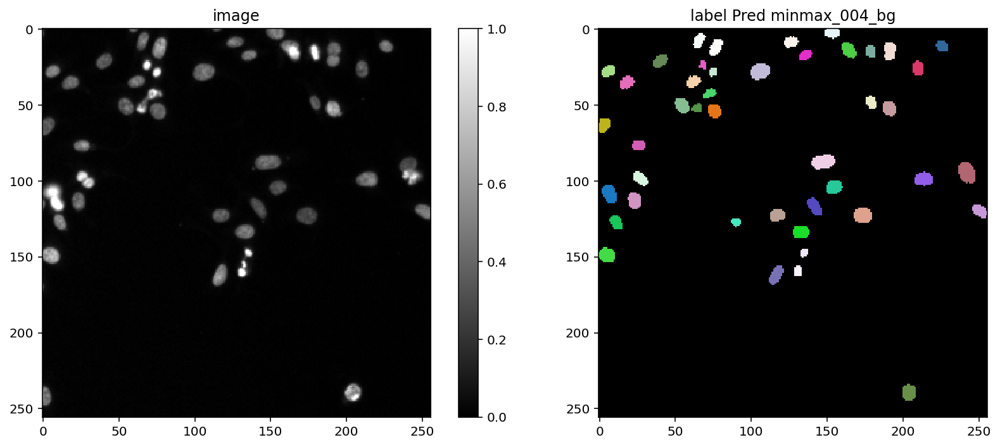

447it [00:04, 95.00it/s] 
447it [00:00, 1205.36it/s]


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 11s 152ms/step - loss: 3.2111 - prob_loss: 0.6533 - dist_loss: 12.7891 - prob_kld: 0.4023 - dist_relevant_mae: 12.7888 - dist_relevant_mse: 294.1006 - dist_dist_iou_metric: 0.0610 - val_loss: 2.5588 - val_prob_loss: 0.6823 - val_dist_loss: 9.3826 - val_prob_kld: 0.5966 - val_dist_relevant_mae: 9.3820 - val_dist_relevant_mse: 183.3707 - val_dist_dist_iou_metric: 0.2106 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 107ms/step - loss: 2.3224 - prob_loss: 0.6211 - dist_loss: 8.5067 - prob_kld: 0.3997 - dist_relevant_mae: 8.5061 - dist_relevant_mse: 150.4132 - dist_dist_iou_metric: 0.2741 - val_loss: 1.8505 - val_prob_loss: 0.3059 - val_dist_loss: 7.7230 - val_prob_kld: 0.2202 - val_dist_relevant_mae: 7.7225 - val_dist_relevant_mse: 134.3227 - val_dist_dist_iou_metric: 0.2871 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 6s 112ms/step

Epoch 20/100
56/56 [==============================] - 6s 104ms/step - loss: 0.9524 - prob_loss: 0.4141 - dist_loss: 2.6915 - prob_kld: 0.0739 - dist_relevant_mae: 2.6910 - dist_relevant_mse: 20.8951 - dist_dist_iou_metric: 0.6781 - val_loss: 0.6921 - val_prob_loss: 0.1154 - val_dist_loss: 2.8834 - val_prob_kld: 0.0297 - val_dist_relevant_mae: 2.8829 - val_dist_relevant_mse: 24.8867 - val_dist_dist_iou_metric: 0.6634 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 6s 105ms/step - loss: 0.9739 - prob_loss: 0.4174 - dist_loss: 2.7826 - prob_kld: 0.0885 - dist_relevant_mae: 2.7820 - dist_relevant_mse: 22.3120 - dist_dist_iou_metric: 0.6717 - val_loss: 0.6957 - val_prob_loss: 0.1154 - val_dist_loss: 2.9017 - val_prob_kld: 0.0296 - val_dist_relevant_mae: 2.9013 - val_dist_relevant_mse: 25.1613 - val_dist_dist_iou_metric: 0.6559 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 6s 100ms/step - loss: 0.9709 - prob_loss: 0.4150 - dist_loss: 2.7794 - p

Epoch 39/100
56/56 [==============================] - 6s 115ms/step - loss: 0.8263 - prob_loss: 0.4065 - dist_loss: 2.0991 - prob_kld: 0.0842 - dist_relevant_mae: 2.0987 - dist_relevant_mse: 12.7947 - dist_dist_iou_metric: 0.7295 - val_loss: 0.6116 - val_prob_loss: 0.1345 - val_dist_loss: 2.3858 - val_prob_kld: 0.0488 - val_dist_relevant_mae: 2.3853 - val_dist_relevant_mse: 16.7730 - val_dist_dist_iou_metric: 0.7292 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 6s 117ms/step - loss: 0.8282 - prob_loss: 0.4103 - dist_loss: 2.0894 - prob_kld: 0.0706 - dist_relevant_mae: 2.0889 - dist_relevant_mse: 12.6865 - dist_dist_iou_metric: 0.7392 - val_loss: 0.5699 - val_prob_loss: 0.1250 - val_dist_loss: 2.2244 - val_prob_kld: 0.0393 - val_dist_relevant_mae: 2.2240 - val_dist_relevant_mse: 15.3195 - val_dist_dist_iou_metric: 0.7345 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 6s 115ms/step - loss: 0.8152 - prob_loss: 0.4055 - dist_loss: 2.0482 - p

Epoch 58/100
56/56 [==============================] - 6s 117ms/step - loss: 0.7763 - prob_loss: 0.4038 - dist_loss: 1.8623 - prob_kld: 0.0629 - dist_relevant_mae: 1.8619 - dist_relevant_mse: 10.9441 - dist_dist_iou_metric: 0.7642 - val_loss: 0.5027 - val_prob_loss: 0.1093 - val_dist_loss: 1.9670 - val_prob_kld: 0.0236 - val_dist_relevant_mae: 1.9666 - val_dist_relevant_mse: 11.9457 - val_dist_dist_iou_metric: 0.7587 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 7s 118ms/step - loss: 0.7869 - prob_loss: 0.4053 - dist_loss: 1.9079 - prob_kld: 0.0621 - dist_relevant_mae: 1.9075 - dist_relevant_mse: 10.6102 - dist_dist_iou_metric: 0.7570 - val_loss: 0.5001 - val_prob_loss: 0.1093 - val_dist_loss: 1.9541 - val_prob_kld: 0.0236 - val_dist_relevant_mae: 1.9537 - val_dist_relevant_mse: 11.7294 - val_dist_dist_iou_metric: 0.7619 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 6s 113ms/step - loss: 0.7996 - prob_loss: 0.4083 - dist_loss: 1.9567 - p

Epoch 77/100
56/56 [==============================] - 7s 118ms/step - loss: 0.7498 - prob_loss: 0.4017 - dist_loss: 1.7406 - prob_kld: 0.0685 - dist_relevant_mae: 1.7402 - dist_relevant_mse: 9.6569 - dist_dist_iou_metric: 0.7806 - val_loss: 0.4678 - val_prob_loss: 0.1089 - val_dist_loss: 1.7943 - val_prob_kld: 0.0232 - val_dist_relevant_mae: 1.7940 - val_dist_relevant_mse: 9.7602 - val_dist_dist_iou_metric: 0.7756 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 6s 114ms/step - loss: 0.7540 - prob_loss: 0.4020 - dist_loss: 1.7597 - prob_kld: 0.0604 - dist_relevant_mae: 1.7593 - dist_relevant_mse: 9.4868 - dist_dist_iou_metric: 0.7766 - val_loss: 0.4835 - val_prob_loss: 0.1138 - val_dist_loss: 1.8484 - val_prob_kld: 0.0281 - val_dist_relevant_mae: 1.8480 - val_dist_relevant_mse: 10.4720 - val_dist_dist_iou_metric: 0.7737 - lr: 3.0000e-04
Epoch 79/100
56/56 [==============================] - 6s 111ms/step - loss: 0.7781 - prob_loss: 0.4036 - dist_loss: 1.8725 - prob

Epoch 96/100
56/56 [==============================] - 6s 111ms/step - loss: 0.7748 - prob_loss: 0.4056 - dist_loss: 1.8463 - prob_kld: 0.0779 - dist_relevant_mae: 1.8458 - dist_relevant_mse: 9.5683 - dist_dist_iou_metric: 0.7647 - val_loss: 0.4641 - val_prob_loss: 0.1081 - val_dist_loss: 1.7800 - val_prob_kld: 0.0223 - val_dist_relevant_mae: 1.7796 - val_dist_relevant_mse: 9.4055 - val_dist_dist_iou_metric: 0.7843 - lr: 3.0000e-04
Epoch 97/100
56/56 [==============================] - 7s 119ms/step - loss: 0.7405 - prob_loss: 0.4059 - dist_loss: 1.6728 - prob_kld: 0.0667 - dist_relevant_mae: 1.6724 - dist_relevant_mse: 8.5035 - dist_dist_iou_metric: 0.7856 - val_loss: 0.4512 - val_prob_loss: 0.1101 - val_dist_loss: 1.7055 - val_prob_kld: 0.0244 - val_dist_relevant_mae: 1.7050 - val_dist_relevant_mse: 8.6601 - val_dist_dist_iou_metric: 0.7835 - lr: 3.0000e-04
Epoch 98/100
56/56 [==============================] - 6s 113ms/step - loss: 0.7412 - prob_loss: 0.4068 - dist_loss: 1.6721 - prob_

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/minmax_016_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [00:13<00:00,  3.66it/s]


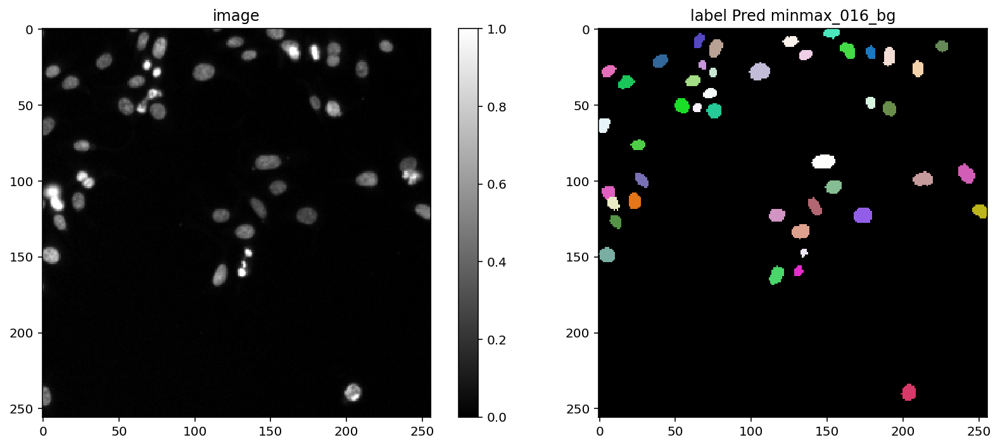

447it [00:04, 89.76it/s] 
447it [00:00, 1090.70it/s]


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 10s 151ms/step - loss: 2.8167 - prob_loss: 0.6199 - dist_loss: 10.9841 - prob_kld: 0.3911 - dist_relevant_mae: 10.9838 - dist_relevant_mse: 224.3914 - dist_dist_iou_metric: 0.1092 - val_loss: 2.1230 - val_prob_loss: 0.3679 - val_dist_loss: 8.7756 - val_prob_kld: 0.2846 - val_dist_relevant_mae: 8.7752 - val_dist_relevant_mse: 160.6610 - val_dist_dist_iou_metric: 0.1813 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 110ms/step - loss: 2.1915 - prob_loss: 0.6099 - dist_loss: 7.9081 - prob_kld: 0.2902 - dist_relevant_mae: 7.9075 - dist_relevant_mse: 131.6001 - dist_dist_iou_metric: 0.2789 - val_loss: 1.6683 - val_prob_loss: 0.2916 - val_dist_loss: 6.8832 - val_prob_kld: 0.2084 - val_dist_relevant_mae: 6.8825 - val_dist_relevant_mse: 99.6483 - val_dist_dist_iou_metric: 0.3352 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 6s 109ms/step 

Epoch 20/100
56/56 [==============================] - 6s 113ms/step - loss: 0.9501 - prob_loss: 0.4113 - dist_loss: 2.6940 - prob_kld: 0.0712 - dist_relevant_mae: 2.6933 - dist_relevant_mse: 20.5668 - dist_dist_iou_metric: 0.6664 - val_loss: 0.7162 - val_prob_loss: 0.1469 - val_dist_loss: 2.8462 - val_prob_kld: 0.0636 - val_dist_relevant_mae: 2.8454 - val_dist_relevant_mse: 22.7858 - val_dist_dist_iou_metric: 0.6524 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 6s 105ms/step - loss: 0.9539 - prob_loss: 0.4111 - dist_loss: 2.7140 - prob_kld: 0.0717 - dist_relevant_mae: 2.7133 - dist_relevant_mse: 21.4380 - dist_dist_iou_metric: 0.6698 - val_loss: 0.6910 - val_prob_loss: 0.1077 - val_dist_loss: 2.9164 - val_prob_kld: 0.0244 - val_dist_relevant_mae: 2.9158 - val_dist_relevant_mse: 22.3097 - val_dist_dist_iou_metric: 0.6703 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 6s 104ms/step - loss: 0.9474 - prob_loss: 0.4120 - dist_loss: 2.6770 - p

Epoch 39/100
56/56 [==============================] - 6s 107ms/step - loss: 0.8225 - prob_loss: 0.4069 - dist_loss: 2.0780 - prob_kld: 0.0376 - dist_relevant_mae: 2.0776 - dist_relevant_mse: 12.8108 - dist_dist_iou_metric: 0.7319 - val_loss: 0.5571 - val_prob_loss: 0.1114 - val_dist_loss: 2.2283 - val_prob_kld: 0.0281 - val_dist_relevant_mae: 2.2279 - val_dist_relevant_mse: 15.1018 - val_dist_dist_iou_metric: 0.7207 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 6s 103ms/step - loss: 0.8207 - prob_loss: 0.4054 - dist_loss: 2.0765 - prob_kld: 0.0455 - dist_relevant_mae: 2.0760 - dist_relevant_mse: 12.9425 - dist_dist_iou_metric: 0.7281 - val_loss: 0.6287 - val_prob_loss: 0.1492 - val_dist_loss: 2.3976 - val_prob_kld: 0.0659 - val_dist_relevant_mae: 2.3970 - val_dist_relevant_mse: 17.1644 - val_dist_dist_iou_metric: 0.7151 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 6s 106ms/step - loss: 0.8165 - prob_loss: 0.4045 - dist_loss: 2.0598 - p

Epoch 58/100
56/56 [==============================] - 6s 102ms/step - loss: 0.7606 - prob_loss: 0.4009 - dist_loss: 1.7984 - prob_kld: 0.0310 - dist_relevant_mae: 1.7980 - dist_relevant_mse: 10.0858 - dist_dist_iou_metric: 0.7647 - val_loss: 0.4984 - val_prob_loss: 0.1113 - val_dist_loss: 1.9351 - val_prob_kld: 0.0281 - val_dist_relevant_mae: 1.9347 - val_dist_relevant_mse: 11.2130 - val_dist_dist_iou_metric: 0.7564 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 6s 103ms/step - loss: 0.7571 - prob_loss: 0.3982 - dist_loss: 1.7949 - prob_kld: 0.0353 - dist_relevant_mae: 1.7945 - dist_relevant_mse: 10.0746 - dist_dist_iou_metric: 0.7575 - val_loss: 0.4909 - val_prob_loss: 0.1096 - val_dist_loss: 1.9066 - val_prob_kld: 0.0263 - val_dist_relevant_mae: 1.9062 - val_dist_relevant_mse: 10.6273 - val_dist_dist_iou_metric: 0.7500 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 6s 103ms/step - loss: 0.7638 - prob_loss: 0.4008 - dist_loss: 1.8155 - p

Epoch 77/100
56/56 [==============================] - 6s 105ms/step - loss: 0.7370 - prob_loss: 0.3997 - dist_loss: 1.6860 - prob_kld: 0.0315 - dist_relevant_mae: 1.6856 - dist_relevant_mse: 8.6180 - dist_dist_iou_metric: 0.7748 - val_loss: 0.4681 - val_prob_loss: 0.1076 - val_dist_loss: 1.8023 - val_prob_kld: 0.0243 - val_dist_relevant_mae: 1.8020 - val_dist_relevant_mse: 9.7564 - val_dist_dist_iou_metric: 0.7663 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 6s 103ms/step - loss: 0.7356 - prob_loss: 0.3968 - dist_loss: 1.6936 - prob_kld: 0.0266 - dist_relevant_mae: 1.6932 - dist_relevant_mse: 8.7340 - dist_dist_iou_metric: 0.7725 - val_loss: 0.4584 - val_prob_loss: 0.1027 - val_dist_loss: 1.7785 - val_prob_kld: 0.0194 - val_dist_relevant_mae: 1.7781 - val_dist_relevant_mse: 9.5455 - val_dist_dist_iou_metric: 0.7640 - lr: 3.0000e-04
Epoch 79/100
56/56 [==============================] - 6s 107ms/step - loss: 0.7429 - prob_loss: 0.4007 - dist_loss: 1.7108 - prob_

Epoch 96/100
56/56 [==============================] - 6s 102ms/step - loss: 0.7866 - prob_loss: 0.4016 - dist_loss: 1.9248 - prob_kld: 0.0440 - dist_relevant_mae: 1.9243 - dist_relevant_mse: 10.2645 - dist_dist_iou_metric: 0.7572 - val_loss: 0.4662 - val_prob_loss: 0.1142 - val_dist_loss: 1.7600 - val_prob_kld: 0.0309 - val_dist_relevant_mae: 1.7596 - val_dist_relevant_mse: 9.0085 - val_dist_dist_iou_metric: 0.7710 - lr: 3.0000e-04
Epoch 97/100
56/56 [==============================] - 6s 105ms/step - loss: 0.7273 - prob_loss: 0.3971 - dist_loss: 1.6510 - prob_kld: 0.0305 - dist_relevant_mae: 1.6506 - dist_relevant_mse: 8.3131 - dist_dist_iou_metric: 0.7809 - val_loss: 0.4710 - val_prob_loss: 0.1309 - val_dist_loss: 1.7002 - val_prob_kld: 0.0476 - val_dist_relevant_mae: 1.6998 - val_dist_relevant_mse: 8.8448 - val_dist_dist_iou_metric: 0.7776 - lr: 3.0000e-04
Epoch 98/100
56/56 [==============================] - 6s 108ms/step - loss: 0.7262 - prob_loss: 0.3992 - dist_loss: 1.6346 - prob

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/minmax_064_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [00:12<00:00,  4.08it/s]


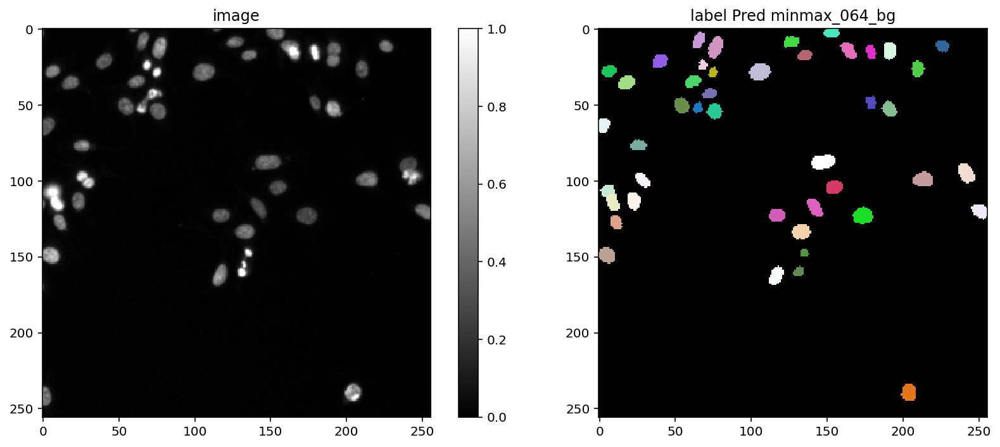

447it [00:05, 82.31it/s] 
447it [00:00, 994.19it/s] 


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 10s 153ms/step - loss: 2.9051 - prob_loss: 0.6493 - dist_loss: 11.2791 - prob_kld: 0.4262 - dist_relevant_mae: 11.2788 - dist_relevant_mse: 232.3832 - dist_dist_iou_metric: 0.1000 - val_loss: 2.2723 - val_prob_loss: 0.5706 - val_dist_loss: 8.5086 - val_prob_kld: 0.4894 - val_dist_relevant_mae: 8.5081 - val_dist_relevant_mse: 154.5111 - val_dist_dist_iou_metric: 0.2275 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 114ms/step - loss: 2.1118 - prob_loss: 0.5709 - dist_loss: 7.7044 - prob_kld: 0.3067 - dist_relevant_mae: 7.7037 - dist_relevant_mse: 123.7240 - dist_dist_iou_metric: 0.2925 - val_loss: 1.6896 - val_prob_loss: 0.2791 - val_dist_loss: 7.0525 - val_prob_kld: 0.1979 - val_dist_relevant_mae: 7.0519 - val_dist_relevant_mse: 110.7144 - val_dist_dist_iou_metric: 0.3176 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 6s 110ms/step

Epoch 20/100
56/56 [==============================] - 6s 101ms/step - loss: 0.9673 - prob_loss: 0.4118 - dist_loss: 2.7777 - prob_kld: 0.0742 - dist_relevant_mae: 2.7771 - dist_relevant_mse: 22.2300 - dist_dist_iou_metric: 0.6566 - val_loss: 0.8150 - val_prob_loss: 0.1909 - val_dist_loss: 3.1203 - val_prob_kld: 0.1097 - val_dist_relevant_mae: 3.1195 - val_dist_relevant_mse: 23.9874 - val_dist_dist_iou_metric: 0.6674 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 6s 102ms/step - loss: 0.9656 - prob_loss: 0.4127 - dist_loss: 2.7647 - prob_kld: 0.0538 - dist_relevant_mae: 2.7641 - dist_relevant_mse: 21.6854 - dist_dist_iou_metric: 0.6608 - val_loss: 0.6938 - val_prob_loss: 0.1167 - val_dist_loss: 2.8857 - val_prob_kld: 0.0355 - val_dist_relevant_mae: 2.8851 - val_dist_relevant_mse: 21.8111 - val_dist_dist_iou_metric: 0.6769 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 6s 106ms/step - loss: 0.9619 - prob_loss: 0.4108 - dist_loss: 2.7557 - p

Epoch 39/100
56/56 [==============================] - 6s 101ms/step - loss: 0.8594 - prob_loss: 0.4054 - dist_loss: 2.2699 - prob_kld: 0.0391 - dist_relevant_mae: 2.2694 - dist_relevant_mse: 14.9804 - dist_dist_iou_metric: 0.7125 - val_loss: 0.7718 - val_prob_loss: 0.2491 - val_dist_loss: 2.6139 - val_prob_kld: 0.1679 - val_dist_relevant_mae: 2.6130 - val_dist_relevant_mse: 18.9661 - val_dist_dist_iou_metric: 0.7120 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 6s 103ms/step - loss: 0.8662 - prob_loss: 0.4038 - dist_loss: 2.3121 - prob_kld: 0.0814 - dist_relevant_mae: 2.3115 - dist_relevant_mse: 15.3571 - dist_dist_iou_metric: 0.7056 - val_loss: 0.5982 - val_prob_loss: 0.1038 - val_dist_loss: 2.4719 - val_prob_kld: 0.0226 - val_dist_relevant_mae: 2.4715 - val_dist_relevant_mse: 16.9044 - val_dist_dist_iou_metric: 0.6860 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 6s 104ms/step - loss: 0.8293 - prob_loss: 0.4068 - dist_loss: 2.1126 - p

Epoch 58/100
56/56 [==============================] - 6s 101ms/step - loss: 0.7583 - prob_loss: 0.3984 - dist_loss: 1.7998 - prob_kld: 0.0467 - dist_relevant_mae: 1.7993 - dist_relevant_mse: 9.5532 - dist_dist_iou_metric: 0.7591 - val_loss: 0.5248 - val_prob_loss: 0.1459 - val_dist_loss: 1.8944 - val_prob_kld: 0.0647 - val_dist_relevant_mae: 1.8939 - val_dist_relevant_mse: 11.4935 - val_dist_dist_iou_metric: 0.7661 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 6s 102ms/step - loss: 0.7597 - prob_loss: 0.3985 - dist_loss: 1.8062 - prob_kld: 0.0425 - dist_relevant_mae: 1.8057 - dist_relevant_mse: 9.4369 - dist_dist_iou_metric: 0.7590 - val_loss: 0.4958 - val_prob_loss: 0.1103 - val_dist_loss: 1.9275 - val_prob_kld: 0.0291 - val_dist_relevant_mae: 1.9270 - val_dist_relevant_mse: 11.1738 - val_dist_dist_iou_metric: 0.7514 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 6s 102ms/step - loss: 0.7451 - prob_loss: 0.3988 - dist_loss: 1.7317 - pro

Epoch 77/100
56/56 [==============================] - 6s 104ms/step - loss: 0.7269 - prob_loss: 0.3966 - dist_loss: 1.6510 - prob_kld: 0.0337 - dist_relevant_mae: 1.6506 - dist_relevant_mse: 8.7771 - dist_dist_iou_metric: 0.7780 - val_loss: 0.5075 - val_prob_loss: 0.1364 - val_dist_loss: 1.8553 - val_prob_kld: 0.0552 - val_dist_relevant_mae: 1.8547 - val_dist_relevant_mse: 11.1139 - val_dist_dist_iou_metric: 0.7692 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 6s 106ms/step - loss: 0.7358 - prob_loss: 0.3970 - dist_loss: 1.6935 - prob_kld: 0.0419 - dist_relevant_mae: 1.6931 - dist_relevant_mse: 8.5076 - dist_dist_iou_metric: 0.7728 - val_loss: 0.4797 - val_prob_loss: 0.1030 - val_dist_loss: 1.8837 - val_prob_kld: 0.0218 - val_dist_relevant_mae: 1.8833 - val_dist_relevant_mse: 10.7520 - val_dist_dist_iou_metric: 0.7527 - lr: 3.0000e-04
Epoch 79/100
56/56 [==============================] - 6s 106ms/step - loss: 0.7475 - prob_loss: 0.4022 - dist_loss: 1.7265 - pro

Epoch 96/100
56/56 [==============================] - 6s 102ms/step - loss: 0.7119 - prob_loss: 0.3950 - dist_loss: 1.5842 - prob_kld: 0.0402 - dist_relevant_mae: 1.5837 - dist_relevant_mse: 7.6375 - dist_dist_iou_metric: 0.7912 - val_loss: 0.4295 - val_prob_loss: 0.1050 - val_dist_loss: 1.6227 - val_prob_kld: 0.0238 - val_dist_relevant_mae: 1.6222 - val_dist_relevant_mse: 8.1746 - val_dist_dist_iou_metric: 0.7928 - lr: 3.0000e-04
Epoch 97/100
56/56 [==============================] - 6s 105ms/step - loss: 0.7221 - prob_loss: 0.3963 - dist_loss: 1.6293 - prob_kld: 0.0241 - dist_relevant_mae: 1.6288 - dist_relevant_mse: 8.5618 - dist_dist_iou_metric: 0.7828 - val_loss: 0.4292 - val_prob_loss: 0.1025 - val_dist_loss: 1.6334 - val_prob_kld: 0.0213 - val_dist_relevant_mae: 1.6330 - val_dist_relevant_mse: 8.4239 - val_dist_dist_iou_metric: 0.7899 - lr: 3.0000e-04
Epoch 98/100
56/56 [==============================] - 6s 100ms/step - loss: 0.6992 - prob_loss: 0.3941 - dist_loss: 1.5255 - prob_

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/minmax_256_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [00:13<00:00,  3.72it/s]


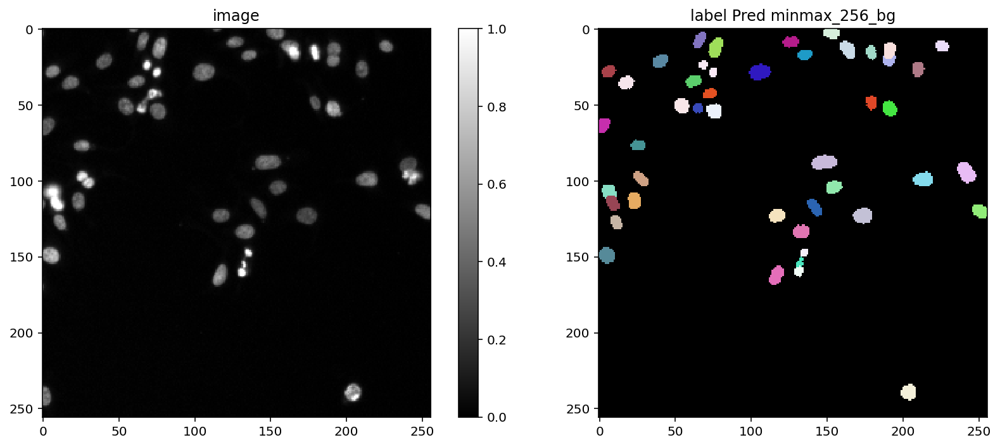

Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
56/56 [==============================] - 11s 155ms/step - loss: 2.6958 - prob_loss: 0.3804 - dist_loss: 11.5769 - prob_kld: 0.3052 - dist_relevant_mae: 11.5766 - dist_relevant_mse: 243.9044 - dist_dist_iou_metric: 0.0956 - val_loss: 2.1905 - val_prob_loss: 0.3195 - val_dist_loss: 9.3548 - val_prob_kld: 0.2381 - val_dist_relevant_mae: 9.3543 - val_dist_relevant_mse: 180.2322 - val_dist_dist_iou_metric: 0.1903 - lr: 3.0000e-04
Epoch 2/100
56/56 [==============================] - 6s 108ms/step - loss: 1.8581 - prob_loss: 0.3087 - dist_loss: 7.7470 - prob_kld: 0.2320 - dist_relevant_mae: 7.7462 - dist_relevant_mse: 121.5600 - dist_dist_iou_metric: 0.3039 - val_loss: 1.7095 - val_prob_loss: 0.2867 - val_dist_loss: 7.1138 - val_prob_kld: 0.2054 - val_dist_relevant_mae: 7.1130 - val_dist_relevant_mse: 111.9043 - val_dist_dist_iou_metric: 0.3137 - lr: 3.0000e-04
Epoch 3/100
56/56 [==============================] - 6s 105ms/step

Epoch 20/100
56/56 [==============================] - 7s 118ms/step - loss: 0.6239 - prob_loss: 0.0969 - dist_loss: 2.6349 - prob_kld: 0.0207 - dist_relevant_mae: 2.6343 - dist_relevant_mse: 20.1078 - dist_dist_iou_metric: 0.6700 - val_loss: 0.6609 - val_prob_loss: 0.1014 - val_dist_loss: 2.7974 - val_prob_kld: 0.0201 - val_dist_relevant_mae: 2.7969 - val_dist_relevant_mse: 21.2528 - val_dist_dist_iou_metric: 0.6502 - lr: 3.0000e-04
Epoch 21/100
56/56 [==============================] - 7s 121ms/step - loss: 0.6554 - prob_loss: 0.0973 - dist_loss: 2.7905 - prob_kld: 0.0201 - dist_relevant_mae: 2.7900 - dist_relevant_mse: 22.0482 - dist_dist_iou_metric: 0.6592 - val_loss: 0.6289 - val_prob_loss: 0.1006 - val_dist_loss: 2.6415 - val_prob_kld: 0.0192 - val_dist_relevant_mae: 2.6409 - val_dist_relevant_mse: 19.5885 - val_dist_dist_iou_metric: 0.6813 - lr: 3.0000e-04
Epoch 22/100
56/56 [==============================] - 6s 112ms/step - loss: 0.6061 - prob_loss: 0.0956 - dist_loss: 2.5525 - p

Epoch 39/100
56/56 [==============================] - 5s 99ms/step - loss: 0.5115 - prob_loss: 0.0913 - dist_loss: 2.1013 - prob_kld: 0.0157 - dist_relevant_mae: 2.1009 - dist_relevant_mse: 13.4577 - dist_dist_iou_metric: 0.7285 - val_loss: 0.5493 - val_prob_loss: 0.1001 - val_dist_loss: 2.2463 - val_prob_kld: 0.0187 - val_dist_relevant_mae: 2.2458 - val_dist_relevant_mse: 14.3121 - val_dist_dist_iou_metric: 0.7181 - lr: 3.0000e-04
Epoch 40/100
56/56 [==============================] - 6s 116ms/step - loss: 0.5228 - prob_loss: 0.0929 - dist_loss: 2.1496 - prob_kld: 0.0163 - dist_relevant_mae: 2.1491 - dist_relevant_mse: 14.1027 - dist_dist_iou_metric: 0.7282 - val_loss: 0.5451 - val_prob_loss: 0.0980 - val_dist_loss: 2.2356 - val_prob_kld: 0.0166 - val_dist_relevant_mae: 2.2352 - val_dist_relevant_mse: 14.2814 - val_dist_dist_iou_metric: 0.7224 - lr: 3.0000e-04
Epoch 41/100
56/56 [==============================] - 6s 110ms/step - loss: 0.5293 - prob_loss: 0.0950 - dist_loss: 2.1716 - pr

Epoch 58/100
56/56 [==============================] - 6s 106ms/step - loss: 0.4581 - prob_loss: 0.0903 - dist_loss: 1.8391 - prob_kld: 0.0156 - dist_relevant_mae: 1.8387 - dist_relevant_mse: 10.2328 - dist_dist_iou_metric: 0.7523 - val_loss: 0.5144 - val_prob_loss: 0.1005 - val_dist_loss: 2.0694 - val_prob_kld: 0.0191 - val_dist_relevant_mae: 2.0689 - val_dist_relevant_mse: 11.8177 - val_dist_dist_iou_metric: 0.7455 - lr: 3.0000e-04
Epoch 59/100
56/56 [==============================] - 6s 103ms/step - loss: 0.4702 - prob_loss: 0.0919 - dist_loss: 1.8915 - prob_kld: 0.0157 - dist_relevant_mae: 1.8910 - dist_relevant_mse: 10.6615 - dist_dist_iou_metric: 0.7519 - val_loss: 0.4787 - val_prob_loss: 0.0967 - val_dist_loss: 1.9099 - val_prob_kld: 0.0153 - val_dist_relevant_mae: 1.9094 - val_dist_relevant_mse: 10.5020 - val_dist_dist_iou_metric: 0.7530 - lr: 3.0000e-04
Epoch 60/100
56/56 [==============================] - 6s 110ms/step - loss: 0.4710 - prob_loss: 0.0923 - dist_loss: 1.8935 - p

Epoch 77/100
56/56 [==============================] - 7s 118ms/step - loss: 0.4444 - prob_loss: 0.0910 - dist_loss: 1.7670 - prob_kld: 0.0148 - dist_relevant_mae: 1.7666 - dist_relevant_mse: 9.8963 - dist_dist_iou_metric: 0.7670 - val_loss: 0.4558 - val_prob_loss: 0.0960 - val_dist_loss: 1.7990 - val_prob_kld: 0.0146 - val_dist_relevant_mae: 1.7986 - val_dist_relevant_mse: 9.1261 - val_dist_dist_iou_metric: 0.7733 - lr: 3.0000e-04
Epoch 78/100
56/56 [==============================] - 7s 126ms/step - loss: 0.4382 - prob_loss: 0.0903 - dist_loss: 1.7391 - prob_kld: 0.0146 - dist_relevant_mae: 1.7387 - dist_relevant_mse: 8.8564 - dist_dist_iou_metric: 0.7666 - val_loss: 0.4379 - val_prob_loss: 0.0965 - val_dist_loss: 1.7073 - val_prob_kld: 0.0151 - val_dist_relevant_mae: 1.7068 - val_dist_relevant_mse: 8.8064 - val_dist_dist_iou_metric: 0.7737 - lr: 3.0000e-04
Epoch 79/100
56/56 [==============================] - 7s 118ms/step - loss: 0.4208 - prob_loss: 0.0894 - dist_loss: 1.6571 - prob_

Epoch 96/100
56/56 [==============================] - 6s 104ms/step - loss: 0.4259 - prob_loss: 0.0939 - dist_loss: 1.6601 - prob_kld: 0.0143 - dist_relevant_mae: 1.6597 - dist_relevant_mse: 8.4818 - dist_dist_iou_metric: 0.7817 - val_loss: 0.4244 - val_prob_loss: 0.0948 - val_dist_loss: 1.6481 - val_prob_kld: 0.0134 - val_dist_relevant_mae: 1.6477 - val_dist_relevant_mse: 7.9616 - val_dist_dist_iou_metric: 0.7865 - lr: 3.0000e-04
Epoch 97/100
56/56 [==============================] - 6s 110ms/step - loss: 0.4122 - prob_loss: 0.0871 - dist_loss: 1.6256 - prob_kld: 0.0144 - dist_relevant_mae: 1.6252 - dist_relevant_mse: 7.9737 - dist_dist_iou_metric: 0.7755 - val_loss: 0.4208 - val_prob_loss: 0.0952 - val_dist_loss: 1.6281 - val_prob_kld: 0.0138 - val_dist_relevant_mae: 1.6277 - val_dist_relevant_mse: 7.8501 - val_dist_dist_iou_metric: 0.7884 - lr: 3.0000e-04
Epoch 98/100
56/56 [==============================] - 6s 104ms/step - loss: 0.4230 - prob_loss: 0.0937 - dist_loss: 1.6463 - prob_

base_model.py (149): output path for model already exists, files may be overwritten: /tf/stardist/examples/sparse2D_DSB/dsb2018_paper03/minmax_full_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 50/50 [00:12<00:00,  3.96it/s]


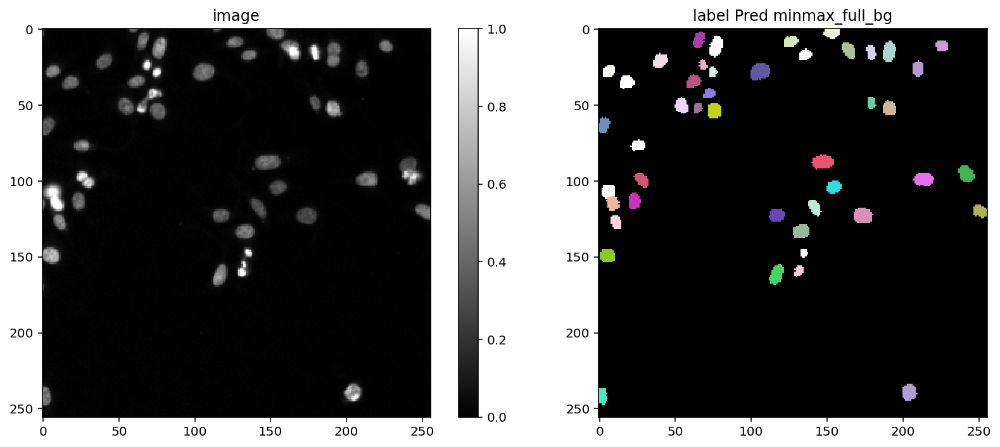

In [16]:
stats_list_dict = {}
for include_bg in (False, True):
    for mode in ('min', 'max', 'minmax'):
        key = f'{mode}{"_bg" if include_bg else ""}'
        stats_list_dict[key] = run_analysis(
            X_trn,
            Y_trn,
            X_val,
            Y_val,
            train_model,
            eval_model,
            mode=mode,
            is_train=is_train,
            include_bg=include_bg,
            conf=conf,
            basedir='dsb2018_paper03',
            augmenter=augmenter,
        )

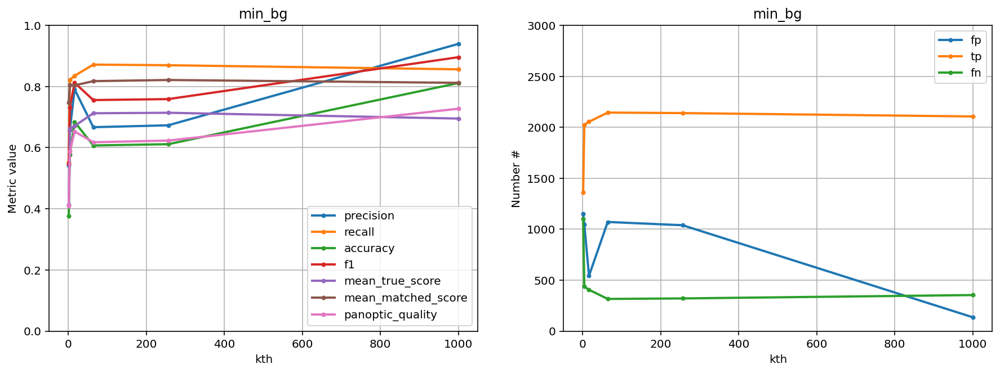

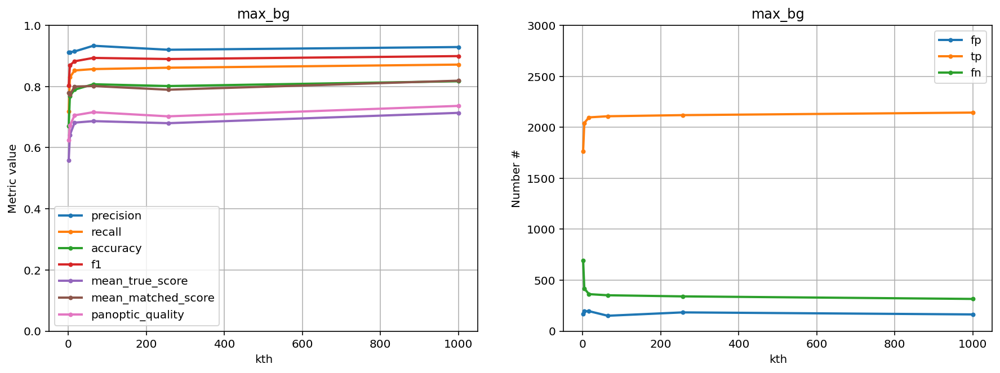

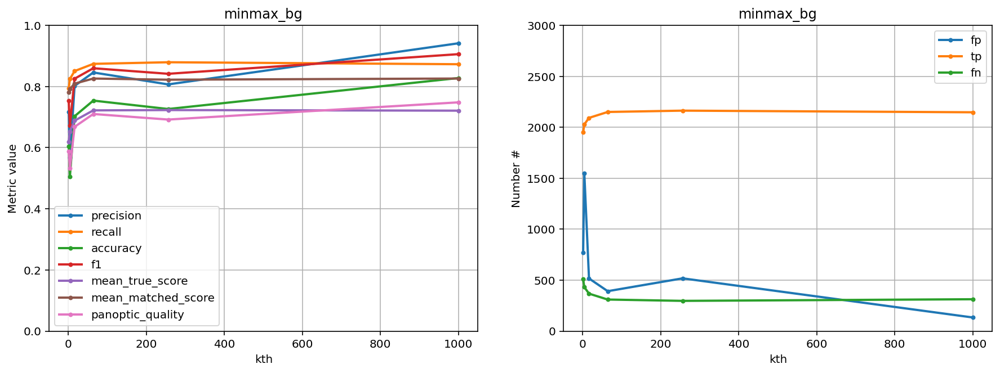

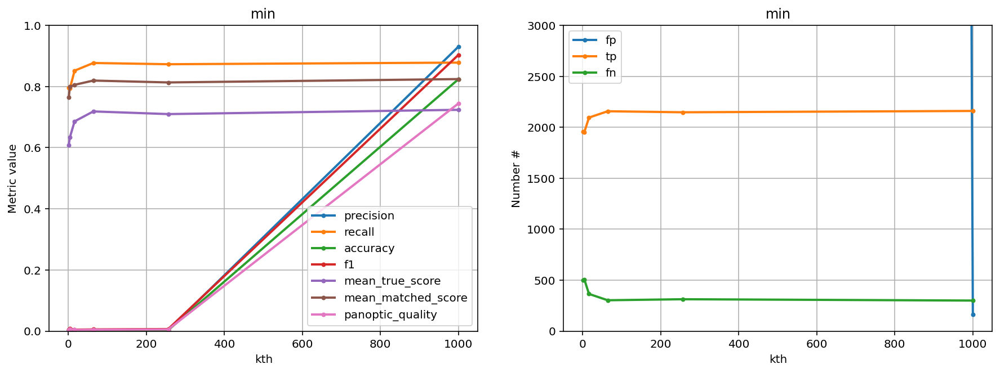

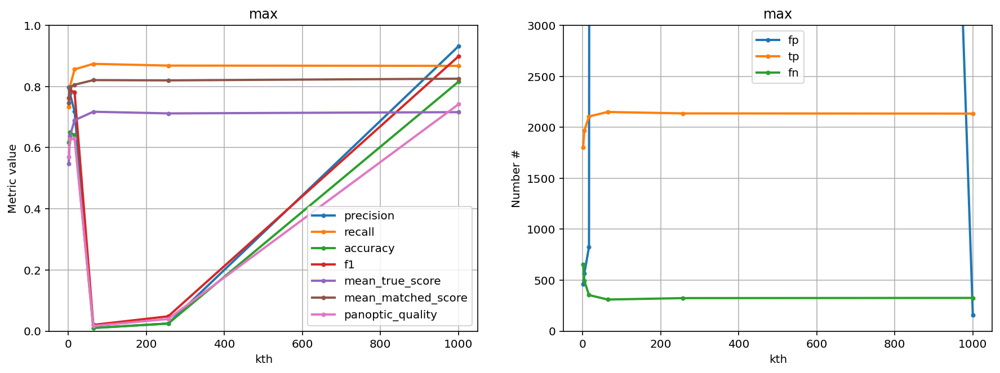

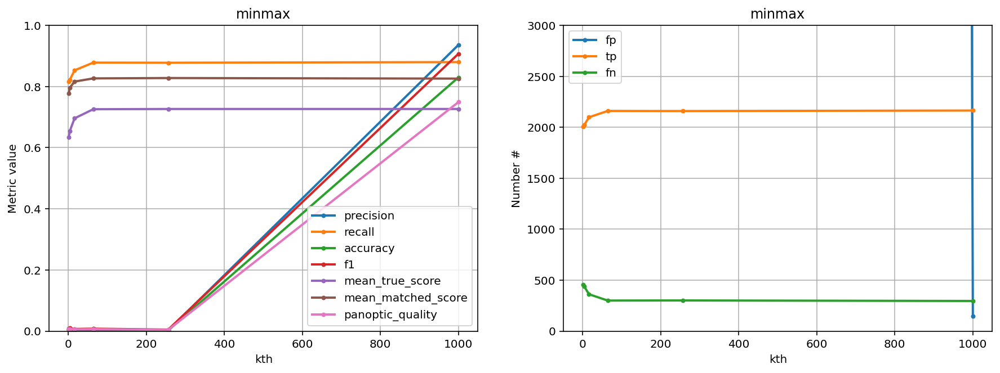

In [15]:
for include_bg in (True, False):
    for mode in ('min', 'max', 'minmax'):
        key = f'{mode}{"_bg" if include_bg else ""}'
        plot_stats(stats_list_dict[key], key)